## General setup

In [3]:
import malariagen_data
import allel
import plotly.express as px
from scipy.stats import chisquare
import datetime
%run ~/vector-ops/setup-bespin.ipynb

conda_prefix:  /home/conda/global/envs/global-binder-4.6.0
current_environment:  global/global-binder-4.6.0


In [5]:
ag3 = malariagen_data.Ag3(pre=True)
af1 = malariagen_data.Af1(pre=True)

In [6]:
ag3.genome_features().query("type == 'gene'")

,contig,source,type,start,end,score,strand,phase,ID,Parent,Name,description
1,2L,VectorBase,gene,157348,186936,NaN,-,NaN,AGAP004677,NaN,NaN,methylenetetrahydrofolate dehydrogenase(NAD ) ...
24,2L,VectorBase,gene,203779,205293,NaN,+,NaN,AGAP004678,NaN,NaN,NaN
32,2L,VectorBase,gene,207894,210460,NaN,+,NaN,AGAP004679,NaN,NaN,Folylpolyglutamate synthase [Source:UniProtKB/...
61,2L,VectorBase,gene,271285,271815,NaN,+,NaN,AGAP004680,NaN,NaN,NaN
65,2L,VectorBase,gene,358329,359280,NaN,-,NaN,AGAP004681,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
196078,X,VectorBase,gene,24086190,24087589,NaN,+,NaN,AGAP001092,NaN,NaN,NaN
196086,X,VectorBase,gene,24094799,24142048,NaN,+,NaN,AGAP001093,NaN,NaN,"fos-like antigen, invertebrate [Source:VB Comm..."
196098,X,VectorBase,gene,24231498,24256349,NaN,-,NaN,AGAP001094,NaN,run,runt [Source:VB Community Annotation]
196126,Y_unplaced,VectorBase,gene,26264,27106,NaN,-,NaN,AGAP029221,NaN,Yob,Male determiner protein Yob [Source:UniProtKB/...


In [7]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Guinea"]')#, "Burkina Faso", "Cote d\'Ivoire"]')
t = meta_pre.groupby(["taxon", "location","contributor", "sample_set","year","month"]).size()
t

taxon       location             contributor          sample_set                year  month
coluzzii    Koundara             Ken Vernick          AG1000G-GN-A              2012  10        4
                                                      AG1000G-GN-B              2012  10        7
            Nzerekore_Gbily      Alfred Amambua-Ngwa  1330-VO-GN-LAMA-VMF00250  2022  1         2
            Siguiri_Dankakoro    Alfred Amambua-Ngwa  1330-VO-GN-LAMA-VMF00250  2022  1        81
            Siguiri_Kinebakoura  Alfred Amambua-Ngwa  1330-VO-GN-LAMA-VMF00250  2022  1        81
gambiae     Korabo               Jacob E Crawford     crawford-2016             2012  10        1
            Koraboh              Ken Vernick          AG1000G-GN-A              2012  10       23
                                                      AG1000G-GN-B              2012  10       38
            Koundara             Ken Vernick          AG1000G-GN-A              2012  10       18
                          

In [8]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Mali"] and taxon == "coluzzii"')#, "Burkina Faso", "Cote d\'Ivoire"]')
t = meta_pre.groupby(["location","contributor", "sample_set","year","month"]).size()
t

location           contributor    sample_set                        year  month
Dallowere          Tovi Lehmann   1177-VO-ML-LEHMANN-VMF00004       2012   6       10
                                                                           9        8
                                                                           10       8
                                                                           11       2
                                                                    2014   5       16
                                                                           6       48
                                                                           9       13
                                                                           10      50
                                                                    2015   4       48
                                                                           6       49
                                                            

In [ ]:
date_list = []
study_list = []
value_list = []
for i in t.index:
    if i[4] == -1:
        month = 1
    else:
        month = i[4]
    date_list.append(datetime.date(i[3], month, 1))
    study_list.append(i[2])
    value_list.append(t[i])
ml_col_df = pd.DataFrame(list(zip(date_list, study_list, value_list)),
               columns =['Date', 'Study', 'Count'])
px.bar(ml_col_df, x = "Date", y = "Count", color = "Study", title = "Mali - Coluzzii")

In [ ]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Mali"] and taxon == "gambiae"')#, "Burkina Faso", "Cote d\'Ivoire"]')
t = meta_pre.groupby(["location","contributor", "sample_set","year","month"]).size()
t

location        contributor         sample_set                        year  month
Bancoumana      Nora Besansky       AG1000G-ML-B                      2004   8        9
Dallowere       Tovi Lehmann        1177-VO-ML-LEHMANN-VMF00004       2012   9        5
                                                                      2014   9        2
                                                                             10      14
                                                                      2015   9        6
                                                                             10      17
Doneguebougou   Greg Lanzaro        campos-2021                       2006  -1        3
Faladje         Antoine Dara        1270-VO-MULTI-PAMGEN-VMF00244     2021   9       14
                                                                             10      34
                                                                      2022   9        5
Fanzana         Nora Besansky       AG

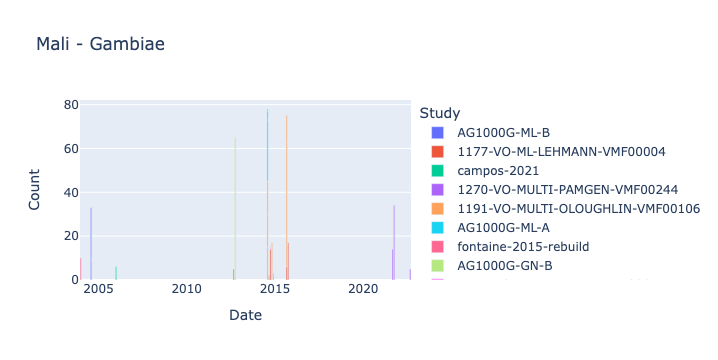

In [ ]:
date_list = []
study_list = []
value_list = []
for i in t.index:
    if i[4] == -1:
        month = 1
    else:
        month = i[4]
    date_list.append(datetime.date(i[3], month, 1))
    study_list.append(i[2])
    value_list.append(t[i])
ml_col_df = pd.DataFrame(list(zip(date_list, study_list, value_list)),
               columns =['Date', 'Study', 'Count'])
px.bar(ml_col_df, x = "Date", y = "Count", color = "Study", title = "Mali - Gambiae")

In [ ]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Mali"] and taxon == "arabiensis"')#, "Burkina Faso", "Cote d\'Ivoire"]')
t = meta_pre.groupby(["taxon","contributor", "sample_set","year","month"]).size()
t

taxon       contributor    sample_set                     year  month
arabiensis  Antoine Dara   1270-VO-MULTI-PAMGEN-VMF00244  2021  9        21
                                                                10        7
            Nora Besansky  AG1000G-ML-B                   2004  8         2
            Tovi Lehmann   1177-VO-ML-LEHMANN-VMF00004    2012  10        1
                                                          2014  9         1
                                                                10       15
                                                          2015  6         1
                                                                9         2
                                                                10        9
dtype: int64

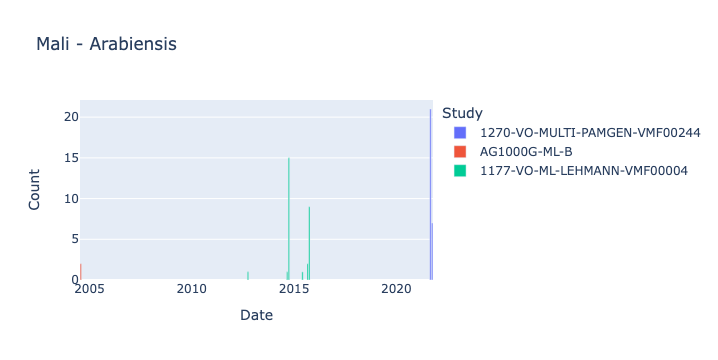

In [ ]:
date_list = []
study_list = []
value_list = []
for i in t.index:
    if i[4] == -1:
        month = 1
    else:
        month = i[4]
    date_list.append(datetime.date(i[3], month, 1))
    study_list.append(i[2])
    value_list.append(t[i])
ml_col_df = pd.DataFrame(list(zip(date_list, study_list, value_list)),
               columns =['Date', 'Study', 'Count'])
px.bar(ml_col_df, x = "Date", y = "Count", color = "Study", title = "Mali - Arabiensis")

In [ ]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Burkina Faso"] and taxon == "coluzzii"')#, "Burkina Faso", "Cote d\'Ivoire"]')
t = meta_pre.groupby(["location","contributor", "sample_set","year","month"]).size()
t

location         contributor         sample_set                        year  month
Bana             Michael.C.Fontaine  fontaine-2015-rebuild             2012  -1        2
Bana Market      Austin Burt         1191-VO-MULTI-OLOUGHLIN-VMF00140  2014   10      49
                                                                       2015   4       24
                                                                              7       30
                                                                       2016   10      28
                                                                       2017   5       50
Bana Village     Austin Burt         1191-VO-MULTI-OLOUGHLIN-VMF00140  2015   4       21
                                                                              7       21
                                                                       2016   6       38
                                                                              8        3
                           

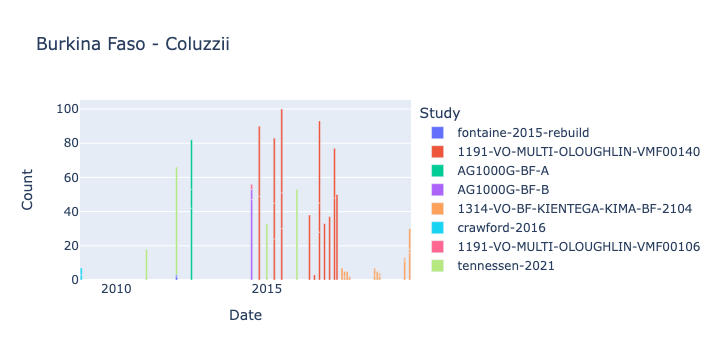

In [ ]:
date_list = []
study_list = []
value_list = []
for i in t.index:
    if i[4] == -1:
        month = 1
    else:
        month = i[4]
    date_list.append(datetime.date(i[3], month, 1))
    study_list.append(i[2])
    value_list.append(t[i])
ml_col_df = pd.DataFrame(list(zip(date_list, study_list, value_list)),
               columns =['Date', 'Study', 'Count'])
px.bar(ml_col_df, x = "Date", y = "Count", color = "Study", title = "Burkina Faso - Coluzzii")

In [ ]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Burkina Faso"] and taxon == "gambiae"')#, "Burkina Faso", "Cote d\'Ivoire"]')
t = meta_pre.groupby(["taxon","contributor", "sample_set","year","month"]).size()
t

taxon    contributor         sample_set                        year  month
gambiae  Austin Burt         1191-VO-MULTI-OLOUGHLIN-VMF00106  2014   7        28
                             1191-VO-MULTI-OLOUGHLIN-VMF00140  2014   10       96
                                                               2015   1        17
                                                                      2        11
                                                                      7       113
                                                               2016   6        12
                                                                      8         1
                                                                      10       91
                                                               2017   4        37
                             AG1000G-BF-A                      2012   7        99
                             AG1000G-BF-B                      2014   7        46
         Mahamadi Kient

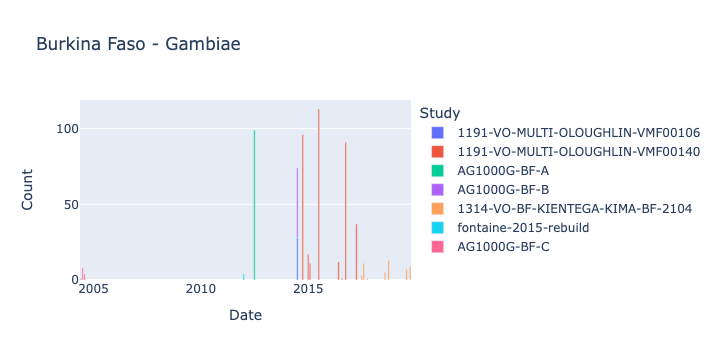

In [ ]:
date_list = []
study_list = []
value_list = []
for i in t.index:
    if i[4] == -1:
        month = 1
    else:
        month = i[4]
    date_list.append(datetime.date(i[3], month, 1))
    study_list.append(i[2])
    value_list.append(t[i])
ml_col_df = pd.DataFrame(list(zip(date_list, study_list, value_list)),
               columns =['Date', 'Study', 'Count'])
px.bar(ml_col_df, x = "Date", y = "Count", color = "Study", title = "Burkina Faso - Gambiae")

In [ ]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Burkina Faso"] and taxon == "arabiensis"')#, "Burkina Faso", "Cote d\'Ivoire"]')
t = meta_pre.groupby(["taxon","contributor", "sample_set","year","month"]).size()
t

taxon       contributor         sample_set                        year  month
arabiensis  Austin Burt         1191-VO-MULTI-OLOUGHLIN-VMF00140  2014   10       9
                                                                  2015   1       21
                                                                         2       27
                                                                         4       23
                                                                         7       17
                                                                  2016   10      14
                                                                  2017   4        1
                                AG1000G-BF-B                      2014   7        3
            Jacob E Crawford    crawford-2016                     2008   11       5
            Mahamadi Kientega   1314-VO-BF-KIENTEGA-KIMA-BF-2104  2017   7        1
                                                                         8        

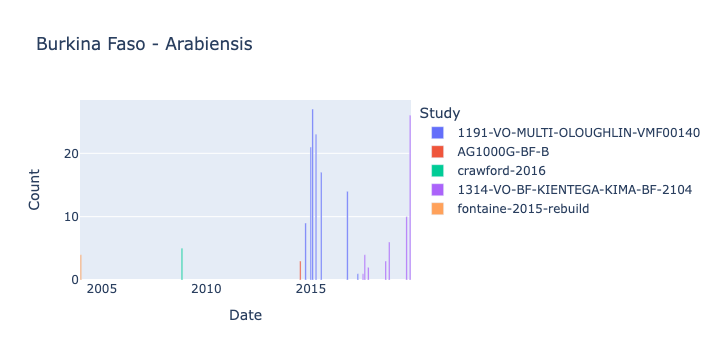

In [ ]:
date_list = []
study_list = []
value_list = []
for i in t.index:
    if i[4] == -1:
        month = 1
    else:
        month = i[4]
    date_list.append(datetime.date(i[3], month, 1))
    study_list.append(i[2])
    value_list.append(t[i])
ml_col_df = pd.DataFrame(list(zip(date_list, study_list, value_list)),
               columns =['Date', 'Study', 'Count'])
px.bar(ml_col_df, x = "Date", y = "Count", color = "Study", title = "Burkina Faso - Arabiensis")

In [ ]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Burkina Faso"] and taxon == "gcx4"')#, "Burkina Faso", "Cote d\'Ivoire"]')
t = meta_pre.groupby(["taxon","contributor", "sample_set","year","month"]).size()
t

taxon  contributor       sample_set      year  month
gcx4   Jacob E Crawford  crawford-2016   2007   11       2
                                                12       2
                                         2008   11       8
       Jacob Tennessen   tennessen-2021  2011  -1       41
dtype: int64

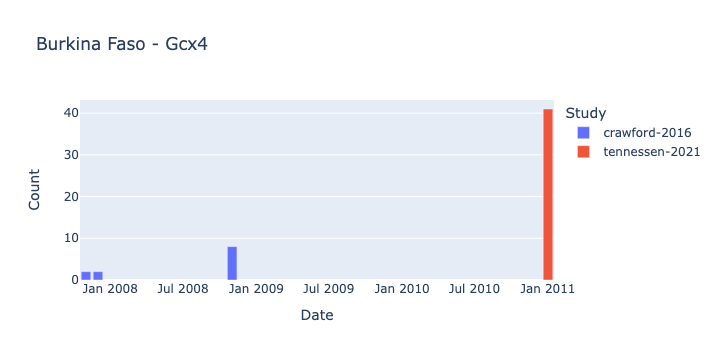

In [ ]:
date_list = []
study_list = []
value_list = []
for i in t.index:
    if i[4] == -1:
        month = 1
    else:
        month = i[4]
    date_list.append(datetime.date(i[3], month, 1))
    study_list.append(i[2])
    value_list.append(t[i])
ml_col_df = pd.DataFrame(list(zip(date_list, study_list, value_list)),
               columns =['Date', 'Study', 'Count'])
px.bar(ml_col_df, x = "Date", y = "Count", color = "Study", title = "Burkina Faso - Gcx4")

In [ ]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Cote d\'Ivoire"] and taxon == "coluzzii"')#, "Burkina Faso", "Cote d\'Ivoire"]')
t = meta_pre.groupby(["location","contributor", "sample_set","year","month"]).size()

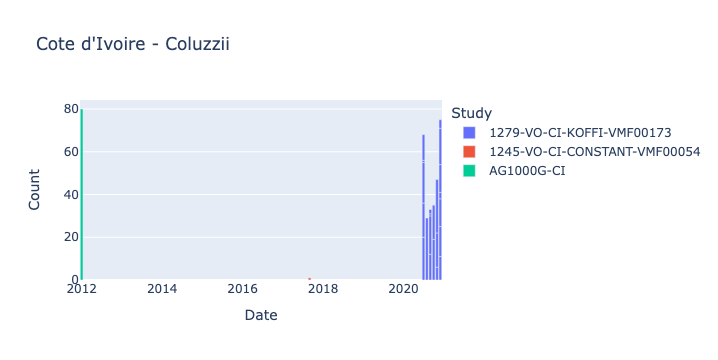

In [ ]:
date_list = []
study_list = []
value_list = []
for i in t.index:
    if i[4] == -1:
        month = 1
    else:
        month = i[4]
    date_list.append(datetime.date(i[3], month, 1))
    study_list.append(i[2])
    value_list.append(t[i])
ml_col_df = pd.DataFrame(list(zip(date_list, study_list, value_list)),
               columns =['Date', 'Study', 'Count'])
px.bar(ml_col_df, x = "Date", y = "Count", color = "Study", title = "Cote d'Ivoire - Coluzzii")

In [ ]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Cote d\'Ivoire"] and taxon == "gambiae"')#, "Burkina Faso", "Cote d\'Ivoire"]')
t = meta_pre.groupby(["location","contributor", "sample_set","year","month"]).size()
t

location    contributor       sample_set                    year  month
Aboisso     Alphonsine Koffi  1279-VO-CI-KOFFI-VMF00173     2020  8         5
                                                                  12        1
            Edi Constant      1245-VO-CI-CONSTANT-VMF00054  2017  9        37
Bouake      Alphonsine Koffi  1279-VO-CI-KOFFI-VMF00173     2020  7         3
                                                                  11        7
Fagnampleu  Alphonsine Koffi  1279-VO-CI-KOFFI-VMF00173     2020  9         2
                                                                  12        1
Korhogo     Alphonsine Koffi  1279-VO-CI-KOFFI-VMF00173     2020  9        19
                                                                  12        8
Man         Alphonsine Koffi  1279-VO-CI-KOFFI-VMF00173     2020  9         1
                                                                  12        4
Morovine    Alphonsine Koffi  1279-VO-CI-KOFFI-VMF00173     2020  9   

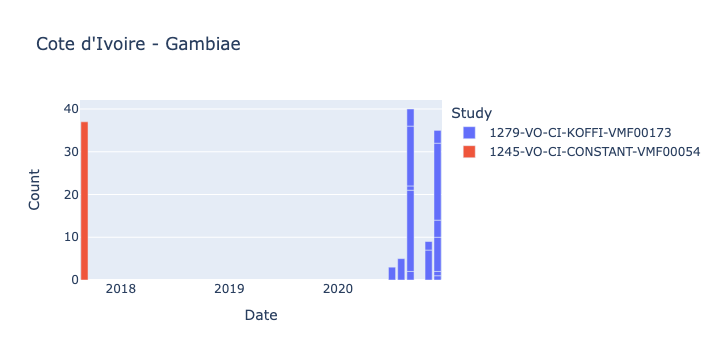

In [ ]:
date_list = []
study_list = []
value_list = []
for i in t.index:
    if i[4] == -1:
        month = 1
    else:
        month = i[4]
    date_list.append(datetime.date(i[3], month, 1))
    study_list.append(i[2])
    value_list.append(t[i])
ml_col_df = pd.DataFrame(list(zip(date_list, study_list, value_list)),
               columns =['Date', 'Study', 'Count'])
px.bar(ml_col_df, x = "Date", y = "Count", color = "Study", title = "Cote d'Ivoire - Gambiae")

In [ ]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Mali"]')#, "Burkina Faso", "Cote d\'Ivoire"]')
meta_pre.groupby(["country","taxon","sample_set","year","month"]).size()

country  taxon       sample_set                   year  month
Mali     arabiensis  1177-VO-ML-LEHMANN-VMF00004  2012   10       1
                                                  2014   9        1
                                                         10      15
                                                  2015   6        1
                                                         9        2
                                                                 ..
         gambiae     AG1000G-ML-B                 2004   8       33
                     campos-2021                  2006  -1        6
                     fontaine-2015-rebuild        2004  -1       10
         unassigned  1177-VO-ML-LEHMANN-VMF00004  2015   9        1
                     AG1000G-GN-B                 2012   10       2
Length: 67, dtype: int64

In [ ]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Burkina Faso"] and taxon in ["arabiensis", "gcx4", "unassigned"]')#, , "Cote d\'Ivoire"]')
meta_pre.groupby(["country","taxon","sample_set","year","month"]).size()

country       taxon       sample_set                        year  month
Burkina Faso  arabiensis  1191-VO-MULTI-OLOUGHLIN-VMF00140  2014   10       9
                                                            2015   1       21
                                                                   2       27
                                                                   4       23
                                                                   7       17
                                                            2016   10      14
                                                            2017   4        1
                          1314-VO-BF-KIENTEGA-KIMA-BF-2104  2017   7        1
                                                                   8        4
                                                                   10       2
                                                            2018   8        3
                                                                   10 

In [28]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Burkina Faso"] and taxon not in ["arabiensis", "gcx4", "unassigned"]')#, , "Cote d\'Ivoire"]')
meta_pre.groupby(["country","taxon","sample_set","year","month"]).size()

country       taxon     sample_set                        year  month
Burkina Faso  coluzzii  1191-VO-MULTI-OLOUGHLIN-VMF00106  2014   7         3
                        1191-VO-MULTI-OLOUGHLIN-VMF00140  2014   10       90
                                                          2015   4        83
                                                                 7       100
                                                          2016   6        38
                                                                 8         3
                                                                 10       93
                                                                 12       33
                                                          2017   2        37
                                                                 4        77
                                                                 5        50
                        1314-VO-BF-KIENTEGA-KIMA-BF-2104  2017   7         7
      

In [29]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Cote d\'Ivoire"]')#, "Burkina Faso", "Cote d\'Ivoire"]')
meta_pre.groupby(["country","taxon","sample_set","year","month"]).size()

country        taxon     sample_set                    year  month
Cote d'Ivoire  coluzzii  1245-VO-CI-CONSTANT-VMF00054  2017   9        1
                         1279-VO-CI-KOFFI-VMF00173     2020   7       68
                                                              8       29
                                                              9       33
                                                              10      35
                                                              11      47
                                                              12      75
                         AG1000G-CI                    2012  -1       80
               gambiae   1245-VO-CI-CONSTANT-VMF00054  2017   9       37
                         1279-VO-CI-KOFFI-VMF00173     2020   7        3
                                                              8        5
                                                              9       40
                                                         

In [30]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Ghana"] and taxon == "coluzzii"')#, "Burkina Faso", "Cote d\'Ivoire"]')
t = meta_pre.groupby(["country","taxon","sample_set","year","month"]).size()

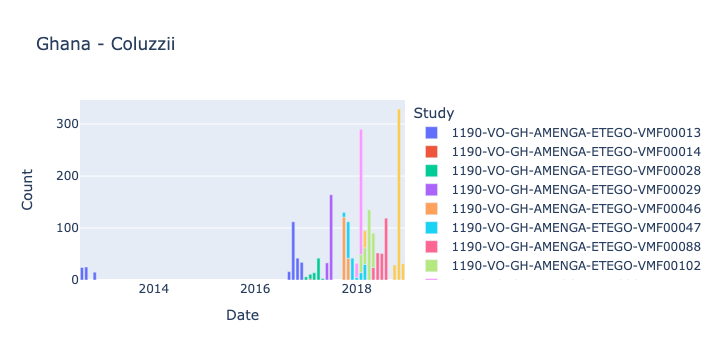

In [31]:
date_list = []
study_list = []
value_list = []
for i in t.index:
    if i[4] == -1:
        month = 1
    else:
        month = i[4]
    date_list.append(datetime.date(i[3], month, 1))
    study_list.append(i[2])
    value_list.append(t[i])
ml_col_df = pd.DataFrame(list(zip(date_list, study_list, value_list)),
               columns =['Date', 'Study', 'Count'])
px.bar(ml_col_df, x = "Date", y = "Count", color = "Study", title = "Ghana - Coluzzii")

In [32]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Benin"] and taxon == "coluzzii"')#, "Burkina Faso", "Cote d\'Ivoire"]')
t = meta_pre.groupby(["country","taxon","sample_set","year","month"]).size()

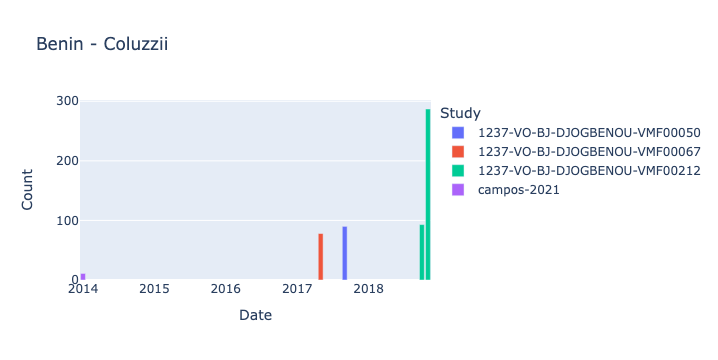

In [33]:
date_list = []
study_list = []
value_list = []
for i in t.index:
    if i[4] == -1:
        month = 1
    else:
        month = i[4]
    date_list.append(datetime.date(i[3], month, 1))
    study_list.append(i[2])
    value_list.append(t[i])
ml_col_df = pd.DataFrame(list(zip(date_list, study_list, value_list)),
               columns =['Date', 'Study', 'Count'])
px.bar(ml_col_df, x = "Date", y = "Count", color = "Study", title = "Benin - Coluzzii")

In [34]:
meta_pre = ag3.sample_metadata(sample_query = 'country in ["Mali", "Burkina Faso", "Cote d\'Ivoire", "Ghana", "Benin"] and taxon == "coluzzii"')
meta_pre.pivot_table(
    index=["country"], 
    columns=["sample_set"], 
    values="sample_id",
    aggfunc="count",
    fill_value=0
)

sample_set,1177-VO-ML-LEHMANN-VMF00004,1177-VO-ML-LEHMANN-VMF00015,1190-VO-GH-AMENGA-ETEGO-VMF00013,1190-VO-GH-AMENGA-ETEGO-VMF00014,1190-VO-GH-AMENGA-ETEGO-VMF00028,1190-VO-GH-AMENGA-ETEGO-VMF00029,1190-VO-GH-AMENGA-ETEGO-VMF00046,1190-VO-GH-AMENGA-ETEGO-VMF00047,1190-VO-GH-AMENGA-ETEGO-VMF00088,1190-VO-GH-AMENGA-ETEGO-VMF00102,...,AG1000G-BF-B,AG1000G-CI,AG1000G-GH,AG1000G-GN-B,AG1000G-ML-A,AG1000G-ML-B,campos-2021,crawford-2016,fontaine-2015-rebuild,tennessen-2021
country,,,,,,,,,,,,,,,,,,,,,
Benin,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,11,0,0,0
Burkina Faso,0,0,0,0,0,0,0,0,0,0,...,53,0,0,0,0,0,0,7,3,167
Cote d'Ivoire,0,0,0,0,0,0,0,0,0,0,...,0,80,0,0,0,0,0,0,0,0
Ghana,0,0,204,2,74,197,163,170,246,268,...,0,0,64,0,0,0,0,0,0,0
Mali,573,22,0,0,0,0,0,0,0,0,...,0,0,0,27,27,36,14,0,0,0


In [35]:
meta_pre.release.unique()

array(['3.1', '3.2', '3.3', '3.7', '3.4', '3.10', '3.6', '3.8', '3.0',
       '3.9'], dtype=object)

In [36]:
sample_sets = list(meta_pre.sample_set.unique())
sample_sets

['1177-VO-ML-LEHMANN-VMF00004',
 '1177-VO-ML-LEHMANN-VMF00015',
 '1190-VO-GH-AMENGA-ETEGO-VMF00013',
 '1190-VO-GH-AMENGA-ETEGO-VMF00014',
 '1190-VO-GH-AMENGA-ETEGO-VMF00028',
 '1190-VO-GH-AMENGA-ETEGO-VMF00029',
 '1190-VO-GH-AMENGA-ETEGO-VMF00046',
 '1190-VO-GH-AMENGA-ETEGO-VMF00047',
 '1190-VO-GH-AMENGA-ETEGO-VMF00088',
 '1190-VO-GH-AMENGA-ETEGO-VMF00102',
 '1191-VO-MULTI-OLOUGHLIN-VMF00106',
 '1191-VO-MULTI-OLOUGHLIN-VMF00140',
 '1237-VO-BJ-DJOGBENOU-VMF00050',
 '1237-VO-BJ-DJOGBENOU-VMF00067',
 '1237-VO-BJ-DJOGBENOU-VMF00212',
 '1244-VO-GH-YAWSON-VMF00051',
 '1244-VO-GH-YAWSON-VMF00149',
 '1245-VO-CI-CONSTANT-VMF00054',
 '1270-VO-MULTI-PAMGEN-VMF00244',
 '1279-VO-CI-KOFFI-VMF00173',
 '1314-VO-BF-KIENTEGA-KIMA-BF-2104',
 'AG1000G-BF-A',
 'AG1000G-BF-B',
 'AG1000G-CI',
 'AG1000G-GH',
 'AG1000G-GN-B',
 'AG1000G-ML-A',
 'AG1000G-ML-B',
 'campos-2021',
 'crawford-2016',
 'fontaine-2015-rebuild',
 'tennessen-2021']

In [35]:
sample_sets_no_balloon = [sample_set for sample_set in sample_sets if sample_set != '1177-VO-ML-LEHMANN-VMF00015']
sample_sets_no_3_9 = list(ag3.sample_metadata(sample_query = 'country in ["Mali", "Burkina Faso", "Cote d\'Ivoire"] and taxon == "coluzzii" and release != "3.9"').sample_set.unique())
sample_sets_no_3_9

['1177-VO-ML-LEHMANN-VMF00004',
 '1177-VO-ML-LEHMANN-VMF00015',
 '1191-VO-MULTI-OLOUGHLIN-VMF00106',
 '1191-VO-MULTI-OLOUGHLIN-VMF00140',
 '1245-VO-CI-CONSTANT-VMF00054',
 '1279-VO-CI-KOFFI-VMF00173',
 '1314-VO-BF-KIENTEGA-KIMA-BF-2104',
 'AG1000G-BF-A',
 'AG1000G-BF-B',
 'AG1000G-CI',
 'AG1000G-GN-B',
 'AG1000G-ML-A',
 'AG1000G-ML-B',
 'crawford-2016',
 'tennessen-2021']

In [36]:
# sample_sets = ['tennessen-2021', 'AG1000G-BF-A', 'AG1000G-BF-B', 'AG1000G-BF-C', 
#                'AG1000G-ML-A', 'AG1000G-ML-B', 'AG1000G-GN-B', '1191-VO-MULTI-OLOUGHLIN-VMF00106',
#                '1191-VO-MULTI-OLOUGHLIN-VMF00140', '1314-VO-BF-KIENTEGA-KIMA-BF-2104',
#                '1177-VO-ML-LEHMANN-VMF00004', '1177-VO-ML-LEHMANN-VMF00015', '1279-VO-CI-KOFFI-VMF00173',
#                'AG1000G-CI']
# sample_sets_no_balloon = ['tennessen-2021', 'AG1000G-BF-A', 'AG1000G-BF-B', 'AG1000G-BF-C', 
#                'AG1000G-ML-A', 'AG1000G-ML-B', 'AG1000G-GN-B', '1191-VO-MULTI-OLOUGHLIN-VMF00106',
#                '1191-VO-MULTI-OLOUGHLIN-VMF00140', '1314-VO-BF-KIENTEGA-KIMA-BF-2104',
#                '1177-VO-ML-LEHMANN-VMF00004', '1279-VO-CI-KOFFI-VMF00173', 'AG1000G-CI']

In [37]:
meta = ag3.sample_metadata(sample_sets=sample_sets_no_balloon, sample_query = 'country in ["Mali", "Burkina Faso", "Cote d\'Ivoire", "Ghana", "Benin"] and taxon == "coluzzii"')

In [38]:
meta.pivot_table(
    index=["country","admin1_name", "sample_set"], 
    columns=["year"], 
    values="sample_id",
    aggfunc="count",
    fill_value=0
)

year                                                                 2002  \
country       admin1_name          sample_set                               
Benin         Atlantique           1237-VO-BJ-DJOGBENOU-VMF00212        0   
                                   campos-2021                          0   
              Donga                1237-VO-BJ-DJOGBENOU-VMF00067        0   
              Mono                 1237-VO-BJ-DJOGBENOU-VMF00212        0   
              Oueme                1237-VO-BJ-DJOGBENOU-VMF00050        0   
              Zou                  campos-2021                          0   
Burkina Faso  Boucle du Mouhoun    crawford-2016                        0   
              Cascades             tennessen-2021                       0   
              Hauts-Bassins        1191-VO-MULTI-OLOUGHLIN-VMF00106     0   
                                   1191-VO-MULTI-OLOUGHLIN-VMF00140     0   
                                   1314-VO-BF-KIENTEGA-KIMA-BF-2104     0   
                                   AG1000G-BF-A                         0   
                                   AG1000G-BF-B                         0   
              Plateau Central      crawford-2016                        0   
Cote d'Ivoire Comoe                1245-VO-CI-CONSTANT-VMF00054         0   
                                   1279-VO-CI-KOFFI-VMF00173            0   
              Lagunes              AG1000G-CI                           0   
              Montagnes            1279-VO-CI-KOFFI-VMF00173            0   
              Savanes              1279-VO-CI-KOFFI-VMF00173            0   
              Vallée du Bandama    1279-VO-CI-KOFFI-VMF00173            0   
Ghana         Ashanti Region       1244-VO-GH-YAWSON-VMF00149           0   
              Central Region       1244-VO-GH-YAWSON-VMF00149           0   
                                   AG1000G-GH                           0   
              Eastern Region       AG1000G-GH                           0   
              Greater Accra Region 1244-VO-GH-YAWSON-VMF00051           0   
                                   AG1000G-GH                           0   
              Upper East Region    1190-VO-GH-AMENGA-ETEGO-VMF00013     0   
                                   1190-VO-GH-AMENGA-ETEGO-VMF00014     0   
                                   1190-VO-GH-AMENGA-ETEGO-VMF00028     0   
                                   1190-VO-GH-AMENGA-ETEGO-VMF00029     0   
                                   1190-VO-GH-AMENGA-ETEGO-VMF00046     0   
                                   1190-VO-GH-AMENGA-ETEGO-VMF00047     0   
                                   1190-VO-GH-AMENGA-ETEGO-VMF00088     0   
                                   1190-VO-GH-AMENGA-ETEGO-VMF00102     0   
              Western Region       AG1000G-GH                           0   
Mali          Koulikouro           1177-VO-ML-LEHMANN-VMF00004          0   
                                   1191-VO-MULTI-OLOUGHLIN-VMF00106     0   
                                   AG1000G-ML-A                         0   
                                   AG1000G-ML-B                         0   
                                   campos-2021                          2   
              Segou                1177-VO-ML-LEHMANN-VMF00004          0   
                                   AG1000G-ML-B                         0   
              Sikasso              AG1000G-GN-B                         0   

year                                                                 2004  \
country       admin1_name          sample_set                               
Benin         Atlantique           1237-VO-BJ-DJOGBENOU-VMF00212        0   
                                   campos-2021                          0   
              Donga                1237-VO-BJ-DJOGBENOU-VMF00067        0   
              Mono                 1237-VO-BJ-DJOGBENOU-VMF00212        0   
              Oueme                1237-VO-BJ-DJOGBENOU-VMF00050        

In [6]:
ref_dict = {'ML_Koulikouro_04': "taxon == 'coluzzii' and admin1_name == 'Koulikouro' and year == 2004",
            'ML_Segou_04': "taxon == 'coluzzii' and admin1_name == 'Segou' and year == 2004",
            'BF_Cascades_11': "taxon == 'coluzzii' and admin1_name == 'Cascades' and year == 2011",
            'ML_Koulikouro_12': "taxon == 'coluzzii' and admin1_name == 'Koulikouro' and year == 2012 and sample_set != '1177-VO-ML-LEHMANN-VMF00015'",
            'ML_Segou_12': "taxon == 'coluzzii' and admin1_name == 'Segou' and year == 2012 and sample_set != '1177-VO-ML-LEHMANN-VMF00015'",
            'ML_Sikasso_12': "taxon == 'coluzzii' and admin1_name == 'Sikasso'",
            'BF_Cascades_12': "taxon == 'coluzzii' and admin1_name == 'Cascades' and year == 2012",
            'BF_Hauts-Bassins_12': "taxon == 'coluzzii' and admin1_name == 'Hauts-Bassins' and year == 2012",
            'CI_Lagunes_12': "taxon == 'coluzzii' and admin1_name == 'Lagunes' and year == 2012",
            'GH_Central_12': "taxon == 'coluzzii' and admin1_name == 'Central Region' and year == 2012",
            'GH_Western_12': "taxon == 'coluzzii' and admin1_name == 'Western Region' and year == 2012",
            'ML_Segou_13': "taxon == 'coluzzii' and admin1_name == 'Segou' and year == 2013 and sample_set != '1177-VO-ML-LEHMANN-VMF00015'",
            'ML_Koulikouro_14': "taxon == 'coluzzii' and admin1_name == 'Koulikouro' and year == 2014 and sample_set != '1177-VO-ML-LEHMANN-VMF00015'",
            'ML_Segou_14': "taxon == 'coluzzii' and admin1_name == 'Segou' and year == 2014 and sample_set != '1177-VO-ML-LEHMANN-VMF00015'",
            'BF_Hauts-Bassins_14': "taxon == 'coluzzii' and admin1_name == 'Hauts-Bassins' and year == 2014",
            'ML_Koulikouro_15': "taxon == 'coluzzii' and admin1_name == 'Koulikouro' and year == 2015 and sample_set != '1177-VO-ML-LEHMANN-VMF00015'",
            'ML_Segou_15': "taxon == 'coluzzii' and admin1_name == 'Segou' and year == 2015",
            'BF_Cascades_15': "taxon == 'coluzzii' and admin1_name == 'Cascades' and year == 2015",
            'BF_Hauts-Bassins_15': "taxon == 'coluzzii' and admin1_name == 'Hauts-Bassins' and year == 2015",
            'BF_Cascades_16': "taxon == 'coluzzii' and admin1_name == 'Cascades' and year == 2016",
            'GH_UpperEast_16': "taxon == 'coluzzii' and admin1_name == 'Upper East Region' and year == 2016",
            'BF_Hauts-Bassins_16': "taxon == 'coluzzii' and admin1_name == 'Hauts-Bassins' and year == 2016",
            'BF_Hauts-Bassins_17': "taxon == 'coluzzii' and admin1_name == 'Hauts-Bassins' and year == 2017",
            'BJ_Donga_2017': "taxon == 'coluzzii' and admin1_name == 'Donga' and year == 2017",
            'BJ_Oueme_2017': "taxon == 'coluzzii' and admin1_name == 'Oueme' and year == 2017",
            'GH_UpperEast_17': "taxon == 'coluzzii' and admin1_name == 'Upper East Region' and year == 2017",
            'BF_Hauts-Bassins_18': "taxon == 'coluzzii' and admin1_name == 'Hauts-Bassins' and year == 2018",
            'BJ_Atlantique_18': "taxon == 'coluzzii' and admin1_name == 'Atlantique' and year == 2018",
            'BJ_Mono_18': "taxon == 'coluzzii' and admin1_name == 'Mono' and year == 2018",
            'GH_UpperEast_18': "taxon == 'coluzzii' and admin1_name == 'Upper East Region' and year == 2018",
            'GH_Accra_18': "taxon == 'coluzzii' and admin1_name == 'Greater Accra Region' and year == 2018",
            'GH_Ashanti_18': "taxon == 'coluzzii' and admin1_name == 'Ashanti Region' and year == 2018",
            'GH_Central_18': "taxon == 'coluzzii' and admin1_name == 'Central Region' and year == 2018",
            'BF_Hauts-Bassins_19': "taxon == 'coluzzii' and admin1_name == 'Hauts-Bassins' and year == 2019",
            'CI_Comoe_20': "taxon == 'coluzzii' and admin1_name == 'Comoe' and year == 2020",
            'CI_Montagnes_20': "taxon == 'coluzzii' and admin1_name == 'Montagnes' and year == 2020",
            'CI_ValleDuBandama_20': "taxon == 'coluzzii' and admin1_name == 'Vallée du Bandama' and year == 2020",
            'Balloon': "taxon == 'coluzzii' and sample_set == '1177-VO-ML-LEHMANN-VMF00015'"
                 }

In [7]:
ref_dict_lat = {'Balloon': "taxon == 'coluzzii' and sample_set == '1177-VO-ML-LEHMANN-VMF00015'",
                'ML_Koulikouro_04': "taxon == 'coluzzii' and admin1_name == 'Koulikouro' and year == 2004",
                'ML_Koulikouro_12': "taxon == 'coluzzii' and admin1_name == 'Koulikouro' and year == 2012 and sample_set != '1177-VO-ML-LEHMANN-VMF00015'",
                'ML_Koulikouro_14': "taxon == 'coluzzii' and admin1_name == 'Koulikouro' and year == 2014 and sample_set != '1177-VO-ML-LEHMANN-VMF00015'",
                'ML_Koulikouro_15': "taxon == 'coluzzii' and admin1_name == 'Koulikouro' and year == 2015 and sample_set != '1177-VO-ML-LEHMANN-VMF00015'",
                'ML_Segou_04': "taxon == 'coluzzii' and admin1_name == 'Segou' and year == 2004",
                'ML_Segou_12': "taxon == 'coluzzii' and admin1_name == 'Segou' and year == 2012 and sample_set != '1177-VO-ML-LEHMANN-VMF00015'",
                'ML_Segou_13': "taxon == 'coluzzii' and admin1_name == 'Segou' and year == 2013 and sample_set != '1177-VO-ML-LEHMANN-VMF00015'",
                'ML_Segou_14': "taxon == 'coluzzii' and admin1_name == 'Segou' and year == 2014 and sample_set != '1177-VO-ML-LEHMANN-VMF00015'",
                'ML_Segou_15': "taxon == 'coluzzii' and admin1_name == 'Segou' and year == 2015",
                'ML_Sikasso_12': "taxon == 'coluzzii' and admin1_name == 'Sikasso'",
                'BF_Hauts-Bassins_12': "taxon == 'coluzzii' and admin1_name == 'Hauts-Bassins' and year == 2012",
                'BF_Hauts-Bassins_14': "taxon == 'coluzzii' and admin1_name == 'Hauts-Bassins' and year == 2014",
                'BF_Hauts-Bassins_15': "taxon == 'coluzzii' and admin1_name == 'Hauts-Bassins' and year == 2015",
                'BF_Hauts-Bassins_16': "taxon == 'coluzzii' and admin1_name == 'Hauts-Bassins' and year == 2016",
                'BF_Hauts-Bassins_17': "taxon == 'coluzzii' and admin1_name == 'Hauts-Bassins' and year == 2017",
                'BF_Hauts-Bassins_18': "taxon == 'coluzzii' and admin1_name == 'Hauts-Bassins' and year == 2018",
                'BF_Hauts-Bassins_19': "taxon == 'coluzzii' and admin1_name == 'Hauts-Bassins' and year == 2019",
                'BF_Cascades_11': "taxon == 'coluzzii' and admin1_name == 'Cascades' and year == 2011",
                'BF_Cascades_12': "taxon == 'coluzzii' and admin1_name == 'Cascades' and year == 2012",
                'BF_Cascades_15': "taxon == 'coluzzii' and admin1_name == 'Cascades' and year == 2015",
                'BF_Cascades_16': "taxon == 'coluzzii' and admin1_name == 'Cascades' and year == 2016",
                'GH_UpperEast_16': "taxon == 'coluzzii' and admin1_name == 'Upper East Region' and year == 2016",
                'GH_UpperEast_17': "taxon == 'coluzzii' and admin1_name == 'Upper East Region' and year == 2017",
                'GH_UpperEast_18': "taxon == 'coluzzii' and admin1_name == 'Upper East Region' and year == 2018",
                'BJ_Donga_2017': "taxon == 'coluzzii' and admin1_name == 'Donga' and year == 2017",
                'CI_ValleDuBandama_20': "taxon == 'coluzzii' and admin1_name == 'Vallée du Bandama' and year == 2020",
                'CI_Montagnes_20': "taxon == 'coluzzii' and admin1_name == 'Montagnes' and year == 2020",
                'BJ_Oueme_2017': "taxon == 'coluzzii' and admin1_name == 'Oueme' and year == 2017",
                'BJ_Mono_18': "taxon == 'coluzzii' and admin1_name == 'Mono' and year == 2018",
                'BJ_Atlantique_18': "taxon == 'coluzzii' and admin1_name == 'Atlantique' and year == 2018",
                'GH_Ashanti_18': "taxon == 'coluzzii' and admin1_name == 'Ashanti Region' and year == 2018",
                'GH_Central_12': "taxon == 'coluzzii' and admin1_name == 'Central Region' and year == 2012",
                'GH_Central_18': "taxon == 'coluzzii' and admin1_name == 'Central Region' and year == 2018",
                'CI_Lagunes_12': "taxon == 'coluzzii' and admin1_name == 'Lagunes' and year == 2012",
                'GH_Accra_18': "taxon == 'coluzzii' and admin1_name == 'Greater Accra Region' and year == 2018",
                'CI_Comoe_20': "taxon == 'coluzzii' and admin1_name == 'Comoe' and year == 2020",
                'GH_Western_12': "taxon == 'coluzzii' and admin1_name == 'Western Region' and year == 2012",          
                 }

## SNPs

In [2]:
transcript_vgsc = "AGAP004707-RD"
transcript_rdl = "AGAP006028-RA"
transcript_gste1 = "AGAP009195-RA"
transcript_gste2 = "AGAP009194-RA"
transcript_ace = "AGAP001356-RA"
transcript_tep1 = "AGAP010815-RD"
transcript_tep9 = "AGAP010830-RA"
transcript_ukn1 = "AGAP029734-RA"
transcript_keap1 = "AGAP003645-RA"

In [43]:
def hwe_test(cas_ex):
    obs_al = [0,0]
    obs = [0,0,0]
    for i in range(cas_ex.shape[0]):
        if cas_ex[i,0] == 0 and cas_ex[i,1] == 0:
            obs_al[0] += 2
            obs[0] += 1
        elif cas_ex[i,0] == 0 and cas_ex[i,1] != 0:
            obs_al[0] += 1
            obs_al[1] += 1
            obs[1] += 1
        else:
            obs_al[1] += 2
            obs[2] += 1
#    if obs[0] == 0 or obs[1] == 0 or obs[2] == 0:
#        return [0, 1]
#    else:
    n_values = obs_al[0]+obs_al[1]
    p_ref = obs_al[0]/n_values
    p_alt = obs_al[1]/n_values
    ex_homref = p_ref * p_ref * n_values/2
    ex_het = 2 * p_ref * p_alt * n_values/2
    ex_homalt = p_alt * p_alt * n_values/2

    return list(chisquare(f_obs=obs, f_exp=[ex_homref, ex_het, ex_homalt])), obs, [ex_homref, ex_het, ex_homalt]

### VGSC

In [45]:
cas_snp_call_vgsc = ag3.snp_calls(region=transcript_vgsc, sample_sets=sample_sets)

In [124]:
int_snps_pos = [2_391_228, 2_422_652,2_429_617,2_429_745]
int_snps = [pos in int_snps_pos for pos in cas_snp_call_vgsc.variant_position.compute()]
labels = ["V402L", "L995F", "N1570Y", "I1527T"]

In [125]:
for c in ref_dict.keys():
    cas_snp_call_vgsc = ag3.snp_calls(region=transcript_vgsc, sample_sets=sample_sets, sample_query = ref_dict[c])
    sample_id = list(cas_snp_call_vgsc.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call_vgsc.call_genotype[int_snps,:,:]).compute()
    print(c + ":")
    for i in range(len(int_snps_pos)):
        res = hwe_test(cas_ex[i])
        print("\t" + labels[i] + ":\n\t\tobs: " + str(res[1]) + "\n\t\texp: " + str(res[2]) + "\n\t\tp-value: " + str(res[0][1]) + "\n\t\tstats: " + str(res[0][0]))

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Koulikouro_04:
	V402L:
		obs: [16, 0, 0]
		exp: [16.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	L995F:
		obs: [16, 0, 0]
		exp: [16.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	N1570Y:
		obs: [16, 0, 0]
		exp: [16.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	I1527T:
		obs: [16, 0, 0]
		exp: [16.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide



ML_Segou_04:
	V402L:
		obs: [25, 0, 0]
		exp: [25.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	L995F:
		obs: [25, 0, 0]
		exp: [25.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	N1570Y:
		obs: [25, 0, 0]
		exp: [25.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	I1527T:
		obs: [25, 0, 0]
		exp: [25.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Cascades_11:
	V402L:
		obs: [9, 9, 0]
		exp: [10.125, 6.75, 1.125]
		p-value: 0.36787944117144245
		stats: 2.0
	L995F:
		obs: [0, 10, 8]
		exp: [1.388888888888889, 7.222222222222222, 9.38888888888889]
		p-value: 0.26411756664993247
		stats: 2.6627218934911245
	N1570Y:
		obs: [9, 9, 0]
		exp: [10.125, 6.75, 1.125]
		p-value: 0.36787944117144245
		stats: 2.0
	I1527T:
		obs: [10, 8, 0]
		exp: [10.88888888888889, 6.222222222222221, 0.8888888888888888]
		p-value: 0.4796522688300442
		stats: 1.4693877551020413


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Koulikouro_12:
	V402L:
		obs: [28, 2, 0]
		exp: [28.03333333333333, 1.9333333333333333, 0.03333333333333333]
		p-value: 0.9823222087475185
		stats: 0.035671819262782394
	L995F:
		obs: [1, 9, 20]
		exp: [1.008333333333333, 8.983333333333333, 20.008333333333333]
		p-value: 0.9999483699533895
		stats: 0.00010326275897439282
	N1570Y:
		obs: [28, 2, 0]
		exp: [28.03333333333333, 1.9333333333333333, 0.03333333333333333]
		p-value: 0.9823222087475185
		stats: 0.035671819262782394
	I1527T:
		obs: [17, 11, 2]
		exp: [16.875, 11.25, 1.875]
		p-value: 0.9926199598197505
		stats: 0.014814814814814815


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Segou_12:
	V402L:
		obs: [21, 2, 0]
		exp: [21.043478260869566, 1.9130434782608696, 0.043478260869565216]
		p-value: 0.9765197236310382
		stats: 0.04752066115702479
	L995F:
		obs: [0, 4, 19]
		exp: [0.17391304347826086, 3.652173913043478, 19.173913043478258]
		p-value: 0.9009474113821404
		stats: 0.20861678004535147
	N1570Y:
		obs: [21, 2, 0]
		exp: [21.043478260869566, 1.9130434782608696, 0.043478260869565216]
		p-value: 0.9765197236310382
		stats: 0.04752066115702479
	I1527T:
		obs: [7, 13, 3]
		exp: [7.9239130434782625, 11.152173913043478, 3.9239130434782608]
		p-value: 0.7292642158343701
		stats: 0.6314383533014909


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Sikasso_12:
	V402L:
		obs: [17, 9, 1]
		exp: [17.12037037037037, 8.75925925925926, 1.1203703703703702]
		p-value: 0.9898542141431437
		stats: 0.020395210276718666
	L995F:
		obs: [1, 12, 14]
		exp: [1.8148148148148144, 10.370370370370368, 14.814814814814813]
		p-value: 0.7165069391749863
		stats: 0.6667346938775512
	N1570Y:
		obs: [17, 9, 1]
		exp: [17.12037037037037, 8.75925925925926, 1.1203703703703702]
		p-value: 0.9898542141431437
		stats: 0.020395210276718666
	I1527T:
		obs: [13, 12, 2]
		exp: [13.370370370370372, 11.25925925925926, 2.3703703703703702]
		p-value: 0.9432429064985135
		stats: 0.1168628808864266


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Cascades_12:
	V402L:
		obs: [45, 16, 2]
		exp: [44.58730158730159, 16.825396825396822, 1.587301587301587]
		p-value: 0.9269957141566976
		stats: 0.1516126735493057
	L995F:
		obs: [3, 17, 43]
		exp: [2.099206349206349, 18.8015873015873, 42.09920634920635]
		p-value: 0.7488455333426466
		stats: 0.5784450945010311
	N1570Y:
		obs: [45, 16, 2]
		exp: [44.58730158730159, 16.825396825396822, 1.587301587301587]
		p-value: 0.9269957141566976
		stats: 0.1516126735493057
	I1527T:
		obs: [31, 29, 3]
		exp: [32.86111111111111, 25.27777777777778, 4.861111111111112]
		p-value: 0.505086183149925
		stats: 1.3660524091293318


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Hauts-Bassins_12:
	V402L:
		obs: [62, 20, 0]
		exp: [63.21951219512196, 17.5609756097561, 1.2195121951219512]
		p-value: 0.4534387579168282
		stats: 1.58179012345679
	L995F:
		obs: [1, 20, 61]
		exp: [1.4756097560975612, 19.04878048780488, 61.47560975609756]
		p-value: 0.9028149414547062
		stats: 0.20447536809730452
	N1570Y:
		obs: [62, 20, 0]
		exp: [63.21951219512196, 17.5609756097561, 1.2195121951219512]
		p-value: 0.4534387579168282
		stats: 1.58179012345679
	I1527T:
		obs: [46, 31, 5]
		exp: [46.125, 30.75, 5.125]
		p-value: 0.9972936417082326
		stats: 0.005420054200542005


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



CI_Lagunes_12:
	V402L:
		obs: [67, 13, 0]
		exp: [67.52812499999999, 11.94375, 0.5281250000000001]
		p-value: 0.7313723223197091
		stats: 0.6256652320792262
	L995F:
		obs: [0, 13, 67]
		exp: [0.5281250000000001, 11.94375, 67.52812499999999]
		p-value: 0.7313723223197091
		stats: 0.6256652320792262
	N1570Y:
		obs: [67, 13, 0]
		exp: [67.52812499999999, 11.94375, 0.5281250000000001]
		p-value: 0.7313723223197091
		stats: 0.6256652320792262
	I1527T:
		obs: [80, 0, 0]
		exp: [80.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_Central_12:
	V402L:
		obs: [21, 4, 0]
		exp: [21.16, 3.6799999999999997, 0.16]
		p-value: 0.909811395711344
		stats: 0.18903591682419665
	L995F:
		obs: [0, 4, 21]
		exp: [0.16, 3.6799999999999997, 21.16]
		p-value: 0.909811395711344
		stats: 0.18903591682419668
	N1570Y:
		obs: [21, 4, 0]
		exp: [21.16, 3.6799999999999997, 0.16]
		p-value: 0.909811395711344
		stats: 0.18903591682419665
	I1527T:
		obs: [25, 0, 0]
		exp: [25.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_Western_12:
	V402L:
		obs: [15, 8, 1]
		exp: [15.041666666666664, 7.916666666666666, 1.0416666666666667]
		p-value: 0.9986712436902633
		stats: 0.0026592797783933572
	L995F:
		obs: [1, 8, 15]
		exp: [1.0416666666666667, 7.916666666666666, 15.041666666666664]
		p-value: 0.9986712436902633
		stats: 0.002659279778393357
	N1570Y:
		obs: [15, 8, 1]
		exp: [15.041666666666664, 7.916666666666666, 1.0416666666666667]
		p-value: 0.9986712436902633
		stats: 0.0026592797783933572
	I1527T:
		obs: [24, 0, 0]
		exp: [24.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Segou_13:
	V402L:
		obs: [50, 17, 6]
		exp: [46.880136986301366, 23.239726027397257, 2.8801369863013693]
		p-value: 0.071988513815374
		stats: 5.2624974060688565
	L995F:
		obs: [6, 21, 46]
		exp: [3.7294520547945202, 25.541095890410958, 43.72945205479452]
		p-value: 0.3154319612710669
		stats: 2.3076245478298745
	N1570Y:
		obs: [49, 18, 6]
		exp: [46.08219178082191, 23.835616438356162, 3.0821917808219172]
		p-value: 0.11215987565586744
		stats: 4.375659928656363
	I1527T:
		obs: [43, 24, 6]
		exp: [41.43835616438356, 27.123287671232873, 4.438356164383562]
		p-value: 0.6163222570855423
		stats: 0.9679706152433416


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Koulikouro_14:
	V402L:
		obs: [108, 53, 8]
		exp: [107.04289940828401, 54.91420118343195, 7.042899408284023]
		p-value: 0.9024206780747784
		stats: 0.2053489679353115
	L995F:
		obs: [8, 60, 101]
		exp: [8.544378698224852, 58.91124260355029, 101.54437869822485]
		p-value: 0.9715507773336703
		stats: 0.057723489178016146
	N1570Y:
		obs: [108, 53, 8]
		exp: [107.04289940828401, 54.91420118343195, 7.042899408284023]
		p-value: 0.9024206780747784
		stats: 0.2053489679353115
	I1527T:
		obs: [101, 57, 11]
		exp: [99.23224852071006, 60.53550295857989, 9.232248520710058]
		p-value: 0.7495893524461295
		stats: 0.5764595049458703


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Segou_14:
	V402L:
		obs: [28, 11, 0]
		exp: [28.775641025641022, 9.448717948717947, 0.7756410256410257]
		p-value: 0.5911897909984012
		stats: 1.0512363555357545
	L995F:
		obs: [1, 11, 27]
		exp: [1.0833333333333333, 10.833333333333334, 27.083333333333336]
		p-value: 0.995395249905098
		stats: 0.009230769230769216
	N1570Y:
		obs: [28, 11, 0]
		exp: [28.775641025641022, 9.448717948717947, 0.7756410256410257]
		p-value: 0.5911897909984012
		stats: 1.0512363555357545
	I1527T:
		obs: [21, 18, 0]
		exp: [23.076923076923077, 13.846153846153847, 2.076923076923077]
		p-value: 0.17290724229171636
		stats: 3.51


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Hauts-Bassins_14:
	V402L:
		obs: [103, 41, 2]
		exp: [104.46746575342466, 38.06506849315069, 3.467465753424658]
		p-value: 0.6479278979361343
		stats: 0.8679517148755017
	L995F:
		obs: [2, 41, 103]
		exp: [3.467465753424658, 38.06506849315069, 104.46746575342466]
		p-value: 0.6479278979361343
		stats: 0.8679517148755017
	N1570Y:
		obs: [103, 41, 2]
		exp: [104.46746575342466, 38.06506849315069, 3.467465753424658]
		p-value: 0.6479278979361343
		stats: 0.8679517148755017
	I1527T:
		obs: [76, 58, 12]
		exp: [75.51369863013699, 58.972602739726035, 11.513698630136988]
		p-value: 0.9803397656615359
		stats: 0.03971213549865727


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Koulikouro_15:
	V402L:
		obs: [142, 86, 8]
		exp: [145.02118644067795, 79.95762711864407, 11.021186440677967]
		p-value: 0.5097311944241025
		stats: 1.3477435239410358
	L995F:
		obs: [9, 87, 140]
		exp: [11.679025423728811, 81.64194915254237, 142.67902542372883]
		p-value: 0.60155331332192
		stats: 1.016480227087012
	N1570Y:
		obs: [142, 86, 8]
		exp: [145.02118644067795, 79.95762711864407, 11.021186440677967]
		p-value: 0.5097311944241025
		stats: 1.3477435239410358
	I1527T:
		obs: [150, 79, 7]
		exp: [152.1620762711864, 74.67584745762711, 9.162076271186441]
		p-value: 0.6732346045705564
		stats: 0.7913228297623573


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Segou_15:
	V402L:
		obs: [71, 31, 2]
		exp: [71.94471153846155, 29.110576923076927, 2.9447115384615388]
		p-value: 0.8032747090375147
		stats: 0.4381170402605894
	L995F:
		obs: [3, 30, 71]
		exp: [3.115384615384615, 29.769230769230766, 71.11538461538461]
		p-value: 0.9968800649334958
		stats: 0.0062496244216092844
	N1570Y:
		obs: [70, 32, 2]
		exp: [71.11538461538461, 29.769230769230766, 3.115384615384615]
		p-value: 0.7467712683806402
		stats: 0.5839926820637116
	I1527T:
		obs: [61, 39, 4]
		exp: [62.31009615384616, 36.37980769230769, 5.310096153846153]
		p-value: 0.7635763260576576
		stats: 0.5394843813572977


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Cascades_15:
	V402L:
		obs: [19, 13, 1]
		exp: [19.704545454545453, 11.59090909090909, 1.7045454545454544]
		p-value: 0.7836033134098854
		stats: 0.48770472895040373
	L995F:
		obs: [1, 13, 19]
		exp: [1.7045454545454544, 11.59090909090909, 19.704545454545453]
		p-value: 0.7836033134098854
		stats: 0.48770472895040373
	N1570Y:
		obs: [19, 13, 1]
		exp: [19.704545454545453, 11.59090909090909, 1.7045454545454544]
		p-value: 0.7836033134098854
		stats: 0.48770472895040373
	I1527T:
		obs: [18, 14, 1]
		exp: [18.939393939393938, 12.121212121212123, 1.9393939393939397]
		p-value: 0.672729137925588
		stats: 0.7928249999999994


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Hauts-Bassins_15:
	V402L:
		obs: [115, 60, 8]
		exp: [114.89071038251365, 60.21857923497269, 7.890710382513662]
		p-value: 0.9987951967328726
		stats: 0.002411059252110574
	L995F:
		obs: [8, 61, 114]
		exp: [8.099726775956285, 60.80054644808743, 114.09972677595628]
		p-value: 0.9990158169568891
		stats: 0.001969335338484135
	N1570Y:
		obs: [115, 60, 8]
		exp: [114.89071038251365, 60.21857923497269, 7.890710382513662]
		p-value: 0.9987951967328726
		stats: 0.002411059252110574
	I1527T:
		obs: [106, 72, 5]
		exp: [110.18579234972677, 63.62841530054644, 9.185792349726777]
		p-value: 0.2051685166391933
		stats: 3.1678472102819946


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Cascades_16:
	V402L:
		obs: [33, 16, 4]
		exp: [31.716981132075478, 18.566037735849058, 2.716981132075472]
		p-value: 0.6027738266099174
		stats: 1.0124264657280713
	L995F:
		obs: [4, 17, 32]
		exp: [2.94811320754717, 19.103773584905664, 30.948113207547177]
		p-value: 0.7251547801955737
		stats: 0.6427403139765282
	N1570Y:
		obs: [32, 17, 4]
		exp: [30.948113207547177, 19.103773584905664, 2.94811320754717]
		p-value: 0.7251547801955737
		stats: 0.6427403139765282
	I1527T:
		obs: [27, 25, 1]
		exp: [29.438679245283012, 20.12264150943396, 3.4386792452830193]
		p-value: 0.21080019342088013
		stats: 3.1136890895179867


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_UpperEast_16:
	V402L:
		obs: [83, 96, 25]
		exp: [84.12254901960785, 93.75490196078432, 26.122549019607842]
		p-value: 0.9431875193489587
		stats: 0.11698032417786577
	L995F:
		obs: [25, 96, 83]
		exp: [26.122549019607842, 93.75490196078432, 84.12254901960785]
		p-value: 0.9431875193489587
		stats: 0.11698032417786575
	N1570Y:
		obs: [83, 96, 25]
		exp: [84.12254901960785, 93.75490196078432, 26.122549019607842]
		p-value: 0.9431875193489587
		stats: 0.11698032417786577
	I1527T:
		obs: [137, 63, 4]
		exp: [139.17769607843135, 58.644607843137244, 6.177696078431372]
		p-value: 0.5697267346801242
		stats: 1.1251968919010147


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Hauts-Bassins_16:
	V402L:
		obs: [91, 64, 12]
		exp: [90.59281437125749, 64.81437125748504, 11.592814371257488]
		p-value: 0.9869042798530792
		stats: 0.02636445030041907
	L995F:
		obs: [12, 64, 91]
		exp: [11.592814371257488, 64.81437125748504, 90.59281437125749]
		p-value: 0.9869042798530792
		stats: 0.026364450300419066
	N1570Y:
		obs: [91, 64, 12]
		exp: [90.59281437125749, 64.81437125748504, 11.592814371257488]
		p-value: 0.9869042798530792
		stats: 0.02636445030041907
	I1527T:
		obs: [101, 59, 7]
		exp: [101.97754491017963, 57.044910179640716, 7.97754491017964]
		p-value: 0.9065752187916292
		stats: 0.19616255014791872


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Hauts-Bassins_17:
	V402L:
		obs: [79, 87, 17]
		exp: [82.00136612021858, 80.99726775956283, 20.001366120218577]
		p-value: 0.6049866620492746
		stats: 1.0050977347877252
	L995F:
		obs: [17, 88, 78]
		exp: [20.333333333333332, 81.33333333333333, 81.33333333333333]
		p-value: 0.5407738561387427
		stats: 1.2295081967213113
	N1570Y:
		obs: [78, 87, 18]
		exp: [80.66803278688523, 81.6639344262295, 20.668032786885245]
		p-value: 0.6766078121310157
		stats: 0.7813269530868547
	I1527T:
		obs: [138, 42, 3]
		exp: [138.14754098360655, 41.704918032786885, 3.1475409836065578]
		p-value: 0.9954297749799991
		stats: 0.009161400854396594


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BJ_Donga_2017:
	V402L:
		obs: [21, 40, 17]
		exp: [21.55128205128205, 38.8974358974359, 17.55128205128205]
		p-value: 0.9691508071711638
		stats: 0.0626700948902984
	L995F:
		obs: [17, 40, 21]
		exp: [17.55128205128205, 38.8974358974359, 21.55128205128205]
		p-value: 0.9691508071711638
		stats: 0.0626700948902984
	N1570Y:
		obs: [21, 40, 17]
		exp: [21.55128205128205, 38.8974358974359, 17.55128205128205]
		p-value: 0.9691508071711638
		stats: 0.0626700948902984
	I1527T:
		obs: [58, 17, 3]
		exp: [56.69551282051282, 19.60897435897436, 1.6955128205128207]
		p-value: 0.5013805090199128
		stats: 1.3807799342579485


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BJ_Oueme_2017:
	V402L:
		obs: [71, 17, 2]
		exp: [70.225, 18.55, 1.225]
		p-value: 0.7303825021509703
		stats: 0.6283738130353602
	L995F:
		obs: [2, 17, 71]
		exp: [1.225, 18.55, 70.225]
		p-value: 0.7303825021509703
		stats: 0.6283738130353602
	N1570Y:
		obs: [71, 17, 2]
		exp: [70.225, 18.55, 1.225]
		p-value: 0.7303825021509703
		stats: 0.6283738130353602
	I1527T:
		obs: [90, 0, 0]
		exp: [90.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_UpperEast_17:
	V402L:
		obs: [176, 295, 86]
		exp: [187.88554757630158, 271.22890484739673, 97.8855475763016]
		p-value: 0.11774885971005516
		stats: 4.278402460247078
	L995F:
		obs: [87, 295, 175]
		exp: [98.725763016158, 271.54847396768406, 186.72576301615797]
		p-value: 0.12528388106516586
		stats: 4.154346136182815
	N1570Y:
		obs: [174, 301, 82]
		exp: [189.0489228007181, 270.9021543985637, 97.04892280071813]
		p-value: 0.03213772333355873
		stats: 6.875449514201792
	I1527T:
		obs: [383, 163, 11]
		exp: [387.3613105924596, 154.2773788150808, 15.361310592459605]
		p-value: 0.4105507975339582
		stats: 1.7805112244607506


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Hauts-Bassins_18:
	V402L:
		obs: [7, 6, 3]
		exp: [6.25, 7.5, 2.25]
		p-value: 0.726149037073691
		stats: 0.64
	L995F:
		obs: [3, 6, 7]
		exp: [2.25, 7.5, 6.25]
		p-value: 0.726149037073691
		stats: 0.64
	N1570Y:
		obs: [6, 7, 3]
		exp: [5.640625, 7.71875, 2.640625]
		p-value: 0.9329843848852427
		stats: 0.13873362946450524
	I1527T:
		obs: [11, 3, 2]
		exp: [9.765625, 5.46875, 0.765625]
		p-value: 0.19587040433469352
		stats: 3.2606040816326534


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BJ_Atlantique_18:
	V402L:
		obs: [19, 3, 1]
		exp: [18.27173913043478, 4.456521739130435, 0.2717391304347826]
		p-value: 0.2927606898027179
		stats: 2.4567995240928022
	L995F:
		obs: [1, 3, 19]
		exp: [0.2717391304347826, 4.456521739130435, 18.27173913043478]
		p-value: 0.2927606898027179
		stats: 2.4567995240928022
	N1570Y:
		obs: [19, 3, 1]
		exp: [18.27173913043478, 4.456521739130435, 0.2717391304347826]
		p-value: 0.2927606898027179
		stats: 2.4567995240928022
	I1527T:
		obs: [23, 0, 0]
		exp: [23.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BJ_Mono_18:
	V402L:
		obs: [242, 104, 11]
		exp: [242.1176470588235, 103.76470588235294, 11.11764705882353]
		p-value: 0.9990825936263383
		stats: 0.0018356548968793906
	L995F:
		obs: [11, 105, 241]
		exp: [11.294817927170868, 104.41036414565826, 241.29481792717084]
		p-value: 0.9943234665847515
		stats: 0.011385412327052789
	N1570Y:
		obs: [242, 104, 11]
		exp: [242.1176470588235, 103.76470588235294, 11.11764705882353]
		p-value: 0.9990825936263383
		stats: 0.0018356548968793906
	I1527T:
		obs: [356, 1, 0]
		exp: [356.000700280112, 0.9985994397759104, 0.0007002801120448179]
		p-value: 0.9996489387316138
		stats: 0.0007022458096382745


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_UpperEast_18:
	V402L:
		obs: [186, 267, 110]
		exp: [181.31483126110123, 276.37033747779753, 105.31483126110126]
		p-value: 0.7235409516094407
		stats: 0.6471962648522649
	L995F:
		obs: [110, 267, 186]
		exp: [105.31483126110126, 276.37033747779753, 181.31483126110123]
		p-value: 0.7235409516094408
		stats: 0.6471962648522648
	N1570Y:
		obs: [186, 267, 110]
		exp: [181.31483126110123, 276.37033747779753, 105.31483126110126]
		p-value: 0.7235409516094407
		stats: 0.6471962648522649
	I1527T:
		obs: [417, 135, 11]
		exp: [416.94538188277085, 135.10923623445825, 10.945381882770869]
		p-value: 0.9998160067856954
		stats: 0.00036802028626536546


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_Accra_18:
	V402L:
		obs: [209, 55, 4]
		exp: [208.70242537313433, 55.59514925373135, 3.7024253731343286]
		p-value: 0.9847611391900984
		stats: 0.030712331003350683
	L995F:
		obs: [4, 55, 209]
		exp: [3.7024253731343286, 55.59514925373135, 208.70242537313433]
		p-value: 0.9847611391900984
		stats: 0.030712331003350683
	N1570Y:
		obs: [209, 54, 5]
		exp: [207.82089552238804, 56.35820895522387, 3.8208955223880596]
		p-value: 0.7908756087193012
		stats: 0.4692291636742312
	I1527T:
		obs: [268, 0, 0]
		exp: [268.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_Ashanti_18:
	V402L:
		obs: [207, 62, 5]
		exp: [206.7299270072993, 62.540145985401466, 4.7299270072992705]
		p-value: 0.9898326478010677
		stats: 0.020438785536000884
	L995F:
		obs: [5, 62, 207]
		exp: [4.7299270072992705, 62.540145985401466, 206.7299270072993]
		p-value: 0.9898326478010677
		stats: 0.02043878553600088
	N1570Y:
		obs: [207, 62, 5]
		exp: [206.7299270072993, 62.540145985401466, 4.7299270072992705]
		p-value: 0.9898326478010677
		stats: 0.020438785536000884
	I1527T:
		obs: [274, 0, 0]
		exp: [274.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_Central_18:
	V402L:
		obs: [110, 34, 4]
		exp: [108.97972972972974, 36.04054054054054, 2.9797297297297294]
		p-value: 0.7888227781514839
		stats: 0.4744271982875032
	L995F:
		obs: [4, 34, 110]
		exp: [2.9797297297297294, 36.04054054054054, 108.97972972972974]
		p-value: 0.7888227781514839
		stats: 0.4744271982875032
	N1570Y:
		obs: [110, 34, 4]
		exp: [108.97972972972974, 36.04054054054054, 2.9797297297297294]
		p-value: 0.7888227781514839
		stats: 0.4744271982875032
	I1527T:
		obs: [148, 0, 0]
		exp: [148.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Hauts-Bassins_19:
	V402L:
		obs: [17, 15, 11]
		exp: [13.959302325581397, 21.08139534883721, 7.959302325581395]
		p-value: 0.16710250639727142
		stats: 3.5782956882161034
	L995F:
		obs: [11, 15, 17]
		exp: [7.959302325581395, 21.08139534883721, 13.959302325581397]
		p-value: 0.16710250639727142
		stats: 3.5782956882161034
	N1570Y:
		obs: [17, 15, 11]
		exp: [13.959302325581397, 21.08139534883721, 7.959302325581395]
		p-value: 0.16710250639727142
		stats: 3.5782956882161034
	I1527T:
		obs: [34, 9, 0]
		exp: [34.47093023255814, 8.058139534883722, 0.47093023255813954]
		p-value: 0.7454809079988884
		stats: 0.5874515095294314


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



CI_Comoe_20:
	V402L:
		obs: [47, 42, 16]
		exp: [44.038095238095245, 47.923809523809524, 13.03809523809524]
		p-value: 0.4483612779469367
		stats: 1.6043118951271467
	L995F:
		obs: [17, 41, 47]
		exp: [13.392857142857142, 48.21428571428572, 43.39285714285715]
		p-value: 0.3086881088461128
		stats: 2.350847736625515
	N1570Y:
		obs: [47, 41, 17]
		exp: [43.39285714285715, 48.21428571428572, 13.392857142857142]
		p-value: 0.3086881088461128
		stats: 2.350847736625515
	I1527T:
		obs: [105, 0, 0]
		exp: [105.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



CI_Montagnes_20:
	V402L:
		obs: [40, 19, 4]
		exp: [38.89285714285714, 21.21428571428571, 2.8928571428571423]
		p-value: 0.7095110079497606
		stats: 0.6863585348433836
	L995F:
		obs: [4, 17, 42]
		exp: [2.48015873015873, 20.03968253968254, 40.480158730158735]
		p-value: 0.48444799937397265
		stats: 1.449490363689835
	N1570Y:
		obs: [40, 19, 4]
		exp: [38.89285714285714, 21.21428571428571, 2.8928571428571423]
		p-value: 0.7095110079497606
		stats: 0.6863585348433836
	I1527T:
		obs: [62, 1, 0]
		exp: [62.00396825396826, 0.9920634920634921, 0.003968253968253968]
		p-value: 0.997986030763098
		stats: 0.004032


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



CI_ValleDuBandama_20:
	V402L:
		obs: [35, 56, 24]
		exp: [34.51304347826086, 56.973913043478255, 23.51304347826087]
		p-value: 0.9833385515459073
		stats: 0.03360362334721315
	L995F:
		obs: [24, 57, 34]
		exp: [23.96739130434782, 57.065217391304344, 33.96739130434783]
		p-value: 0.9999249007792713
		stats: 0.00015020408163265533
	N1570Y:
		obs: [33, 58, 24]
		exp: [33.42608695652174, 57.14782608695652, 24.42608695652174]
		p-value: 0.9872956788745212
		stats: 0.025571422168005564
	I1527T:
		obs: [108, 7, 0]
		exp: [108.10652173913043, 6.78695652173913, 0.10652173913043479]
		p-value: 0.9449180438054842
		stats: 0.11331416276217099
Balloon:
	V402L:
		obs: [13, 6, 3]
		exp: [11.636363636363637, 8.727272727272727, 1.636363636363636]
		p-value: 0.3415644983552608
		stats: 2.1484375000000004
	L995F:
		obs: [3, 6, 13]
		exp: [1.636363636363636, 8.727272727272727, 11.636363636363637]
		p-value: 0.3415644983552608
		stats: 2.1484375000000004
	N1570Y:
		obs: [13, 6, 3]
		exp: [11.63636363636363

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



In [126]:
test_arr = np.zeros((8,len(ref_dict.keys())))
for ref_i, (ref_key, ref_value) in enumerate(ref_dict.items()):
    cas_snp_call_vgsc = ag3.snp_calls(region=transcript_vgsc, sample_sets=sample_sets, sample_query = ref_value)
    sample_id = list(cas_snp_call_vgsc.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call_vgsc.call_genotype[int_snps,:,:]).compute()
    vgsc_dict = {'V402L_REF' : [],
                 'V402L_ALT' : [],
                 'L995F_HOMALT' : [],
                 'L995F_HETALT' : [],
                 'N1570Y_REF' : [],
                 'N1570Y_ALT' : [],
                 'I1527T_REF' : [],
                 'I1527T_ALT' : []}
    for i in range(cas_ex.shape[1]):
        if cas_ex[0,i,1] == 0:
            vgsc_dict['V402L_REF'].append(sample_id[i])
        elif cas_ex[0,i,1] != 0:
            vgsc_dict['V402L_ALT'].append(sample_id[i])
        if cas_ex[1,i,0] == 0:
            vgsc_dict['L995F_HETALT'].append(sample_id[i])
        elif cas_ex[1,i,0] != 0:
            vgsc_dict['L995F_HOMALT'].append(sample_id[i])
        if cas_ex[3,i,1] == 0:
            vgsc_dict['N1570Y_REF'].append(sample_id[i])
        elif cas_ex[3,i,1] != 0:
            vgsc_dict['N1570Y_ALT'].append(sample_id[i])
        if cas_ex[2,i,1] == 0:
            vgsc_dict['I1527T_REF'].append(sample_id[i])
        elif cas_ex[2,i,1] != 0:
            vgsc_dict['I1527T_ALT'].append(sample_id[i])
    for vgsc_i, (vgsc_key, vgsc_value) in enumerate(vgsc_dict.items()):
        test_arr[vgsc_i, ref_i] = len(vgsc_value)/len(sample_id)
test_df = pd.DataFrame(data=test_arr, index = vgsc_dict.keys(), columns = ref_dict.keys())

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee5322

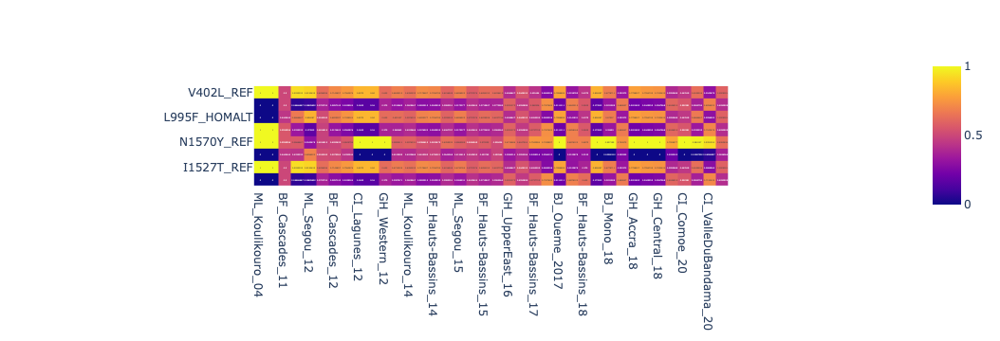

In [127]:
px.imshow(test_df, text_auto=True)

In [128]:
test_arr = np.zeros((4,len(ref_dict.keys())))
for ref_i, (ref_key, ref_value) in enumerate(ref_dict.items()):
    cas_snp_call_vgsc = ag3.snp_calls(region=transcript_vgsc, sample_sets=sample_sets, sample_query = ref_value)
    sample_id = list(cas_snp_call_vgsc.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call_vgsc.call_genotype[int_snps,:,:]).compute()
    vgsc_dict = {'L995F_HETALT&N1570Y_REF' : [],
                 'L995F_HOMALT&N1570Y_REF' : [],
                 'L995F_HETALT&N1570Y_ALT' : [],
                 'L995F_HOMALT&N1570Y_ALT' : [],
                }
    for i in range(cas_ex.shape[1]):
        if cas_ex[1,i,0] == 0 and cas_ex[3,i,1] == 0:
            vgsc_dict['L995F_HETALT&N1570Y_REF'].append(sample_id[i])
        elif cas_ex[1,i,0] != 0 and cas_ex[3,i,1] == 0:
            vgsc_dict['L995F_HOMALT&N1570Y_REF'].append(sample_id[i])
        elif cas_ex[1,i,0] == 0 and cas_ex[3,i,1] != 0:
            vgsc_dict['L995F_HETALT&N1570Y_ALT'].append(sample_id[i])
        elif cas_ex[1,i,0] != 0 and cas_ex[3,i,1] != 0:
            vgsc_dict['L995F_HOMALT&N1570Y_ALT'].append(sample_id[i])
    for vgsc_i, (vgsc_key, vgsc_value) in enumerate(vgsc_dict.items()):
        test_arr[vgsc_i, ref_i] = len(vgsc_value)/len(sample_id)
test_df = pd.DataFrame(data=test_arr, index = vgsc_dict.keys(), columns = ref_dict.keys())

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee5322

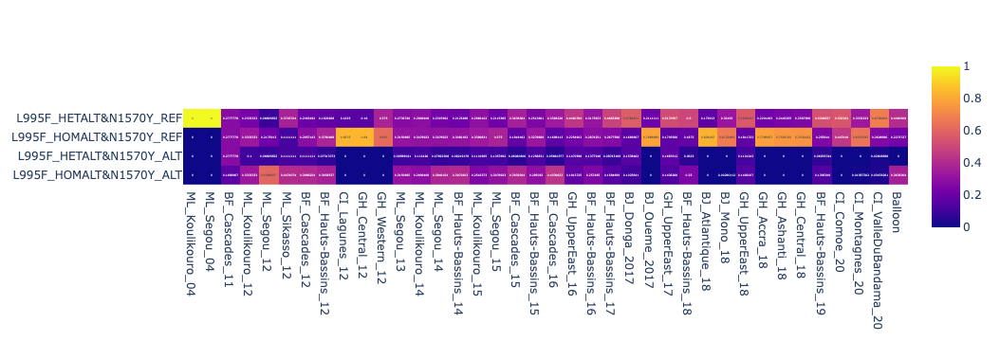

In [129]:
px.imshow(test_df, text_auto=True)

In [130]:
test_arr = np.zeros((4,len(ref_dict.keys())))
for ref_i, (ref_key, ref_value) in enumerate(ref_dict.items()):
    cas_snp_call_vgsc = ag3.snp_calls(region=transcript_vgsc, sample_sets=sample_sets, sample_query = ref_value)
    sample_id = list(cas_snp_call_vgsc.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call_vgsc.call_genotype[int_snps,:,:]).compute()
    vgsc_dict = {'V402L&I1527T_REF' : [],
                 'V402L&I1527T_ALT' : [],
                 'V402L_REF&I1527T_ALT' : [],
                 'V402L_ALT&I1527T_REF' : [],
                }
    for i in range(cas_ex.shape[1]):
        if cas_ex[0,i,1] == 0 and cas_ex[2,i,1] == 0:
            vgsc_dict['V402L&I1527T_REF'].append(sample_id[i])
        elif cas_ex[0,i,1] != 0 and cas_ex[2,i,1] != 0:
            vgsc_dict['V402L&I1527T_ALT'].append(sample_id[i])
        elif cas_ex[0,i,1] == 0 and cas_ex[2,i,1] != 0:
            vgsc_dict['V402L_REF&I1527T_ALT'].append(sample_id[i])
        elif cas_ex[0,i,1] != 0 and cas_ex[2,i,1] == 0:
            vgsc_dict['V402L_ALT&I1527T_REF'].append(sample_id[i])
    for vgsc_i, (vgsc_key, vgsc_value) in enumerate(vgsc_dict.items()):
        test_arr[vgsc_i, ref_i] = len(vgsc_value)/len(sample_id)
test_df = pd.DataFrame(data=test_arr, index = vgsc_dict.keys(), columns = ref_dict.keys())

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee5322

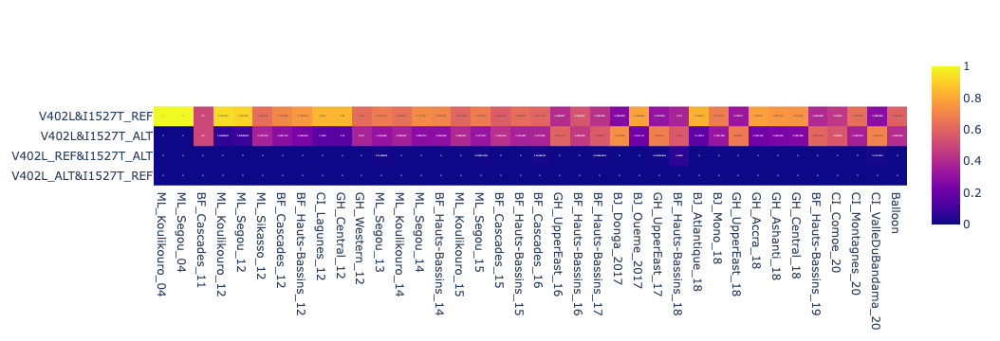

In [131]:
px.imshow(test_df, text_auto=True)

In [132]:
test_arr = np.zeros((4,len(ref_dict.keys())))
for ref_i, (ref_key, ref_value) in enumerate(ref_dict.items()):
    cas_snp_call_vgsc = ag3.snp_calls(region=transcript_vgsc, sample_sets=sample_sets, sample_query = ref_value)
    sample_id = list(cas_snp_call_vgsc.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call_vgsc.call_genotype[int_snps,:,:]).compute()
    vgsc_dict = {'V402L&I1527T_REF_L995F_HETALT' : [],
                 'V402L&I1527T_ALT_L995F_HETALT' : [],
                 'V402L&I1527T_REF_L995F_HOMALT' : [],
                 'V402L&I1527T_ALT_L995F_HOMALT' : [],
                }
    for i in range(cas_ex.shape[1]):
        if cas_ex[0,i,1] == 0 and cas_ex[2,i,1] == 0 and cas_ex[1,i,0] == 0:
            vgsc_dict['V402L&I1527T_REF_L995F_HETALT'].append(sample_id[i])
        elif cas_ex[0,i,1] != 0 and cas_ex[2,i,1] != 0 and cas_ex[1,i,0] == 0:
            vgsc_dict['V402L&I1527T_ALT_L995F_HETALT'].append(sample_id[i])
        elif cas_ex[0,i,1] == 0 and cas_ex[2,i,1] == 0 and cas_ex[1,i,0] != 0:
            vgsc_dict['V402L&I1527T_REF_L995F_HOMALT'].append(sample_id[i])
        elif cas_ex[0,i,1] != 0 and cas_ex[2,i,1] != 0 and cas_ex[1,i,0] != 0:
            vgsc_dict['V402L&I1527T_ALT_L995F_HOMALT'].append(sample_id[i])
    for vgsc_i, (vgsc_key, vgsc_value) in enumerate(vgsc_dict.items()):
        test_arr[vgsc_i, ref_i] = len(vgsc_value)/len(sample_id)
test_df = pd.DataFrame(data=test_arr, index = vgsc_dict.keys(), columns = ref_dict.keys())

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee5322

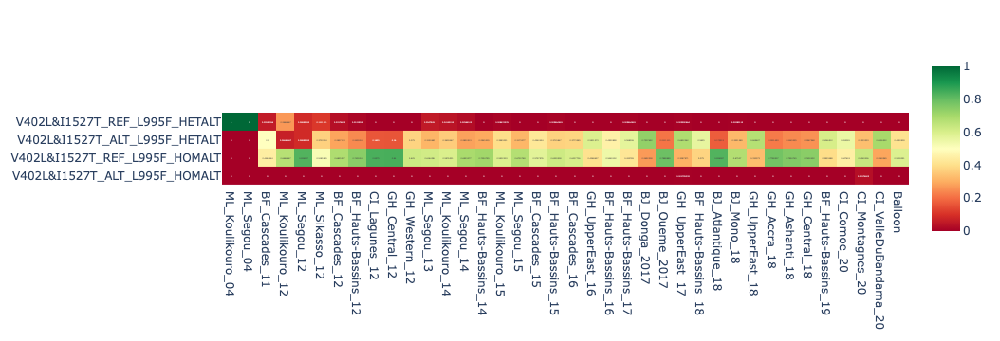

In [133]:
px.imshow(test_df, text_auto=True, color_continuous_scale=px.colors.diverging.RdYlGn)

Load SNP genotypes:   0%|          | 0/624 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/38 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/209001 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.



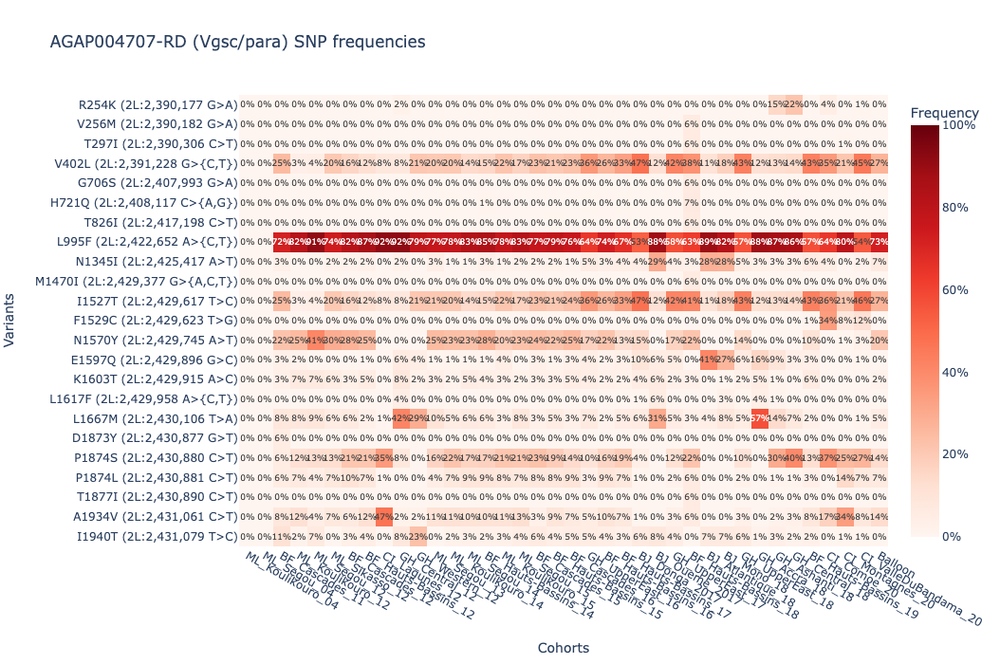

In [46]:
vgsc_aa_allele_freqs_df = ag3.aa_allele_frequencies(
     transcript=transcript_vgsc, 
     cohorts=ref_dict, 
     sample_sets=sample_sets, 
     drop_invariant=False,
)
vgsc_ns_aas_df = vgsc_aa_allele_freqs_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(vgsc_ns_aas_df, width =1350)

Load SNP genotypes:   0%|          | 0/624 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/38 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/209001 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.



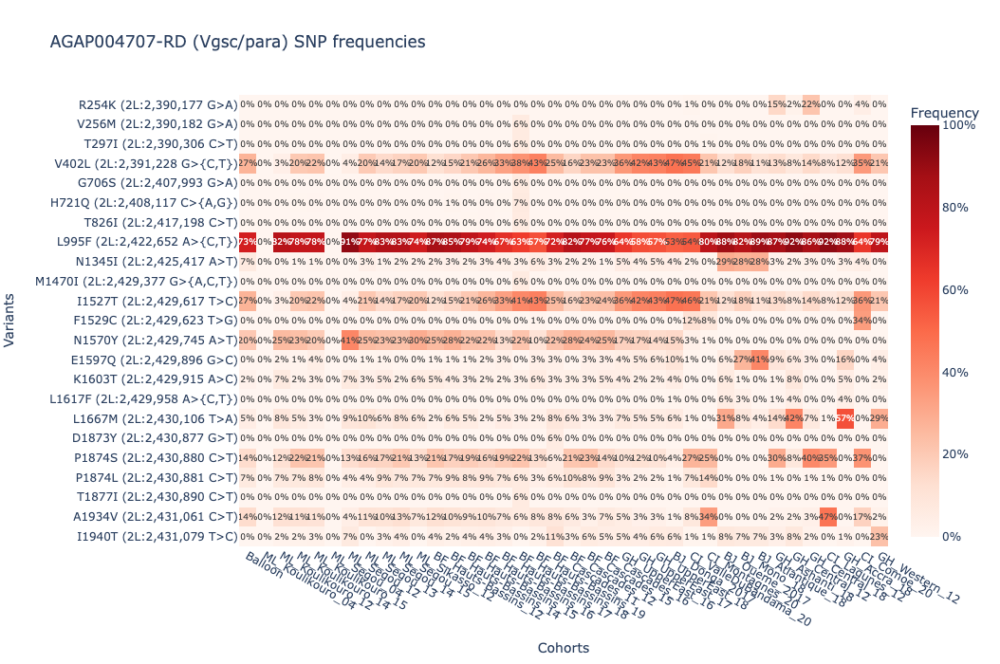

In [50]:
vgsc_aa_allele_freqs_lat_df = ag3.aa_allele_frequencies(
     transcript=transcript_vgsc, 
     cohorts=ref_dict_lat, 
     sample_sets=sample_sets, 
     drop_invariant=False,
)
vgsc_ns_aas_lat_df = vgsc_aa_allele_freqs_lat_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(vgsc_ns_aas_lat_df, width =1000)

### RDL

In [135]:
cas_snp_call_rdl = ag3.snp_calls(region=transcript_rdl, sample_sets=sample_sets)

In [136]:
int_snps_pos = [25_429_235, 25_429_236, 25_433_170, 25_433_171]
int_snps = [pos in int_snps_pos for pos in cas_snp_call_rdl.variant_position.compute()]
labels = ["A296S", "A296G", "T345S", "T345M"]

In [137]:
for c in ref_dict.keys():
    cas_snp_call_rdl = ag3.snp_calls(region=transcript_rdl, sample_sets=sample_sets, sample_query = ref_dict[c])
    sample_id = list(cas_snp_call_rdl.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call_rdl.call_genotype[int_snps,:,:]).compute()
    print(c + ":")
    for i in range(len(int_snps_pos)):
        res = hwe_test(cas_ex[i])
        print("\t" + labels[i] + ":\n\t\tobs: " + str(res[1]) + "\n\t\texp: " + str(res[2]) + "\n\t\tp-value: " + str(res[0][1]) + "\n\t\tstats: " + str(res[0][0]))

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Koulikouro_04:
	A296S:
		obs: [1, 6, 9]
		exp: [1.0, 6.0, 9.0]
		p-value: 1.0
		stats: 0.0
	A296G:
		obs: [16, 0, 0]
		exp: [16.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [3, 6, 7]
		exp: [2.25, 7.5, 6.25]
		p-value: 0.726149037073691
		stats: 0.64
	T345M:
		obs: [16, 0, 0]
		exp: [16.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide



ML_Segou_04:
	A296S:
		obs: [2, 7, 16]
		exp: [1.21, 8.58, 15.21]
		p-value: 0.654498146685772
		stats: 0.8477730505702534
	A296G:
		obs: [25, 0, 0]
		exp: [25.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [6, 8, 11]
		exp: [4.000000000000001, 12.0, 9.0]
		p-value: 0.2493522087772963
		stats: 2.777777777777777
	T345M:
		obs: [25, 0, 0]
		exp: [25.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Cascades_11:
	A296S:
		obs: [0, 7, 11]
		exp: [0.6805555555555556, 5.638888888888889, 11.680555555555557]
		p-value: 0.5919247621350886
		stats: 1.0487514863258025
	A296G:
		obs: [18, 0, 0]
		exp: [18.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [2, 9, 7]
		exp: [2.3472222222222223, 8.305555555555554, 7.3472222222222205]
		p-value: 0.9390197572147009
		stats: 0.12583751859598907
	T345M:
		obs: [17, 1, 0]
		exp: [17.013888888888886, 0.9722222222222222, 0.013888888888888888]
		p-value: 0.9926799840054865
		stats: 0.014693877551020402


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Koulikouro_12:
	A296S:
		obs: [8, 16, 6]
		exp: [8.533333333333333, 14.933333333333334, 6.533333333333334]
		p-value: 0.9263245569805906
		stats: 0.15306122448979598
	A296G:
		obs: [30, 0, 0]
		exp: [30.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [10, 15, 5]
		exp: [10.208333333333336, 14.583333333333336, 5.208333333333334]
		p-value: 0.9878297657433106
		stats: 0.024489795918367353
	T345M:
		obs: [30, 0, 0]
		exp: [30.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Segou_12:
	A296S:
		obs: [5, 9, 9]
		exp: [3.9239130434782608, 11.152173913043478, 7.9239130434782625]
		p-value: 0.6516252668713134
		stats: 0.8565712526931362
	A296G:
		obs: [23, 0, 0]
		exp: [23.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [6, 9, 8]
		exp: [4.7934782608695645, 11.41304347826087, 6.7934782608695645]
		p-value: 0.5980544537540857
		stats: 1.0281469387755109
	T345M:
		obs: [23, 0, 0]
		exp: [23.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Sikasso_12:
	A296S:
		obs: [13, 11, 3]
		exp: [12.675925925925927, 11.648148148148149, 2.675925925925926]
		p-value: 0.959062285899374
		stats: 0.08359851481519859
	A296G:
		obs: [27, 0, 0]
		exp: [27.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [16, 9, 2]
		exp: [15.564814814814815, 9.87037037037037, 1.5648148148148147]
		p-value: 0.9003493850181166
		stats: 0.20994477082886004
	T345M:
		obs: [27, 0, 0]
		exp: [27.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Cascades_12:
	A296S:
		obs: [5, 30, 28]
		exp: [6.349206349206348, 27.3015873015873, 29.34920634920635]
		p-value: 0.7351233217173174
		stats: 0.6154340183883179
	A296G:
		obs: [63, 0, 0]
		exp: [63.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [12, 25, 26]
		exp: [9.527777777777779, 29.944444444444446, 23.527777777777782]
		p-value: 0.42365258715781995
		stats: 1.7176830590559709
	T345M:
		obs: [63, 0, 0]
		exp: [63.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Hauts-Bassins_12:
	A296S:
		obs: [8, 44, 30]
		exp: [10.975609756097562, 38.048780487804876, 32.97560975609756]
		p-value: 0.3667661231376372
		stats: 2.006061801446418
	A296G:
		obs: [81, 1, 0]
		exp: [81.0030487804878, 0.9939024390243902, 0.003048780487804878]
		p-value: 0.9984580382530658
		stats: 0.0030863035868869734
	T345S:
		obs: [13, 42, 27]
		exp: [14.097560975609754, 39.80487804878048, 28.097560975609753]
		p-value: 0.8827712941300473
		stats: 0.24937824394463695
	T345M:
		obs: [81, 1, 0]
		exp: [81.0030487804878, 0.9939024390243902, 0.003048780487804878]
		p-value: 0.9984580382530658
		stats: 0.0030863035868869734


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



CI_Lagunes_12:
	A296S:
		obs: [80, 0, 0]
		exp: [80.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	A296G:
		obs: [7, 40, 33]
		exp: [9.1125, 35.775, 35.1125]
		p-value: 0.5724115018580581
		stats: 1.1157942748201575
	T345S:
		obs: [80, 0, 0]
		exp: [80.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345M:
		obs: [8, 38, 34]
		exp: [9.1125, 35.775, 35.1125]
		p-value: 0.8566506490465303
		stats: 0.3094501750936757


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_Central_12:
	A296S:
		obs: [25, 0, 0]
		exp: [25.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	A296G:
		obs: [9, 13, 3]
		exp: [9.610000000000001, 11.78, 3.61]
		p-value: 0.8745268249230154
		stats: 0.2681446208214553
	T345S:
		obs: [25, 0, 0]
		exp: [25.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345M:
		obs: [9, 13, 3]
		exp: [9.610000000000001, 11.78, 3.61]
		p-value: 0.8745268249230154
		stats: 0.2681446208214553


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_Western_12:
	A296S:
		obs: [24, 0, 0]
		exp: [24.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	A296G:
		obs: [1, 10, 13]
		exp: [1.5, 9.0, 13.5]
		p-value: 0.8623033568332588
		stats: 0.2962962962962963
	T345S:
		obs: [24, 0, 0]
		exp: [24.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345M:
		obs: [1, 10, 13]
		exp: [1.5, 9.0, 13.5]
		p-value: 0.8623033568332588
		stats: 0.2962962962962963


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Segou_13:
	A296S:
		obs: [21, 39, 13]
		exp: [22.469178082191778, 36.06164383561644, 14.46917808219178]
		p-value: 0.7847956123051514
		stats: 0.48466392318244145
	A296G:
		obs: [73, 0, 0]
		exp: [73.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [27, 39, 7]
		exp: [29.61986301369863, 33.76027397260274, 9.61986301369863]
		p-value: 0.41510611489394733
		stats: 1.7584421857942125
	T345M:
		obs: [73, 0, 0]
		exp: [73.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Koulikouro_14:
	A296S:
		obs: [61, 75, 33]
		exp: [57.40976331360947, 82.18047337278107, 29.40976331360947]
		p-value: 0.5246112145614223
		stats: 1.2901956688419411
	A296G:
		obs: [169, 0, 0]
		exp: [169.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [72, 70, 27]
		exp: [67.74556213017752, 78.50887573964498, 22.74556213017751]
		p-value: 0.37062092304549393
		stats: 1.9851510190103374
	T345M:
		obs: [169, 0, 0]
		exp: [169.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide



ML_Segou_14:
	A296S:
		obs: [15, 18, 6]
		exp: [14.769230769230772, 18.461538461538463, 5.769230769230769]
		p-value: 0.9878864667831315
		stats: 0.024375000000000015
	A296G:
		obs: [39, 0, 0]
		exp: [39.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [20, 14, 5]
		exp: [18.69230769230769, 16.615384615384617, 3.692307692307693]
		p-value: 0.6168352601034455
		stats: 0.9663065843621401
	T345M:
		obs: [39, 0, 0]
		exp: [39.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Hauts-Bassins_14:
	A296S:
		obs: [44, 79, 23]
		exp: [47.755136986301366, 71.48972602739725, 26.755136986301366]
		p-value: 0.4467967973952527
		stats: 1.6113027593674927
	A296G:
		obs: [146, 0, 0]
		exp: [146.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [54, 71, 21]
		exp: [54.86472602739727, 69.27054794520548, 21.86472602739726]
		p-value: 0.9555164720248571
		stats: 0.09100655256515347
	T345M:
		obs: [146, 0, 0]
		exp: [146.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Koulikouro_15:
	A296S:
		obs: [98, 104, 34]
		exp: [95.33898305084745, 109.32203389830508, 31.33898305084745]
		p-value: 0.7560448796172052
		stats: 0.5593090799831757
	A296G:
		obs: [236, 0, 0]
		exp: [236.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [110, 95, 31]
		exp: [105.11122881355932, 104.77754237288136, 26.111228813559322]
		p-value: 0.35788097084556486
		stats: 2.055109663075987
	T345M:
		obs: [236, 0, 0]
		exp: [236.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ML_Segou_15:
	A296S:
		obs: [36, 53, 15]
		exp: [37.56009615384615, 49.87980769230769, 16.560096153846157]
		p-value: 0.8158885106231581
		stats: 0.40695512498185543
	A296G:
		obs: [104, 0, 0]
		exp: [104.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [46, 47, 11]
		exp: [46.44471153846153, 46.11057692307692, 11.444711538461537]
		p-value: 0.9808387166935396
		stats: 0.03869447994663511
	T345M:
		obs: [104, 0, 0]
		exp: [104.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Cascades_15:
	A296S:
		obs: [14, 16, 3]
		exp: [14.666666666666666, 14.666666666666666, 3.6666666666666665]
		p-value: 0.8725252928694238
		stats: 0.2727272727272727
	A296G:
		obs: [33, 0, 0]
		exp: [33.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [15, 15, 3]
		exp: [15.34090909090909, 14.318181818181817, 3.340909090909091]
		p-value: 0.9632763254904667
		stats: 0.07482993197278921
	T345M:
		obs: [33, 0, 0]
		exp: [33.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Hauts-Bassins_15:
	A296S:
		obs: [65, 81, 37]
		exp: [60.82103825136612, 89.35792349726776, 32.821038251366126]
		p-value: 0.4491122986234617
		stats: 1.6009646284379206
	A296G:
		obs: [183, 0, 0]
		exp: [183.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [71, 86, 26]
		exp: [71.01639344262296, 85.9672131147541, 26.016393442622945]
		p-value: 0.999986690773095
		stats: 2.6618630947074536e-05
	T345M:
		obs: [183, 0, 0]
		exp: [183.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Cascades_16:
	A296S:
		obs: [11, 34, 8]
		exp: [14.792452830188678, 26.41509433962264, 11.79245283018868]
		p-value: 0.11248312812393324
		stats: 4.369904081632653
	A296G:
		obs: [53, 0, 0]
		exp: [53.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [15, 32, 6]
		exp: [18.132075471698112, 25.735849056603772, 9.132075471698114]
		p-value: 0.2080499594660434
		stats: 3.1399540767623266
	T345M:
		obs: [53, 0, 0]
		exp: [53.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_UpperEast_16:
	A296S:
		obs: [68, 96, 40]
		exp: [65.96078431372548, 100.07843137254902, 37.9607843137255]
		p-value: 0.8441737672294847
		stats: 0.3387938404693346
	A296G:
		obs: [203, 1, 0]
		exp: [203.00122549019608, 0.9975490196078431, 0.0012254901960784314]
		p-value: 0.9993844297116589
		stats: 0.0012315196590380864
	T345S:
		obs: [80, 95, 29]
		exp: [79.6875, 95.625, 28.6875]
		p-value: 0.9956521807770797
		stats: 0.008714596949891068
	T345M:
		obs: [204, 0, 0]
		exp: [204.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Hauts-Bassins_16:
	A296S:
		obs: [69, 70, 28]
		exp: [64.76646706586827, 78.46706586826348, 23.76646706586826]
		p-value: 0.3782314210232
		stats: 1.9444980915333492
	A296G:
		obs: [166, 1, 0]
		exp: [166.00149700598803, 0.9970059880239521, 0.0014970059880239524]
		p-value: 0.9992472781798014
		stats: 0.0015060105150195243
	T345S:
		obs: [81, 64, 22]
		exp: [76.46107784431138, 73.07784431137725, 17.461077844311376]
		p-value: 0.27568722396511314
		stats: 2.5769766047551093
	T345M:
		obs: [166, 1, 0]
		exp: [166.00149700598803, 0.9970059880239521, 0.0014970059880239524]
		p-value: 0.9992472781798014
		stats: 0.0015060105150195243


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Hauts-Bassins_17:
	A296S:
		obs: [75, 83, 25]
		exp: [74.1653005464481, 84.66939890710383, 24.165300546448087]
		p-value: 0.965054820311375
		stats: 0.07114074128775075
	A296G:
		obs: [182, 1, 0]
		exp: [182.0013661202186, 0.9972677595628414, 0.001366120218579235]
		p-value: 0.9993134277671246
		stats: 0.0013736160630512298
	T345S:
		obs: [81, 85, 17]
		exp: [83.34562841530054, 80.3087431693989, 19.345628415300542]
		p-value: 0.7318135990429313
		stats: 0.6244588871297343
	T345M:
		obs: [182, 1, 0]
		exp: [182.0013661202186, 0.9972677595628414, 0.001366120218579235]
		p-value: 0.9993134277671246
		stats: 0.0013736160630512298


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BJ_Donga_2017:
	A296S:
		obs: [28, 36, 14]
		exp: [27.12820512820513, 37.743589743589745, 13.128205128205126]
		p-value: 0.9201417976720323
		stats: 0.16645498582230644
	A296G:
		obs: [78, 0, 0]
		exp: [78.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [32, 34, 12]
		exp: [30.78205128205128, 36.43589743589743, 10.782051282051285]
		p-value: 0.8400359878381805
		stats: 0.3486210907959959
	T345M:
		obs: [78, 0, 0]
		exp: [78.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BJ_Oueme_2017:
	A296S:
		obs: [89, 1, 0]
		exp: [89.00277777777778, 0.9944444444444445, 0.002777777777777778]
		p-value: 0.9985965352313881
		stats: 0.002808901095471427
	A296G:
		obs: [18, 48, 24]
		exp: [19.6, 44.8, 25.6]
		p-value: 0.7948579681254894
		stats: 0.4591836734693886
	T345S:
		obs: [90, 0, 0]
		exp: [90.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345M:
		obs: [18, 48, 24]
		exp: [19.6, 44.8, 25.6]
		p-value: 0.7948579681254894
		stats: 0.4591836734693886


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_UpperEast_17:
	A296S:
		obs: [207, 252, 98]
		exp: [199.0825852782765, 267.83482944344706, 90.0825852782765]
		p-value: 0.37777387718237
		stats: 1.9469189417457984
	A296G:
		obs: [556, 1, 0]
		exp: [556.000448833034, 0.9991023339317775, 0.00044883303411131066]
		p-value: 0.9997752053077158
		stats: 0.00044963992479630973
	T345S:
		obs: [236, 241, 80]
		exp: [228.17280071813286, 256.6543985637343, 72.17280071813286]
		p-value: 0.3548367980625099
		stats: 2.0721946379593366
	T345M:
		obs: [556, 1, 0]
		exp: [556.000448833034, 0.9991023339317775, 0.00044883303411131066]
		p-value: 0.9997752053077158
		stats: 0.00044963992479630973


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Hauts-Bassins_18:
	A296S:
		obs: [7, 9, 0]
		exp: [8.265625, 6.46875, 1.265625]
		p-value: 0.29377158334062997
		stats: 2.449905482041588
	A296G:
		obs: [15, 1, 0]
		exp: [15.015625, 0.96875, 0.015625]
		p-value: 0.9917098922364517
		stats: 0.01664932362122789
	T345S:
		obs: [7, 9, 0]
		exp: [8.265625, 6.46875, 1.265625]
		p-value: 0.29377158334062997
		stats: 2.449905482041588
	T345M:
		obs: [16, 0, 0]
		exp: [16.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BJ_Atlantique_18:
	A296S:
		obs: [23, 0, 0]
		exp: [23.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	A296G:
		obs: [7, 11, 5]
		exp: [6.7934782608695645, 11.41304347826087, 4.7934782608695645]
		p-value: 0.9850507350029868
		stats: 0.03012426303854883
	T345S:
		obs: [23, 0, 0]
		exp: [23.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345M:
		obs: [7, 11, 5]
		exp: [6.7934782608695645, 11.41304347826087, 4.7934782608695645]
		p-value: 0.9850507350029868
		stats: 0.03012426303854883


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BJ_Mono_18:
	A296S:
		obs: [357, 0, 0]
		exp: [357.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	A296G:
		obs: [162, 161, 34]
		exp: [164.7233893557423, 155.55322128851543, 36.7233893557423]
		p-value: 0.8034369159421069
		stats: 0.437713216941902
	T345S:
		obs: [357, 0, 0]
		exp: [357.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345M:
		obs: [162, 161, 34]
		exp: [164.7233893557423, 155.55322128851543, 36.7233893557423]
		p-value: 0.8034369159421069
		stats: 0.437713216941902


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_UpperEast_18:
	A296S:
		obs: [240, 251, 72]
		exp: [237.2828596802842, 256.4342806394316, 69.28285968028419]
		p-value: 0.8812460380790109
		stats: 0.25283684132526374
	A296G:
		obs: [562, 1, 0]
		exp: [562.0004440497336, 0.9991119005328598, 0.0004440497335701599]
		p-value: 0.9997776049803531
		stats: 0.0004448395061728393
	T345S:
		obs: [269, 240, 54]
		exp: [268.7761989342806, 240.44760213143869, 53.776198934280636]
		p-value: 0.9990249879502997
		stats: 0.001950975366278997
	T345M:
		obs: [562, 1, 0]
		exp: [562.0004440497336, 0.9991119005328598, 0.0004440497335701599]
		p-value: 0.9997776049803531
		stats: 0.0004448395061728393


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_Accra_18:
	A296S:
		obs: [268, 0, 0]
		exp: [268.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	A296G:
		obs: [0, 20, 248]
		exp: [0.3731343283582089, 19.25373134328358, 248.3731343283582]
		p-value: 0.8176589037475004
		stats: 0.4026200348536748
	T345S:
		obs: [268, 0, 0]
		exp: [268.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345M:
		obs: [0, 20, 248]
		exp: [0.3731343283582089, 19.25373134328358, 248.3731343283582]
		p-value: 0.8176589037475004
		stats: 0.4026200348536748


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_Ashanti_18:
	A296S:
		obs: [274, 0, 0]
		exp: [274.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	A296G:
		obs: [174, 94, 6]
		exp: [178.2518248175182, 85.4963503649635, 10.25182481751825]
		p-value: 0.2578693642052826
		stats: 2.7106043251673095
	T345S:
		obs: [274, 0, 0]
		exp: [274.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345M:
		obs: [174, 94, 6]
		exp: [178.2518248175182, 85.4963503649635, 10.25182481751825]
		p-value: 0.2578693642052826
		stats: 2.7106043251673095


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



GH_Central_18:
	A296S:
		obs: [148, 0, 0]
		exp: [148.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	A296G:
		obs: [120, 27, 1]
		exp: [120.4206081081081, 26.158783783783782, 1.4206081081081081]
		p-value: 0.9263283590123933
		stats: 0.15305301565203713
	T345S:
		obs: [148, 0, 0]
		exp: [148.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345M:
		obs: [120, 27, 1]
		exp: [120.4206081081081, 26.158783783783782, 1.4206081081081081]
		p-value: 0.9263283590123933
		stats: 0.15305301565203713


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



BF_Hauts-Bassins_19:
	A296S:
		obs: [18, 21, 4]
		exp: [18.889534883720927, 19.220930232558135, 4.88953488372093]
		p-value: 0.8317743762479388
		stats: 0.36838811466365423
	A296G:
		obs: [43, 0, 0]
		exp: [43.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [22, 18, 3]
		exp: [22.34883720930232, 17.302325581395348, 3.3488372093023258]
		p-value: 0.9656468648301901
		stats: 0.06991415192507802
	T345M:
		obs: [43, 0, 0]
		exp: [43.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



CI_Comoe_20:
	A296S:
		obs: [105, 0, 0]
		exp: [105.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	A296G:
		obs: [26, 51, 28]
		exp: [25.259523809523806, 52.480952380952374, 27.259523809523806]
		p-value: 0.9590558691659817
		stats: 0.08361189612515693
	T345S:
		obs: [105, 0, 0]
		exp: [105.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345M:
		obs: [26, 51, 28]
		exp: [25.259523809523806, 52.480952380952374, 27.259523809523806]
		p-value: 0.9590558691659817
		stats: 0.08361189612515693


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



CI_Montagnes_20:
	A296S:
		obs: [63, 0, 0]
		exp: [63.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	A296G:
		obs: [57, 5, 1]
		exp: [56.19444444444444, 6.611111111111111, 0.19444444444444442]
		p-value: 0.1540101869229256
		stats: 3.7414730598121606
	T345S:
		obs: [63, 0, 0]
		exp: [63.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345M:
		obs: [58, 4, 1]
		exp: [57.14285714285714, 5.7142857142857135, 0.14285714285714282]
		p-value: 0.05871852583387223
		stats: 5.670000000000002


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



CI_ValleDuBandama_20:
	A296S:
		obs: [115, 0, 0]
		exp: [115.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	A296G:
		obs: [40, 55, 20]
		exp: [39.61956521739131, 55.76086956521739, 19.619565217391305]
		p-value: 0.9893510575552881
		stats: 0.021412096409531345
	T345S:
		obs: [115, 0, 0]
		exp: [115.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345M:
		obs: [40, 55, 20]
		exp: [39.61956521739131, 55.76086956521739, 19.619565217391305]
		p-value: 0.9893510575552881
		stats: 0.021412096409531345


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Balloon:
	A296S:
		obs: [5, 16, 1]
		exp: [7.681818181818183, 10.636363636363637, 3.6818181818181825]
		p-value: 0.06097999385242043
		stats: 5.59441887647016
	A296G:
		obs: [22, 0, 0]
		exp: [22.0, 0.0, 0.0]
		p-value: nan
		stats: nan
	T345S:
		obs: [8, 14, 0]
		exp: [10.227272727272727, 9.545454545454545, 2.227272727272727]
		p-value: 0.09112204150156025
		stats: 4.79111111111111
	T345M:
		obs: [22, 0, 0]
		exp: [22.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide



In [138]:
test_arr = np.zeros((12,len(ref_dict.keys())))
for ref_i, (ref_key, ref_value) in enumerate(ref_dict.items()):
    cas_snp_call = ag3.snp_calls(region=transcript_rdl, sample_sets=sample_sets, sample_query = ref_value)
    sample_id = list(cas_snp_call.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call.call_genotype[int_snps,:,:]).compute()
    rdl_dict = {'A296S_HOMREF' : [],
                 'A296S_HOMALT' : [],
                 'A296S_HET' : [],
                 'A296G_HOMREF' : [],
                 'A296G_HOMALT' : [],
                 'A296G_HET' : [],
                 'T345S_HOMREF' : [],
                 'T345S_HOMALT' : [],
                 'T345S_HET' : [],
                 'T345M_HOMREF' : [],
                 'T345M_HOMALT' : [],
                 'T345M_HET' : []}
    for i in range(cas_ex.shape[1]):
        if cas_ex[0,i,0] == 0 and cas_ex[0,i,1] == 0:
            rdl_dict['A296S_HOMREF'].append(sample_id[i])
        elif cas_ex[0,i,0] != 0 and cas_ex[0,i,1] != 0:
            rdl_dict['A296S_HOMALT'].append(sample_id[i])
        elif cas_ex[0,i,0] == 0 and cas_ex[0,i,1] != 0:
            rdl_dict['A296S_HET'].append(sample_id[i])        
        if cas_ex[1,i,0] == 0 and cas_ex[1,i,1] == 0:
            rdl_dict['A296G_HOMREF'].append(sample_id[i])
        elif cas_ex[1,i,0] != 0 and cas_ex[1,i,1] != 0:
            rdl_dict['A296G_HOMALT'].append(sample_id[i])
        elif cas_ex[1,i,0] == 0 and cas_ex[1,i,1] != 0:
            rdl_dict['A296G_HET'].append(sample_id[i]) 
        if cas_ex[2,i,0] == 0 and cas_ex[2,i,1] == 0:
            rdl_dict['T345S_HOMREF'].append(sample_id[i])
        elif cas_ex[2,i,0] != 0 and cas_ex[2,i,1] != 0:
            rdl_dict['T345S_HOMALT'].append(sample_id[i])
        elif cas_ex[2,i,0] == 0 and cas_ex[2,i,1] != 0:
            rdl_dict['T345S_HET'].append(sample_id[i]) 
        if cas_ex[3,i,0] == 0 and cas_ex[3,i,1] == 0:
            rdl_dict['T345M_HOMREF'].append(sample_id[i])
        elif cas_ex[3,i,0] != 0 and cas_ex[3,i,1] != 0:
            rdl_dict['T345M_HOMALT'].append(sample_id[i])
        elif cas_ex[3,i,0] == 0 and cas_ex[3,i,1] != 0:
            rdl_dict['T345M_HET'].append(sample_id[i])
    for rdl_i, (rdl_key, rdl_value) in enumerate(rdl_dict.items()):
        test_arr[rdl_i, ref_i] = len(rdl_value)/len(sample_id)
test_df = pd.DataFrame(data=test_arr, index = rdl_dict.keys(), columns = ref_dict.keys())

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee5322

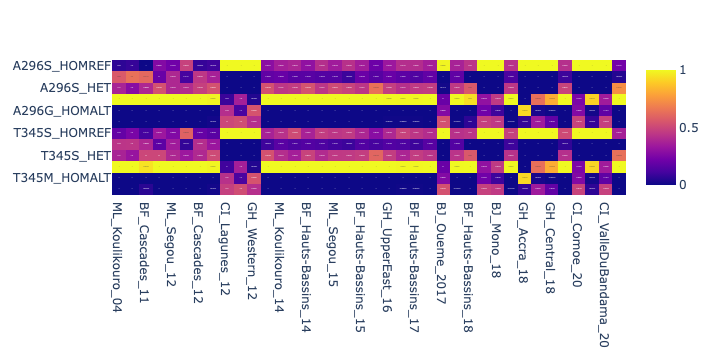

In [139]:
px.imshow(test_df, text_auto=True, aspect = 2)

In [140]:
test_arr = np.zeros((9,len(ref_dict.keys())))
for ref_i, (ref_key, ref_value) in enumerate(ref_dict.items()):
    cas_snp_call = ag3.snp_calls(region=transcript_rdl, sample_sets=sample_sets, sample_query = ref_value)
    sample_id = list(cas_snp_call.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call.call_genotype[int_snps,:,:]).compute()
    rdl_dict = {'A296S&T345S_HOMREF' : [],
                 'A296S_HOMREF&T345S_HOMALT' : [],
                 'A296S_HOMREF&T345S_HET' : [],
                 'A296S_HOMALT&T345S_HOMREF' : [],
                 'A296S&T345S_HOMALT' : [],
                 'A296S_HOMALT&T345S_HET' : [],
                 'A296S_HET&T345S_HOMREF' : [],
                 'A296S_HET&T345S_HOMALT' : [],
                 'A296S&T345S_HET' : [],
                 }
    for i in range(cas_ex.shape[1]):
        if cas_ex[0,i,0] == 0 and cas_ex[0,i,1] == 0:
            if cas_ex[2,i,0] == 0 and cas_ex[2,i,1] == 0:
                rdl_dict['A296S&T345S_HOMREF'].append(sample_id[i])
            elif cas_ex[2,i,0] != 0 and cas_ex[2,i,1] != 0:
                rdl_dict['A296S_HOMREF&T345S_HOMALT'].append(sample_id[i])
            elif cas_ex[2,i,0] == 0 and cas_ex[2,i,1] != 0:
                rdl_dict['A296S_HOMREF&T345S_HET'].append(sample_id[i])
        elif cas_ex[0,i,0] != 0 and cas_ex[0,i,1] != 0:
            if cas_ex[2,i,0] == 0 and cas_ex[2,i,1] == 0:
                rdl_dict['A296S_HOMALT&T345S_HOMREF'].append(sample_id[i])
            elif cas_ex[2,i,0] != 0 and cas_ex[2,i,1] != 0:
                rdl_dict['A296S&T345S_HOMALT'].append(sample_id[i])
            elif cas_ex[2,i,0] == 0 and cas_ex[2,i,1] != 0:
                rdl_dict['A296S_HOMALT&T345S_HET'].append(sample_id[i])
        elif cas_ex[0,i,0] == 0 and cas_ex[0,i,1] != 0:
            if cas_ex[2,i,0] == 0 and cas_ex[2,i,1] == 0:
                rdl_dict['A296S_HET&T345S_HOMREF'].append(sample_id[i])
            elif cas_ex[2,i,0] != 0 and cas_ex[2,i,1] != 0:
                rdl_dict['A296S_HET&T345S_HOMALT'].append(sample_id[i])
            elif cas_ex[2,i,0] == 0 and cas_ex[2,i,1] != 0:
                rdl_dict['A296S&T345S_HET'].append(sample_id[i])
    for rdl_i, (rdl_key, rdl_value) in enumerate(rdl_dict.items()):
        test_arr[rdl_i, ref_i] = len(rdl_value)/len(sample_id)
test_df = pd.DataFrame(data=test_arr, index = rdl_dict.keys(), columns = ref_dict.keys())

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee5322

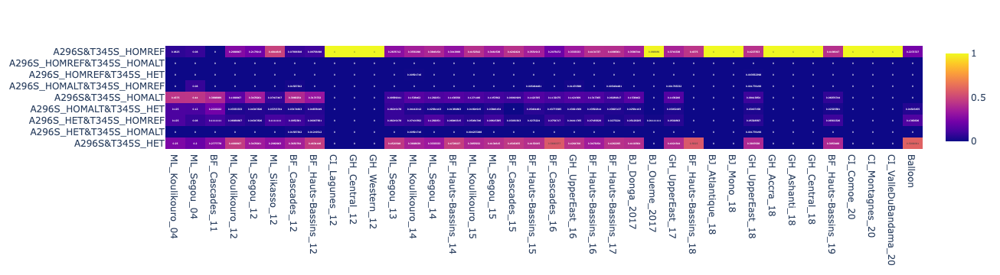

In [141]:
px.imshow(test_df, text_auto=True, aspect = 2)

In [142]:
test_arr = np.zeros((9,len(ref_dict.keys())))
for ref_i, (ref_key, ref_value) in enumerate(ref_dict.items()):
    cas_snp_call = ag3.snp_calls(region=transcript_rdl, sample_sets=sample_sets, sample_query = ref_value)
    sample_id = list(cas_snp_call.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call.call_genotype[int_snps,:,:]).compute()
    rdl_dict = {'A296G&T345M_HOMREF' : [],
                 'A296G_HOMREF&T345M_HOMALT' : [],
                 'A296G_HOMREF&T345M_HET' : [],
                 'A296G_HOMALT&T345M_HOMREF' : [],
                 'A296G&T345M_HOMALT' : [],
                 'A296G_HOMALT&T345M_HET' : [],
                 'A296G_HET&T345M_HOMREF' : [],
                 'A296G_HET&T345M_HOMALT' : [],
                 'A296G&T345M_HET' : [],
                 }
    for i in range(cas_ex.shape[1]):
        if cas_ex[1,i,0] == 0 and cas_ex[1,i,1] == 0:
            if cas_ex[3,i,0] == 0 and cas_ex[3,i,1] == 0:
                rdl_dict['A296G&T345M_HOMREF'].append(sample_id[i])
            elif cas_ex[3,i,0] != 0 and cas_ex[3,i,1] != 0:
                rdl_dict['A296G_HOMREF&T345M_HOMALT'].append(sample_id[i])
            elif cas_ex[3,i,0] == 0 and cas_ex[3,i,1] != 0:
                rdl_dict['A296G_HOMREF&T345M_HET'].append(sample_id[i])
        elif cas_ex[1,i,0] != 0 and cas_ex[1,i,1] != 0:
            if cas_ex[3,i,0] == 0 and cas_ex[3,i,1] == 0:
                rdl_dict['A296G_HOMALT&T345M_HOMREF'].append(sample_id[i])
            elif cas_ex[3,i,0] != 0 and cas_ex[3,i,1] != 0:
                rdl_dict['A296G&T345M_HOMALT'].append(sample_id[i])
            elif cas_ex[3,i,0] == 0 and cas_ex[3,i,1] != 0:
                rdl_dict['A296G_HOMALT&T345M_HET'].append(sample_id[i])
        elif cas_ex[1,i,0] == 0 and cas_ex[1,i,1] != 0:
            if cas_ex[3,i,0] == 0 and cas_ex[3,i,1] == 0:
                rdl_dict['A296G_HET&T345M_HOMREF'].append(sample_id[i])
            elif cas_ex[3,i,0] != 0 and cas_ex[3,i,1] != 0:
                rdl_dict['A296G_HET&T345M_HOMALT'].append(sample_id[i])
            elif cas_ex[3,i,0] == 0 and cas_ex[3,i,1] != 0:
                rdl_dict['A296G&T345M_HET'].append(sample_id[i])
    for rdl_i, (rdl_key, rdl_value) in enumerate(rdl_dict.items()):
        test_arr[rdl_i, ref_i] = len(rdl_value)/len(sample_id)
test_df = pd.DataFrame(data=test_arr, index = rdl_dict.keys(), columns = ref_dict.keys())

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee5322

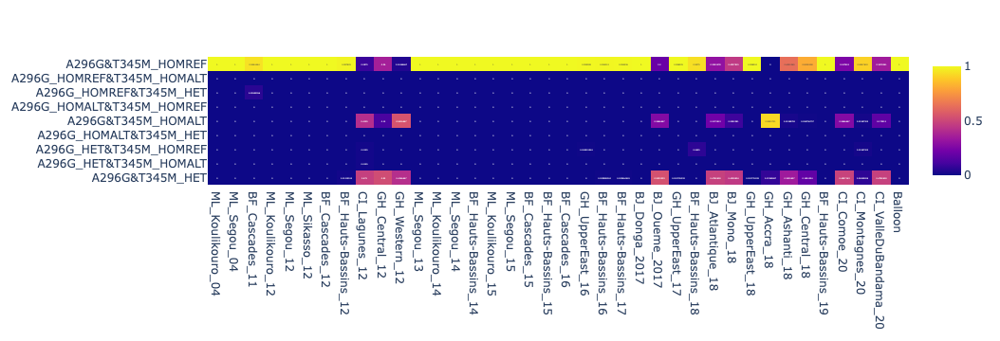

In [143]:
px.imshow(test_df, text_auto=True, aspect = 2)

Load SNP genotypes:   0%|          | 0/312 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/38 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/212715 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.



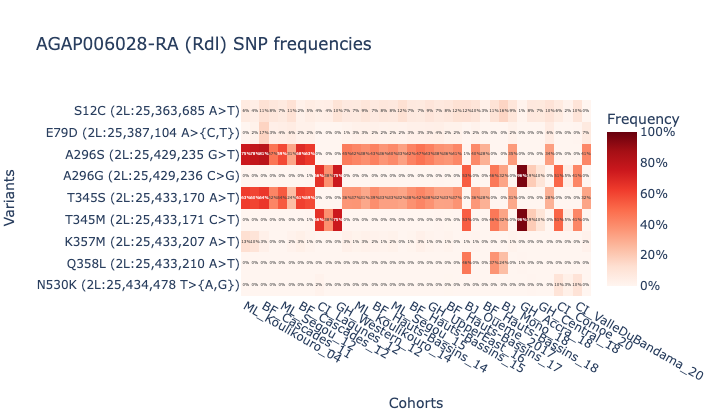

In [52]:
rdl_aa_allele_freqs_df = ag3.aa_allele_frequencies(
     transcript=transcript_rdl, 
     cohorts=ref_dict, 
     sample_sets=sample_sets, 
     drop_invariant=False,
)
rdl_ns_aas_df = rdl_aa_allele_freqs_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(rdl_ns_aas_df, width=1100)

Load SNP genotypes:   0%|          | 0/312 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/38 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/212715 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.



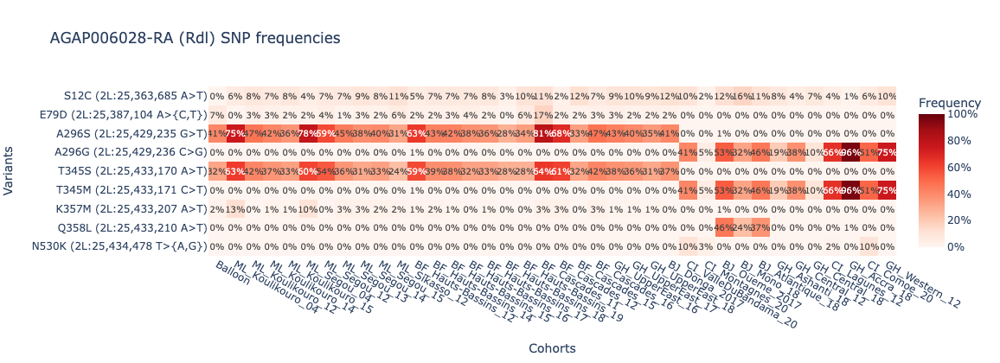

In [53]:
rdl_aa_allele_freqs_lat_df = ag3.aa_allele_frequencies(
     transcript=transcript_rdl, 
     cohorts=ref_dict_lat, 
     sample_sets=sample_sets, 
     drop_invariant=False,
)
rdl_ns_aas_lat_df = rdl_aa_allele_freqs_lat_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(rdl_ns_aas_lat_df, width=1100)

Load SNP genotypes:   0%|          | 0/234 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/29 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/212715 [00:00<?, ?it/s]

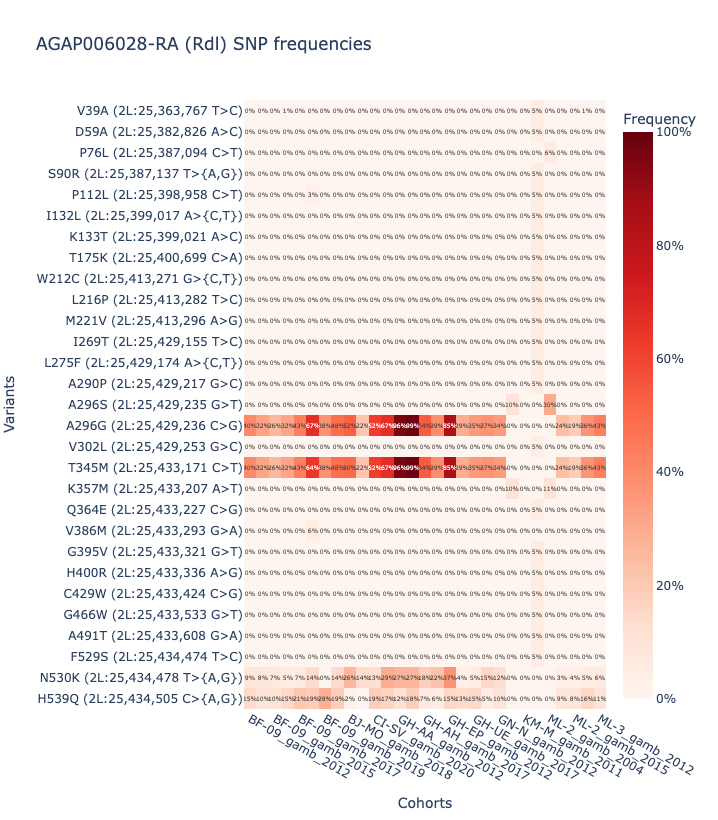

In [37]:
rdl_aa_allele_freqs_lat_df = ag3.aa_allele_frequencies(
     transcript=transcript_rdl, 
     cohorts="admin1_year", 
     sample_sets=sample_sets,
     sample_query = "taxon == 'gambiae'",
     drop_invariant=False,
)
rdl_ns_aas_lat_df = rdl_aa_allele_freqs_lat_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(rdl_ns_aas_lat_df, width=1100)

Load SNP genotypes:   0%|          | 0/100 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/8 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/212715 [00:00<?, ?it/s]

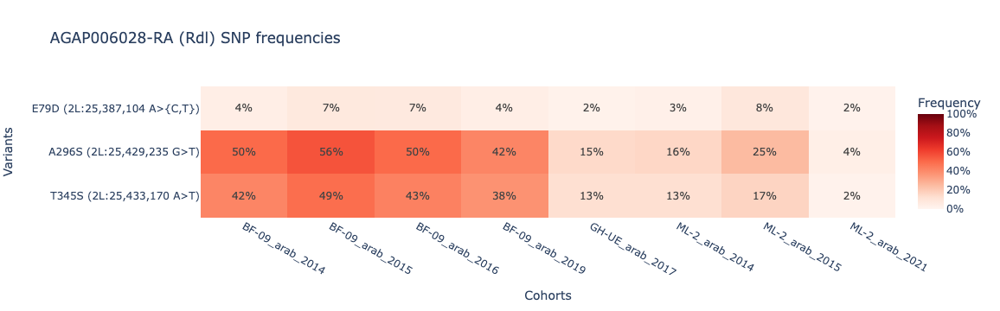

In [38]:
rdl_aa_allele_freqs_lat_df = ag3.aa_allele_frequencies(
     transcript=transcript_rdl, 
     cohorts="admin1_year", 
     sample_sets=sample_sets,
     sample_query = "taxon == 'arabiensis'",
     drop_invariant=False,
)
rdl_ns_aas_lat_df = rdl_aa_allele_freqs_lat_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(rdl_ns_aas_lat_df, width=1100)

### GSTE

In [39]:
cas_snp_call_gste1 = ag3.snp_calls(region=transcript_gste1, sample_sets=sample_sets)
cas_snp_call_gste2 = ag3.snp_calls(region=transcript_gste2, sample_sets=sample_sets)

In [40]:
int_snps_pos_gste1 = [28_599_436, 28_599_640]
int_snps_pos_gste2 = [28_598_057, 28_598_166, 28_598_572]
int_snps_gste1 = [pos in int_snps_pos_gste1 for pos in cas_snp_call_gste1.variant_position.compute()]
int_snps_gste2 = [pos in int_snps_pos_gste2 for pos in cas_snp_call_gste2.variant_position.compute()]
labels_gste1 = ["E83D", "L37F"]
labels_gste2 = ["F120L", "I114T", "N3K"]

In [41]:
for c in ref_dict.keys():
    cas_snp_call_gste1 = ag3.snp_calls(region=transcript_gste1, sample_sets=sample_sets, sample_query = ref_dict[c])
    sample_id = list(cas_snp_call_gste1.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call_gste1.call_genotype[int_snps_gste1,:,:]).compute()
    print(c + ":")
    for i in range(len(int_snps_pos_gste1)):
        res = hwe_test(cas_ex[i])
        print("\t" + labels_gste1[i] + ":\n\t\tobs: " + str(res[1]) + "\n\t\texp: " + str(res[2]) + "\n\t\tp-value: " + str(res[0][1]) + "\n\t\tstats: " + str(res[0][0]))

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Koulikouro_04:
	E83D:
		obs: [13, 2, 1]
		exp: [12.25, 3.5, 0.25]
		p-value: 0.230066298993809
		stats: 2.938775510204082
	L37F:
		obs: [9, 6, 1]
		exp: [9.0, 6.0, 1.0]
		p-value: 1.0
		stats: 0.0


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Segou_04:
	E83D:
		obs: [16, 8, 1]
		exp: [16.000000000000004, 8.000000000000002, 1.0000000000000002]
		p-value: 1.0
		stats: 1.2325951644078306e-30
	L37F:
		obs: [13, 10, 2]
		exp: [12.959999999999999, 10.08, 1.9600000000000002]
		p-value: 0.9992129579024067
		stats: 0.001574703955656336


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Cascades_11:
	E83D:
		obs: [9, 8, 1]
		exp: [9.38888888888889, 7.222222222222222, 1.388888888888889]
		p-value: 0.9008840696161396
		stats: 0.20875739644970423
	L37F:
		obs: [9, 9, 0]
		exp: [10.125, 6.75, 1.125]
		p-value: 0.36787944117144245
		stats: 2.0


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Koulikouro_12:
	E83D:
		obs: [20, 8, 2]
		exp: [19.200000000000003, 9.600000000000001, 1.2000000000000002]
		p-value: 0.6592406302004439
		stats: 0.8333333333333333
	L37F:
		obs: [14, 12, 4]
		exp: [13.333333333333332, 13.333333333333332, 3.333333333333333]
		p-value: 0.8607079764250578
		stats: 0.30000000000000004


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Segou_12:
	E83D:
		obs: [14, 9, 0]
		exp: [14.880434782608695, 7.239130434782609, 0.8804347826086958]
		p-value: 0.5064024009706494
		stats: 1.3608473338203066
	L37F:
		obs: [14, 7, 2]
		exp: [13.315217391304348, 8.369565217391305, 1.315217391304348]
		p-value: 0.7349639090578797
		stats: 0.6158677685950413


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Sikasso_12:
	E83D:
		obs: [13, 12, 2]
		exp: [13.370370370370372, 11.25925925925926, 2.3703703703703702]
		p-value: 0.9432429064985135
		stats: 0.1168628808864266
	L37F:
		obs: [12, 13, 2]
		exp: [12.675925925925927, 11.648148148148149, 2.675925925925926]
		p-value: 0.8337386457100935
		stats: 0.363670600367505


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Cascades_12:
	E83D:
		obs: [36, 23, 4]
		exp: [35.81349206349206, 23.37301587301587, 3.813492063492063]
		p-value: 0.9920091189049605
		stats: 0.016045958589995964
	L37F:
		obs: [31, 30, 2]
		exp: [33.58730158730158, 24.825396825396822, 4.587301587301587]
		p-value: 0.2544663898929035
		stats: 2.7371730300037287


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_12:
	E83D:
		obs: [62, 20, 3]
		exp: [60.98823529411764, 22.023529411764706, 1.9882352941176473]
		p-value: 0.6985246003899357
		stats: 0.7175697640441228
	L37F:
		obs: [52, 27, 6]
		exp: [50.47352941176471, 30.05294117647059, 4.473529411764705]
		p-value: 0.6449496372963873
		stats: 0.8771660938918548


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Lagunes_12:
	E83D:
		obs: [10, 42, 28]
		exp: [12.012500000000001, 37.975, 30.012500000000006]
		p-value: 0.6380351859821765
		stats: 0.8987236934315879
	L37F:
		obs: [9, 48, 23]
		exp: [13.612499999999999, 38.775, 27.612500000000004]
		p-value: 0.10392703262871271
		stats: 4.528132470846164


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Segou_13:
	E83D:
		obs: [42, 28, 3]
		exp: [42.958904109589035, 26.082191780821915, 3.958904109589041]
		p-value: 0.8209115043620132
		stats: 0.39467993079584773
	L37F:
		obs: [41, 26, 6]
		exp: [39.945205479452056, 28.109589041095887, 4.945205479452055]
		p-value: 0.8141754468371258
		stats: 0.4111587990986776


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Koulikouro_14:
	E83D:
		obs: [92, 67, 10]
		exp: [93.19674556213019, 64.60650887573965, 11.196745562130177]
		p-value: 0.8904966715137115
		stats: 0.23195182806353679
	L37F:
		obs: [86, 70, 13]
		exp: [86.63313609467455, 68.73372781065089, 13.633136094674558]
		p-value: 0.9717278871335012
		stats: 0.057358930448360455


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Segou_14:
	E83D:
		obs: [24, 14, 1]
		exp: [24.64102564102564, 12.717948717948717, 1.6410256410256407]
		p-value: 0.8202403733963011
		stats: 0.3963156867845993
	L37F:
		obs: [23, 13, 3]
		exp: [22.314102564102566, 14.37179487179487, 2.3141025641025643]
		p-value: 0.8372265926138696
		stats: 0.355321050323839


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_14:
	E83D:
		obs: [86, 51, 9]
		exp: [85.15239726027399, 52.695205479452056, 8.152397260273974]
		p-value: 0.9272348384837377
		stats: 0.1510968276033413
	L37F:
		obs: [76, 56, 14]
		exp: [74.08219178082192, 59.835616438356155, 12.082191780821917]
		p-value: 0.7408425740807094
		stats: 0.5999342537804068


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Koulikouro_15:
	E83D:
		obs: [120, 98, 18]
		exp: [121.02118644067795, 95.95762711864407, 19.02118644067797]
		p-value: 0.9479480442143262
		stats: 0.10691116782018395
	L37F:
		obs: [120, 94, 22]
		exp: [118.17372881355932, 97.65254237288136, 20.173728813559322]
		p-value: 0.8478223420361599
		stats: 0.33016833490951764


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Segou_15:
	E83D:
		obs: [54, 40, 10]
		exp: [52.65384615384616, 42.692307692307686, 8.653846153846152]
		p-value: 0.8131811349850449
		stats: 0.4136027919811701
	L37F:
		obs: [53, 45, 6]
		exp: [54.81009615384615, 41.37980769230769, 7.810096153846155]
		p-value: 0.6716579540434687
		stats: 0.7960121300020742


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Cascades_15:
	E83D:
		obs: [16, 13, 4]
		exp: [15.34090909090909, 14.318181818181817, 3.340909090909091]
		p-value: 0.8694896675907695
		stats: 0.2796976568405138
	L37F:
		obs: [15, 17, 1]
		exp: [16.734848484848488, 13.530303030303033, 2.7348484848484853]
		p-value: 0.33788300041846736
		stats: 2.1701111920636924


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_15:
	E83D:
		obs: [117, 56, 10]
		exp: [114.89071038251365, 60.21857923497269, 7.890710382513662]
		p-value: 0.6382356347186575
		stats: 0.8980954608186416
	L37F:
		obs: [97, 72, 14]
		exp: [96.66120218579235, 72.67759562841532, 13.661202185792352]
		p-value: 0.9920779927583615
		stats: 0.015907106111142766


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Cascades_16:
	E83D:
		obs: [25, 23, 5]
		exp: [25.136792452830186, 22.72641509433962, 5.136792452830188]
		p-value: 0.9961670370609421
		stats: 0.007680655132846369
	L37F:
		obs: [24, 25, 4]
		exp: [25.136792452830186, 22.72641509433962, 5.136792452830188]
		p-value: 0.767037141837938
		stats: 0.5304401079320471


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_16:
	E83D:
		obs: [100, 57, 10]
		exp: [98.87574850299401, 59.248502994011986, 8.875748502994012]
		p-value: 0.8866904927542424
		stats: 0.24051858941638782
	L37F:
		obs: [85, 70, 12]
		exp: [86.22754491017963, 67.54491017964071, 13.22754491017964]
		p-value: 0.8955516688941558
		stats: 0.2206307215431822


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_17:
	E83D:
		obs: [93, 80, 10]
		exp: [96.66120218579235, 72.67759562841532, 13.661202185792352]
		p-value: 0.3950230641398243
		stats: 1.8576222511165101
	L37F:
		obs: [98, 71, 14]
		exp: [97.38934426229508, 72.22131147540985, 13.389344262295083]
		p-value: 0.9741730176219262
		stats: 0.05233270990578984


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_18:
	E83D:
		obs: [117, 56, 10]
		exp: [114.89071038251365, 60.21857923497269, 7.890710382513662]
		p-value: 0.6382356347186575
		stats: 0.8980954608186416
	L37F:
		obs: [97, 72, 14]
		exp: [96.66120218579235, 72.67759562841532, 13.661202185792352]
		p-value: 0.9920779927583615
		stats: 0.015907106111142766


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_19:
	E83D:
		obs: [17, 22, 4]
		exp: [18.232558139534888, 19.534883720930235, 5.232558139534884]
		p-value: 0.7100877109373178
		stats: 0.684733560090703
	L37F:
		obs: [18, 18, 7]
		exp: [16.953488372093023, 20.093023255813954, 5.953488372093022]
		p-value: 0.7919239372895458
		stats: 0.46657986111111155


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Comoe_20:
	E83D:
		obs: [21, 40, 44]
		exp: [16.00952380952381, 49.98095238095239, 39.00952380952381]
		p-value: 0.12324236183962316
		stats: 4.187204881766807
	L37F:
		obs: [21, 39, 45]
		exp: [15.621428571428572, 49.75714285714287, 39.621428571428574]
		p-value: 0.08596476566474359
		stats: 4.907635536503997


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Montagnes_20:
	E83D:
		obs: [23, 34, 6]
		exp: [25.396825396825392, 29.206349206349202, 8.396825396825395]
		p-value: 0.42802563596023946
		stats: 1.6971443761814744
	L37F:
		obs: [24, 33, 6]
		exp: [26.035714285714292, 28.928571428571434, 8.035714285714286]
		p-value: 0.5358234174297989
		stats: 1.2479012345679008


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ValleDuBandama_20:
	E83D:
		obs: [36, 50, 29]
		exp: [32.356521739130436, 57.28695652173914, 25.356521739130436]
		p-value: 0.3944136644750424
		stats: 1.8607100212378584
	L37F:
		obs: [34, 47, 34]
		exp: [28.75, 57.5, 28.75]
		p-value: 0.1469899143607721
		stats: 3.8347826086956522


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Balloon:
	E83D:
		obs: [12, 9, 1]
		exp: [12.375, 8.25, 1.375]
		p-value: 0.9131007162822623
		stats: 0.18181818181818182
	L37F:
		obs: [10, 11, 1]
		exp: [10.920454545454547, 9.15909090909091, 1.9204545454545459]
		p-value: 0.6412229398220828
		stats: 0.8887561649908565


In [44]:
for c in ref_dict.keys():
    cas_snp_call_gste2 = ag3.snp_calls(region=transcript_gste2, sample_sets=sample_sets, sample_query = ref_dict[c])
    sample_id = list(cas_snp_call_gste2.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call_gste2.call_genotype[int_snps_gste2,:,:]).compute()
    print(c + ":")
    for i in range(len(int_snps_pos_gste2)):
        res = hwe_test(cas_ex[i])
        print("\t" + labels_gste2[i] + ":\n\t\tobs: " + str(res[1]) + "\n\t\texp: " + str(res[2]) + "\n\t\tp-value: " + str(res[0][1]) + "\n\t\tstats: " + str(res[0][0]))

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Koulikouro_04:
	F120L:
		obs: [14, 2, 0]
		exp: [14.0625, 1.875, 0.0625]
		p-value: 0.9650691177896804
		stats: 0.07111111111111111
	I114T:
		obs: [4, 7, 5]
		exp: [3.515625, 7.96875, 4.515625]
		p-value: 0.8884903882100421
		stats: 0.2364628988850442
	N3K:
		obs: [6, 6, 4]
		exp: [5.0625, 7.875, 3.0625]
		p-value: 0.6353909887688034
		stats: 0.9070294784580499


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Segou_04:
	F120L:
		obs: [20, 4, 1]
		exp: [19.36, 5.28, 0.36]
		p-value: 0.4796882254460684
		stats: 1.4692378328741966
	I114T:
		obs: [5, 16, 4]
		exp: [6.760000000000001, 12.479999999999999, 5.76]
		p-value: 0.36994106443769365
		stats: 1.9888231426692977
	N3K:
		obs: [10, 12, 3]
		exp: [10.24, 11.52, 3.2399999999999998]
		p-value: 0.9785323920732278
		stats: 0.04340277777777779


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Cascades_11:
	F120L:
		obs: [10, 8, 0]
		exp: [10.88888888888889, 6.222222222222221, 0.8888888888888888]
		p-value: 0.4796522688300442
		stats: 1.4693877551020413
	I114T:
		obs: [2, 14, 2]
		exp: [4.5, 9.0, 4.5]
		p-value: 0.06217652402211632
		stats: 5.555555555555555
	N3K:
		obs: [5, 11, 2]
		exp: [6.125000000000001, 8.75, 3.1250000000000004]
		p-value: 0.5515062868447809
		stats: 1.1902040816326538


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Koulikouro_12:
	F120L:
		obs: [22, 7, 1]
		exp: [21.674999999999997, 7.65, 0.6749999999999999]
		p-value: 0.8973658121827712
		stats: 0.21658336537229292
	I114T:
		obs: [10, 14, 6]
		exp: [9.633333333333333, 14.733333333333333, 5.633333333333334]
		p-value: 0.9635206093370412
		stats: 0.07432280256341997
	N3K:
		obs: [12, 14, 4]
		exp: [12.033333333333333, 13.933333333333332, 4.033333333333332]
		p-value: 0.9996566602228819
		stats: 0.0006867974634280327


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Segou_12:
	F120L:
		obs: [15, 8, 0]
		exp: [15.695652173913043, 6.608695652173912, 0.6956521739130435]
		p-value: 0.6006785831845614
		stats: 1.0193905817174518
	I114T:
		obs: [3, 12, 8]
		exp: [3.521739130434783, 10.956521739130435, 8.521739130434783]
		p-value: 0.9009474113821403
		stats: 0.20861678004535156
	N3K:
		obs: [10, 11, 2]
		exp: [10.445652173913043, 10.108695652173912, 2.4456521739130435]
		p-value: 0.9144755426750152
		stats: 0.17880911087987061


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Sikasso_12:
	F120L:
		obs: [15, 11, 1]
		exp: [15.564814814814815, 9.87037037037037, 1.5648148148148147]
		p-value: 0.8379279939622412
		stats: 0.3536462165025749
	I114T:
		obs: [8, 16, 3]
		exp: [9.481481481481481, 13.037037037037035, 4.481481481481481]
		p-value: 0.49792090016318924
		stats: 1.3946280991735545
	N3K:
		obs: [9, 13, 5]
		exp: [8.898148148148147, 13.203703703703704, 4.898148148148148]
		p-value: 0.9967919396864557
		stats: 0.006426434341983924


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Cascades_12:
	F120L:
		obs: [45, 18, 0]
		exp: [46.28571428571428, 15.428571428571427, 1.2857142857142856]
		p-value: 0.41686201967850856
		stats: 1.75
	I114T:
		obs: [14, 30, 19]
		exp: [13.349206349206348, 31.301587301587297, 18.349206349206348]
		p-value: 0.9469908300291511
		stats: 0.10893173804459166
	N3K:
		obs: [24, 31, 8]
		exp: [24.765873015873016, 29.46825396825397, 8.765873015873016]
		p-value: 0.9184122106048842
		stats: 0.17021791597192848


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_12:
	F120L:
		obs: [68, 15, 2]
		exp: [67.06176470588234, 16.876470588235296, 1.061764705882353]
		p-value: 0.5913051035969832
		stats: 1.0508462900920061
	I114T:
		obs: [21, 42, 22]
		exp: [20.75294117647059, 42.49411764705882, 21.752941176470586]
		p-value: 0.9942701293083396
		stats: 0.011492698756084371
	N3K:
		obs: [43, 34, 8]
		exp: [42.352941176470594, 35.294117647058826, 7.352941176470589]
		p-value: 0.9444628848560244
		stats: 0.11427777777777767


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Lagunes_12:
	F120L:
		obs: [13, 48, 19]
		exp: [17.1125, 39.775, 23.112499999999997]
		p-value: 0.1807836775847811
		stats: 3.420908227889357
	I114T:
		obs: [60, 18, 2]
		exp: [59.51250000000001, 18.975, 1.5125000000000002]
		p-value: 0.8997753584166057
		stats: 0.21122029714571372
	N3K:
		obs: [6, 25, 49]
		exp: [4.278125, 28.44375, 47.278125]
		p-value: 0.5563598434048773
		stats: 1.1726799874138167


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Segou_13:
	F120L:
		obs: [55, 18, 0]
		exp: [56.10958904109589, 15.780821917808217, 1.1095890410958904]
		p-value: 0.48587603588526784
		stats: 1.4436035156250007
	I114T:
		obs: [18, 41, 14]
		exp: [20.304794520547944, 36.390410958904106, 16.304794520547947]
		p-value: 0.5567399465224427
		stats: 1.1713140608876267
	N3K:
		obs: [27, 39, 7]
		exp: [29.61986301369863, 33.76027397260274, 9.61986301369863]
		p-value: 0.41510611489394733
		stats: 1.7584421857942125


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Koulikouro_14:
	F120L:
		obs: [115, 48, 6]
		exp: [114.32544378698223, 49.349112426035504, 5.325443786982248]
		p-value: 0.9387997832279803
		stats: 0.12630609181719402
	I114T:
		obs: [55, 79, 35]
		exp: [52.84171597633136, 83.31656804733727, 32.84171597633136]
		p-value: 0.7970684863986656
		stats: 0.4536293472939874
	N3K:
		obs: [63, 75, 31]
		exp: [59.76479289940829, 81.47041420118344, 27.764792899408285]
		p-value: 0.586846254049624
		stats: 1.0659848232086586


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Segou_14:
	F120L:
		obs: [30, 9, 0]
		exp: [30.519230769230766, 7.961538461538463, 0.5192307692307693]
		p-value: 0.7176609513782672
		stats: 0.6635160680529297
	I114T:
		obs: [11, 19, 9]
		exp: [10.775641025641026, 19.44871794871795, 8.775641025641026]
		p-value: 0.989673634601253
		stats: 0.02076010444581278
	N3K:
		obs: [18, 16, 5]
		exp: [17.333333333333332, 17.333333333333332, 4.333333333333333]
		p-value: 0.8910233766955563
		stats: 0.23076923076923078


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_14:
	F120L:
		obs: [106, 34, 6]
		exp: [103.62328767123289, 38.75342465753425, 3.6232876712328763]
		p-value: 0.3334417200385233
		stats: 2.1965743628112664
	I114T:
		obs: [42, 69, 35]
		exp: [40.083904109589035, 72.83219178082192, 33.08390410958904]
		p-value: 0.8170116038237507
		stats: 0.40420396251269647
	N3K:
		obs: [62, 66, 18]
		exp: [61.8150684931507, 66.36986301369863, 17.815068493150687]
		p-value: 0.9977355088222124
		stats: 0.00453411803046126


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Koulikouro_15:
	F120L:
		obs: [156, 71, 9]
		exp: [155.39088983050846, 72.21822033898304, 8.390889830508474]
		p-value: 0.9669805820919884
		stats: 0.06715372859434614
	I114T:
		obs: [69, 127, 40]
		exp: [74.39088983050846, 116.21822033898304, 45.39088983050847]
		p-value: 0.36219201734257056
		stats: 2.0311615462782218
	N3K:
		obs: [77, 122, 37]
		exp: [80.69491525423729, 114.61016949152543, 40.69491525423729]
		p-value: 0.6122747605753286
		stats: 0.9811482840631842


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Segou_15:
	F120L:
		obs: [71, 31, 2]
		exp: [71.94471153846155, 29.110576923076927, 2.9447115384615388]
		p-value: 0.8032747090375147
		stats: 0.4381170402605894
	I114T:
		obs: [35, 52, 17]
		exp: [35.77884615384615, 50.442307692307686, 17.778846153846153]
		p-value: 0.951621389201711
		stats: 0.09917604742585526
	N3K:
		obs: [31, 57, 16]
		exp: [34.04086538461538, 50.918269230769226, 19.040865384615383]
		p-value: 0.47623666077683624
		stats: 1.4836807236020348


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Cascades_15:
	F120L:
		obs: [22, 10, 1]
		exp: [22.090909090909093, 9.818181818181818, 1.0909090909090908]
		p-value: 0.9943575425836604
		stats: 0.01131687242798354
	I114T:
		obs: [9, 19, 5]
		exp: [10.37121212121212, 16.257575757575758, 6.371212121212121]
		p-value: 0.6253107553979083
		stats: 0.939013088352677
	N3K:
		obs: [8, 20, 5]
		exp: [9.818181818181817, 16.363636363636363, 6.8181818181818175]
		p-value: 0.442721305197465
		stats: 1.6296296296296289


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_15:
	F120L:
		obs: [131, 46, 6]
		exp: [129.59562841530055, 48.808743169398916, 4.595628415300546]
		p-value: 0.738595347606924
		stats: 0.6060101510361722
	I114T:
		obs: [61, 82, 40]
		exp: [56.85245901639343, 90.29508196721311, 35.85245901639344]
		p-value: 0.46199188955490555
		stats: 1.5444158862609043
	N3K:
		obs: [70, 81, 32]
		exp: [66.72267759562841, 87.55464480874318, 28.72267759562841]
		p-value: 0.5988073357568633
		stats: 1.0256307514974785


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Cascades_16:
	F120L:
		obs: [36, 15, 2]
		exp: [35.70283018867925, 15.59433962264151, 1.702830188679245]
		p-value: 0.9622384825163983
		stats: 0.07698591243111852
	I114T:
		obs: [18, 27, 8]
		exp: [18.721698113207545, 25.556603773584904, 8.721698113207548]
		p-value: 0.9189441123018834
		stats: 0.169059944150727
	N3K:
		obs: [23, 18, 12]
		exp: [19.32075471698113, 25.358490566037737, 8.320754716981133]
		p-value: 0.10737848016551725
		stats: 4.462790975765306


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_16:
	F120L:
		obs: [118, 44, 5]
		exp: [117.36526946107782, 45.269461077844305, 4.365269461077844]
		p-value: 0.9364472592737646
		stats: 0.13132415105960085
	I114T:
		obs: [44, 90, 33]
		exp: [47.431137724550894, 83.13772455089821, 36.4311377245509]
		p-value: 0.5661548546350944
		stats: 1.137775286875049
	N3K:
		obs: [61, 79, 27]
		exp: [60.48053892215569, 80.03892215568862, 26.480538922155688]
		p-value: 0.9860299275572845
		stats: 0.028137144695908695


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_17:
	F120L:
		obs: [123, 56, 4]
		exp: [124.59562841530055, 52.80874316939891, 5.595628415300546]
		p-value: 0.7159510753200664
		stats: 0.6682868898293934
	I114T:
		obs: [62, 88, 33]
		exp: [61.39890710382513, 89.20218579234974, 32.39890710382514]
		p-value: 0.9835180177623064
		stats: 0.033238642555634204
	N3K:
		obs: [67, 83, 33]
		exp: [64.3292349726776, 88.3415300546448, 30.329234972677593]
		p-value: 0.7156812416991984
		stats: 0.6690408086138624


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_18:
	F120L:
		obs: [131, 46, 6]
		exp: [129.59562841530055, 48.808743169398916, 4.595628415300546]
		p-value: 0.738595347606924
		stats: 0.6060101510361722
	I114T:
		obs: [61, 82, 40]
		exp: [56.85245901639343, 90.29508196721311, 35.85245901639344]
		p-value: 0.46199188955490555
		stats: 1.5444158862609043
	N3K:
		obs: [70, 81, 32]
		exp: [66.72267759562841, 87.55464480874318, 28.72267759562841]
		p-value: 0.5988073357568633
		stats: 1.0256307514974785


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_19:
	F120L:
		obs: [25, 15, 3]
		exp: [24.563953488372093, 15.872093023255813, 2.5639534883720927]
		p-value: 0.9371540338063568
		stats: 0.1298152397053496
	I114T:
		obs: [19, 17, 7]
		exp: [17.587209302325583, 19.825581395348838, 5.58720930232558]
		p-value: 0.6461528750824184
		stats: 0.8734383089240725
	N3K:
		obs: [11, 21, 11]
		exp: [10.75, 21.5, 10.75]
		p-value: 0.9884394358621016
		stats: 0.023255813953488372


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Comoe_20:
	F120L:
		obs: [21, 43, 41]
		exp: [17.202380952380953, 50.595238095238095, 37.20238095238095]
		p-value: 0.3063265259086582
		stats: 2.366207335640139
	I114T:
		obs: [59, 39, 7]
		exp: [58.68809523809524, 39.62380952380952, 6.688095238095238]
		p-value: 0.9870720890933213
		stats: 0.02602440724157331
	N3K:
		obs: [11, 44, 50]
		exp: [10.37142857142857, 45.25714285714286, 49.371428571428574]
		p-value: 0.960300272801055
		stats: 0.08101851851851878


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Montagnes_20:
	F120L:
		obs: [40, 22, 1]
		exp: [41.285714285714285, 19.428571428571427, 2.285714285714285]
		p-value: 0.5759151243522541
		stats: 1.1035899653979238
	I114T:
		obs: [35, 23, 5]
		exp: [34.32142857142858, 24.357142857142858, 4.321428571428571]
		p-value: 0.906836348643206
		stats: 0.19558655326321578
	N3K:
		obs: [10, 34, 19]
		exp: [11.57142857142857, 30.857142857142854, 20.57142857142857]
		p-value: 0.7212462277294154
		stats: 0.6535493827160491


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ValleDuBandama_20:
	F120L:
		obs: [45, 44, 26]
		exp: [39.03478260869565, 55.930434782608685, 20.03478260869565]
		p-value: 0.07307429303486389
		stats: 5.232557285091952
	I114T:
		obs: [66, 44, 5]
		exp: [67.3391304347826, 41.321739130434786, 6.339130434782609]
		p-value: 0.7854054382998028
		stats: 0.4831104252400543
	N3K:
		obs: [17, 51, 47]
		exp: [15.706521739130432, 53.58695652173913, 45.70652173913044]
		p-value: 0.874583824981849
		stats: 0.2680142687277057
Balloon:
	F120L:
		obs: [13, 9, 0]
		exp: [13.920454545454545, 7.159090909090909, 0.9204545454545456]
		p-value: 0.4831892216609792
		stats: 1.4546938775510205
	I114T:
		obs: [8, 11, 3]
		exp: [8.28409090909091, 10.431818181818182, 3.2840909090909087]
		p-value: 0.9678944146426984
		stats: 0.06526454687418422
	N3K:
		obs: [6, 11, 5]
		exp: [6.011363636363636, 10.977272727272727, 5.011363636363637]
		p-value: 0.9999528492956415
		stats: 9.430363197579171e-05


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



In [45]:
test_arr = np.zeros((6,len(ref_dict.keys())))
for ref_i, (ref_key, ref_value) in enumerate(ref_dict.items()):
    cas_snp_call = ag3.snp_calls(region=transcript_gste1, sample_sets=sample_sets, sample_query = ref_value)
    sample_id = list(cas_snp_call.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call.call_genotype[int_snps_gste1,:,:]).compute()
    gste1_dict = {'E83D_HOMREF' : [],
                 'E83D_HOMALT' : [],
                 'E83D_HET' : [],
                 'L37F_HOMREF' : [],
                 'L37F_HOMALT' : [],
                 'L37F_HET' : [],
                 }
    for i in range(cas_ex.shape[1]):
        if cas_ex[0,i,0] == 0 and cas_ex[0,i,1] == 0:
            gste1_dict['E83D_HOMREF'].append(sample_id[i])
        elif cas_ex[0,i,0] != 0 and cas_ex[0,i,1] != 0:
            gste1_dict['E83D_HOMALT'].append(sample_id[i])
        elif cas_ex[0,i,0] == 0 and cas_ex[0,i,1] != 0:
            gste1_dict['E83D_HET'].append(sample_id[i])
        if cas_ex[1,i,0] == 0 and cas_ex[1,i,1] == 0:
            gste1_dict['L37F_HOMREF'].append(sample_id[i])
        elif cas_ex[1,i,0] != 0 and cas_ex[1,i,1] != 0:
            gste1_dict['L37F_HOMALT'].append(sample_id[i])
        elif cas_ex[1,i,0] == 0 and cas_ex[1,i,1] != 0:
            gste1_dict['L37F_HET'].append(sample_id[i])
    for gste1_i, (gste1_key, gste1_value) in enumerate(gste1_dict.items()):
        test_arr[gste1_i, ref_i] = len(gste1_value)/len(sample_id)
test_df = pd.DataFrame(data=test_arr, index = gste1_dict.keys(), columns = ref_dict.keys())

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee5322

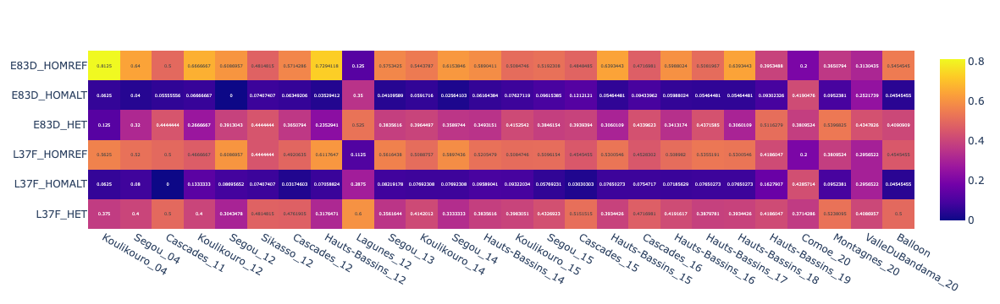

In [46]:
px.imshow(test_df, text_auto=True, aspect = 2)

In [47]:
test_arr = np.zeros((9,len(ref_dict.keys())))
for ref_i, (ref_key, ref_value) in enumerate(ref_dict.items()):
    cas_snp_call = ag3.snp_calls(region=transcript_gste1, sample_sets=sample_sets, sample_query = ref_value)
    sample_id = list(cas_snp_call.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call.call_genotype[int_snps_gste1,:,:]).compute()
    gste1_dict = {'E83D&L37F_HOMREF' : [],
                  'E83D_HOMREF_L37F_HOMALT': [],
                  'E83D_HOMREF_L37F_HET': [],
                  'E83D_HOMALT&L37F_HOMREF' : [],
                  'E83D&L37F_HOMALT': [],
                  'E83D_HOMALT_L37F_HET': [],
                  'E83D_HET&L37F_HOMREF' : [],
                  'E83D_HET_L37F_HOMALT': [],
                  'E83D&L37F_HET': [],
                 }
    for i in range(cas_ex.shape[1]):
        if cas_ex[0,i,0] == 0 and cas_ex[0,i,1] == 0:
            if cas_ex[1,i,0] == 0 and cas_ex[1,i,1] == 0:
                gste1_dict['E83D&L37F_HOMREF'].append(sample_id[i])
            elif cas_ex[1,i,0] != 0 and cas_ex[1,i,1] != 0:
                gste1_dict['E83D_HOMREF_L37F_HOMALT'].append(sample_id[i])
            elif cas_ex[1,i,0] == 0 and cas_ex[1,i,1] != 0:
                gste1_dict['E83D_HOMREF_L37F_HET'].append(sample_id[i])
        elif cas_ex[0,i,0] != 0 and cas_ex[0,i,1] != 0:
            if cas_ex[1,i,0] == 0 and cas_ex[1,i,1] == 0:
                gste1_dict['E83D_HOMALT&L37F_HOMREF'].append(sample_id[i])
            elif cas_ex[1,i,0] != 0 and cas_ex[1,i,1] != 0:
                gste1_dict['E83D&L37F_HOMALT'].append(sample_id[i])
            elif cas_ex[1,i,0] == 0 and cas_ex[1,i,1] != 0:
                gste1_dict['E83D_HOMALT_L37F_HET'].append(sample_id[i])
        elif cas_ex[0,i,0] == 0 and cas_ex[0,i,1] != 0:
            if cas_ex[1,i,0] == 0 and cas_ex[1,i,1] == 0:
                gste1_dict['E83D_HET&L37F_HOMREF'].append(sample_id[i])
            elif cas_ex[1,i,0] != 0 and cas_ex[1,i,1] != 0:
                gste1_dict['E83D_HET_L37F_HOMALT'].append(sample_id[i])
            elif cas_ex[1,i,0] == 0 and cas_ex[1,i,1] != 0:
                gste1_dict['E83D&L37F_HET'].append(sample_id[i])

    for gste1_i, (gste1_key, gste1_value) in enumerate(gste1_dict.items()):
        test_arr[gste1_i, ref_i] = len(gste1_value)/len(sample_id)
test_df = pd.DataFrame(data=test_arr, index = gste1_dict.keys(), columns = ref_dict.keys())

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee5322

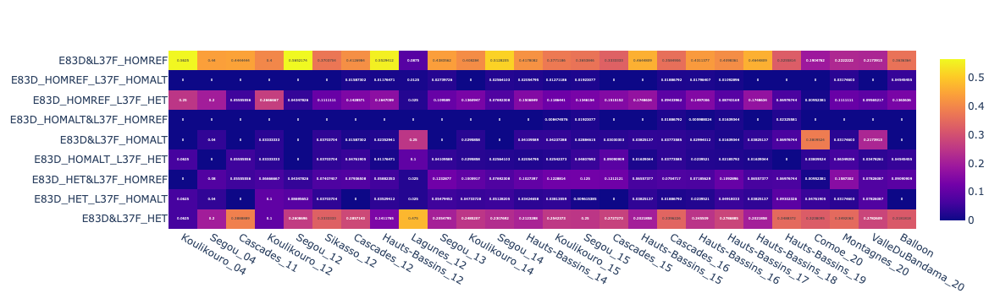

In [48]:
px.imshow(test_df, text_auto=True, aspect = 2)

In [49]:
test_arr = np.zeros((9,len(ref_dict.keys())))
for ref_i, (ref_key, ref_value) in enumerate(ref_dict.items()):
    cas_snp_call = ag3.snp_calls(region=transcript_gste2, sample_sets=sample_sets, sample_query = ref_value)
    sample_id = list(cas_snp_call.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call.call_genotype[int_snps_gste2,:,:]).compute()
    gste2_dict = {'F120L_HOMREF' : [],
                 'F120L_HOMALT' : [],
                 'F120L_HET' : [],
                 'I114T_HOMREF' : [],
                 'I114T_HOMALT' : [],
                 'I114T_HET' : [],
                 'N3K_HOMREF' : [],
                 'N3K_HOMALT' : [],
                 'N3K_HET' : [],
                 }
    for i in range(cas_ex.shape[1]):
        if cas_ex[0,i,0] == 0 and cas_ex[0,i,1] == 0:
            gste2_dict['F120L_HOMREF'].append(sample_id[i])
        elif cas_ex[0,i,0] != 0 and cas_ex[0,i,1] != 0:
            gste2_dict['F120L_HOMALT'].append(sample_id[i])
        elif cas_ex[0,i,0] == 0 and cas_ex[0,i,1] != 0:
            gste2_dict['F120L_HET'].append(sample_id[i])
        if cas_ex[1,i,0] == 0 and cas_ex[1,i,1] == 0:
            gste2_dict['I114T_HOMREF'].append(sample_id[i])
        elif cas_ex[1,i,0] != 0 and cas_ex[1,i,1] != 0:
            gste2_dict['I114T_HOMALT'].append(sample_id[i])
        elif cas_ex[1,i,0] == 0 and cas_ex[1,i,1] != 0:
            gste2_dict['I114T_HET'].append(sample_id[i])
        if cas_ex[2,i,0] == 0 and cas_ex[2,i,1] == 0:
            gste2_dict['N3K_HOMREF'].append(sample_id[i])
        elif cas_ex[2,i,0] != 0 and cas_ex[2,i,1] != 0:
            gste2_dict['N3K_HOMALT'].append(sample_id[i])
        elif cas_ex[2,i,0] == 0 and cas_ex[2,i,1] != 0:
            gste2_dict['N3K_HET'].append(sample_id[i])
    for gste2_i, (gste2_key, gste2_value) in enumerate(gste2_dict.items()):
        test_arr[gste2_i, ref_i] = len(gste2_value)/len(sample_id)
test_df = pd.DataFrame(data=test_arr, index = gste2_dict.keys(), columns = ref_dict.keys())

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee5322

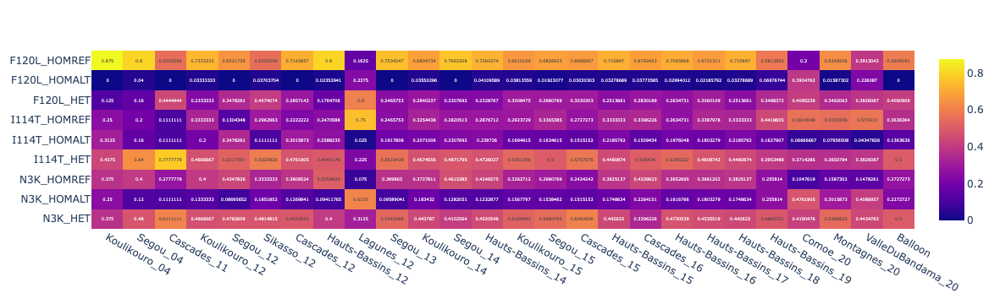

In [50]:
px.imshow(test_df, text_auto=True, aspect = 2)

In [51]:
test_arr = np.zeros((27,len(ref_dict.keys())))
for ref_i, (ref_key, ref_value) in enumerate(ref_dict.items()):
    cas_snp_call = ag3.snp_calls(region=transcript_gste2, sample_sets=sample_sets, sample_query = ref_value)
    sample_id = list(cas_snp_call.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call.call_genotype[int_snps_gste2,:,:]).compute()
    gste2_dict = {'F120L_HOMREF_I114T_HOMREF_N3K_HOMREF' : [],
                  'F120L_HOMREF_I114T_HOMREF_N3K_HOMALT' : [],
                  'F120L_HOMREF_I114T_HOMREF_N3K_HET' : [],
                  'F120L_HOMREF_I114T_HOMALT_N3K_HOMREF' : [],
                  'F120L_HOMREF_I114T_HOMALT_N3K_HOMALT' : [],
                  'F120L_HOMREF_I114T_HOMALT_N3K_HET' : [],
                  'F120L_HOMREF_I114T_HET_N3K_HOMREF' : [],
                  'F120L_HOMREF_I114T_HET_N3K_HOMALT' : [],
                  'F120L_HOMREF_I114T_HET_N3K_HET' : [],
                  'F120L_HOMALT_I114T_HOMREF_N3K_HOMREF' : [],
                  'F120L_HOMALT_I114T_HOMREF_N3K_HOMALT' : [],
                  'F120L_HOMALT_I114T_HOMREF_N3K_HET' : [],
                  'F120L_HOMALT_I114T_HOMALT_N3K_HOMREF' : [],
                  'F120L_HOMALT_I114T_HOMALT_N3K_HOMALT' : [],
                  'F120L_HOMALT_I114T_HOMALT_N3K_HET' : [],
                  'F120L_HOMALT_I114T_HET_N3K_HOMREF' : [],
                  'F120L_HOMALT_I114T_HET_N3K_HOMALT' : [],
                  'F120L_HOMALT_I114T_HET_N3K_HET' : [],
                  'F120L_HET_I114T_HOMREF_N3K_HOMREF' : [],
                  'F120L_HET_I114T_HOMREF_N3K_HOMALT' : [],
                  'F120L_HET_I114T_HOMREF_N3K_HET' : [],
                  'F120L_HET_I114T_HOMALT_N3K_HOMREF' : [],
                  'F120L_HET_I114T_HOMALT_N3K_HOMALT' : [],
                  'F120L_HET_I114T_HOMALT_N3K_HET' : [],
                  'F120L_HET_I114T_HET_N3K_HOMREF' : [],
                  'F120L_HET_I114T_HET_N3K_HOMALT' : [],
                  'F120L_HET_I114T_HET_N3K_HET' : [],
                 }
    for i in range(cas_ex.shape[1]):
        if cas_ex[0,i,0] == 0 and cas_ex[0,i,1] == 0:
            if cas_ex[1,i,0] == 0 and cas_ex[1,i,1] == 0:
                if cas_ex[2,i,0] == 0 and cas_ex[2,i,1] == 0:
                    gste2_dict['F120L_HOMREF_I114T_HOMREF_N3K_HOMREF'].append(sample_id[i])
                elif cas_ex[2,i,0] != 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HOMREF_I114T_HOMREF_N3K_HOMALT'].append(sample_id[i])
                elif cas_ex[2,i,0] == 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HOMREF_I114T_HOMREF_N3K_HET'].append(sample_id[i])
            elif cas_ex[1,i,0] != 0 and cas_ex[1,i,1] != 0:
                if cas_ex[2,i,0] == 0 and cas_ex[2,i,1] == 0:
                    gste2_dict['F120L_HOMREF_I114T_HOMALT_N3K_HOMREF'].append(sample_id[i])
                elif cas_ex[2,i,0] != 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HOMREF_I114T_HOMALT_N3K_HOMALT'].append(sample_id[i])
                elif cas_ex[2,i,0] == 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HOMREF_I114T_HOMALT_N3K_HET'].append(sample_id[i])
            elif cas_ex[1,i,0] == 0 and cas_ex[1,i,1] != 0:
                if cas_ex[2,i,0] == 0 and cas_ex[2,i,1] == 0:
                    gste2_dict['F120L_HOMREF_I114T_HET_N3K_HOMREF'].append(sample_id[i])
                elif cas_ex[2,i,0] != 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HOMREF_I114T_HET_N3K_HOMALT'].append(sample_id[i])
                elif cas_ex[2,i,0] == 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HOMREF_I114T_HET_N3K_HET'].append(sample_id[i])
        elif cas_ex[0,i,0] != 0 and cas_ex[0,i,1] != 0:
            if cas_ex[1,i,0] == 0 and cas_ex[1,i,1] == 0:
                if cas_ex[2,i,0] == 0 and cas_ex[2,i,1] == 0:
                    gste2_dict['F120L_HOMALT_I114T_HOMREF_N3K_HOMREF'].append(sample_id[i])
                elif cas_ex[2,i,0] != 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HOMALT_I114T_HOMREF_N3K_HOMALT'].append(sample_id[i])
                elif cas_ex[2,i,0] == 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HOMALT_I114T_HOMREF_N3K_HET'].append(sample_id[i])
            elif cas_ex[1,i,0] != 0 and cas_ex[1,i,1] != 0:
                if cas_ex[2,i,0] == 0 and cas_ex[2,i,1] == 0:
                    gste2_dict['F120L_HOMALT_I114T_HOMALT_N3K_HOMREF'].append(sample_id[i])
                elif cas_ex[2,i,0] != 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HOMALT_I114T_HOMALT_N3K_HOMALT'].append(sample_id[i])
                elif cas_ex[2,i,0] == 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HOMALT_I114T_HOMALT_N3K_HET'].append(sample_id[i])
            elif cas_ex[1,i,0] == 0 and cas_ex[1,i,1] != 0:
                if cas_ex[2,i,0] == 0 and cas_ex[2,i,1] == 0:
                    gste2_dict['F120L_HOMALT_I114T_HET_N3K_HOMREF'].append(sample_id[i])
                elif cas_ex[2,i,0] != 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HOMALT_I114T_HET_N3K_HOMALT'].append(sample_id[i])
                elif cas_ex[2,i,0] == 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HOMALT_I114T_HET_N3K_HET'].append(sample_id[i])
        elif cas_ex[0,i,0] == 0 and cas_ex[0,i,1] != 0:
            if cas_ex[1,i,0] == 0 and cas_ex[1,i,1] == 0:
                if cas_ex[2,i,0] == 0 and cas_ex[2,i,1] == 0:
                    gste2_dict['F120L_HET_I114T_HOMREF_N3K_HOMREF'].append(sample_id[i])
                elif cas_ex[2,i,0] != 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HET_I114T_HOMREF_N3K_HOMALT'].append(sample_id[i])
                elif cas_ex[2,i,0] == 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HET_I114T_HOMREF_N3K_HET'].append(sample_id[i])
            elif cas_ex[1,i,0] != 0 and cas_ex[1,i,1] != 0:
                if cas_ex[2,i,0] == 0 and cas_ex[2,i,1] == 0:
                    gste2_dict['F120L_HET_I114T_HOMALT_N3K_HOMREF'].append(sample_id[i])
                elif cas_ex[2,i,0] != 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HET_I114T_HOMALT_N3K_HOMALT'].append(sample_id[i])
                elif cas_ex[2,i,0] == 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HET_I114T_HOMALT_N3K_HET'].append(sample_id[i])
            elif cas_ex[1,i,0] == 0 and cas_ex[1,i,1] != 0:
                if cas_ex[2,i,0] == 0 and cas_ex[2,i,1] == 0:
                    gste2_dict['F120L_HET_I114T_HET_N3K_HOMREF'].append(sample_id[i])
                elif cas_ex[2,i,0] != 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HET_I114T_HET_N3K_HOMALT'].append(sample_id[i])
                elif cas_ex[2,i,0] == 0 and cas_ex[2,i,1] != 0:
                    gste2_dict['F120L_HET_I114T_HET_N3K_HET'].append(sample_id[i])


    for gste2_i, (gste2_key, gste2_value) in enumerate(gste2_dict.items()):
        test_arr[gste2_i, ref_i] = len(gste2_value)/len(sample_id)
test_df = pd.DataFrame(data=test_arr, index = gste2_dict.keys(), columns = ref_dict.keys())

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee5322

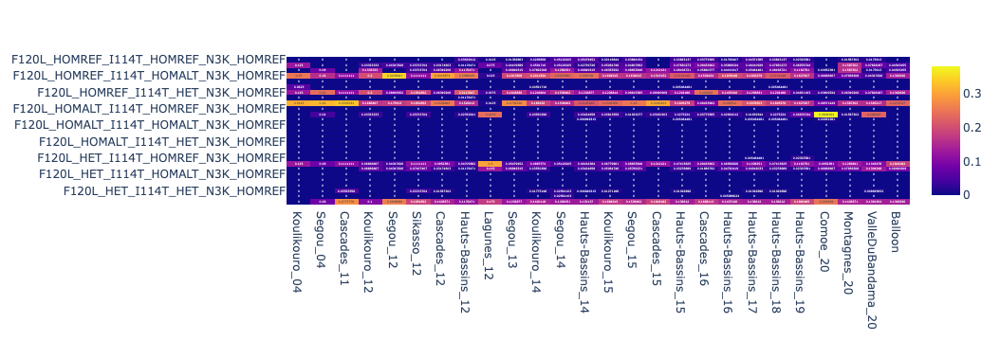

In [52]:
px.imshow(test_df, text_auto=True, aspect = 2)

Load SNP genotypes:   0%|          | 0/312 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/38 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/2838 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.



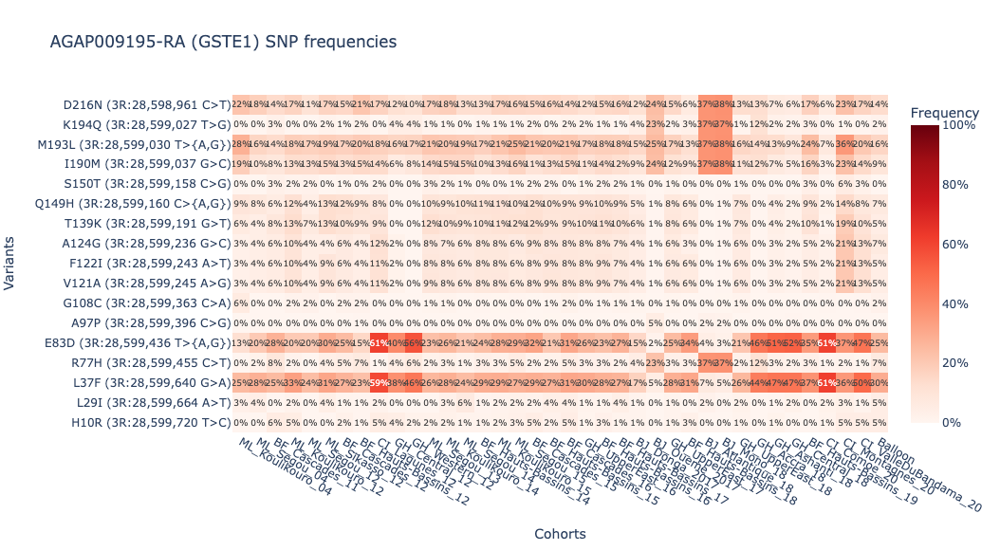

In [55]:
gste1_aa_allele_freqs_df = ag3.aa_allele_frequencies(
     transcript=transcript_gste1, 
     cohorts=ref_dict, 
     sample_sets=sample_sets, 
     drop_invariant=False,
)
gste1_ns_aas_df = gste1_aa_allele_freqs_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(gste1_ns_aas_df, width=1100)

Load SNP genotypes:   0%|          | 0/312 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/38 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/2838 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.



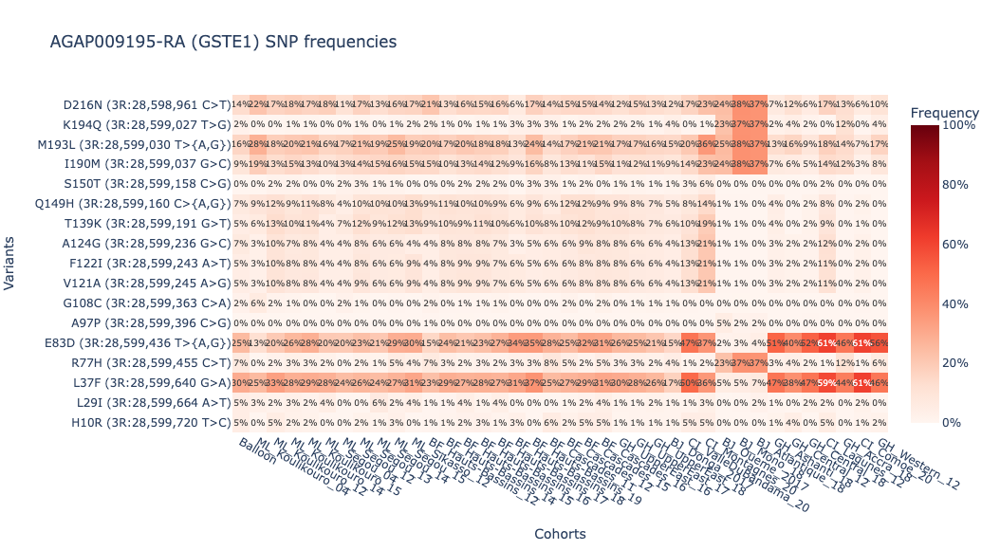

In [56]:
gste1_aa_allele_freqs_lat_df = ag3.aa_allele_frequencies(
     transcript=transcript_gste1, 
     cohorts=ref_dict_lat, 
     sample_sets=sample_sets, 
     drop_invariant=False,
)
gste1_ns_aas_lat_df = gste1_aa_allele_freqs_lat_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(gste1_ns_aas_lat_df, width=1100)

Load SNP genotypes:   0%|          | 0/312 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/38 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/2967 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.



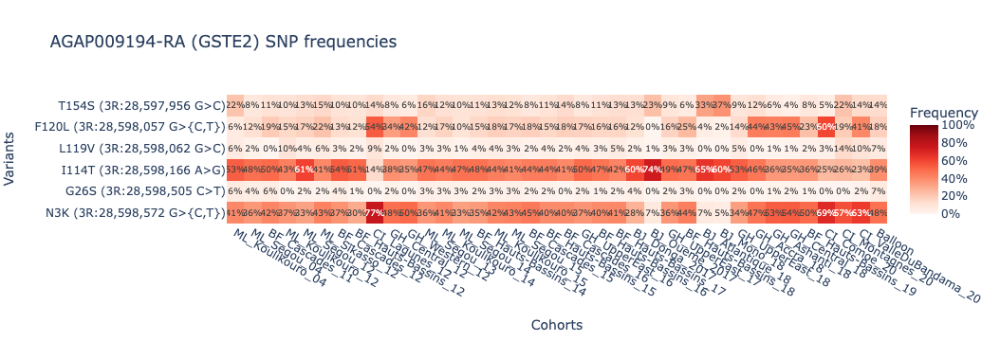

In [54]:
gste2_aa_allele_freqs_df = ag3.aa_allele_frequencies(
     transcript=transcript_gste2, 
     cohorts=ref_dict, 
     sample_sets=sample_sets, 
     drop_invariant=False,
)
gste2_ns_aas_df = gste2_aa_allele_freqs_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(gste2_ns_aas_df, width=1100)

Load SNP genotypes:   0%|          | 0/312 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/38 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/2967 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.



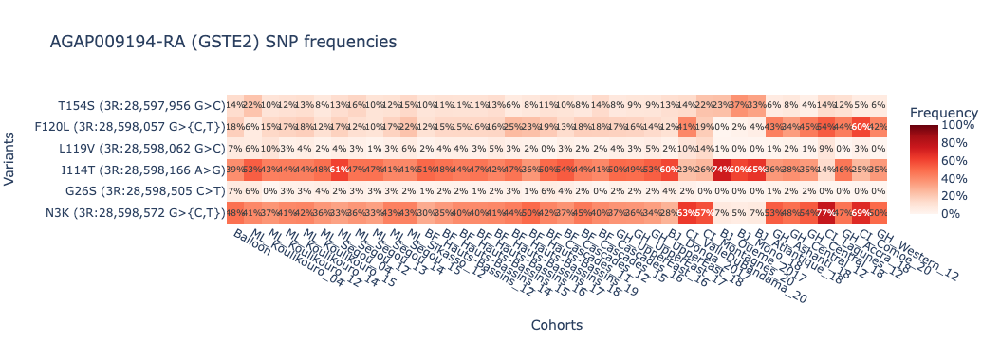

In [58]:
gste2_aa_allele_freqs_lat_df = ag3.aa_allele_frequencies(
     transcript=transcript_gste2, 
     cohorts=ref_dict_lat, 
     sample_sets=sample_sets, 
     drop_invariant=False,
)
gste2_ns_aas_lat_df = gste2_aa_allele_freqs_lat_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(gste2_ns_aas_lat_df, width=1100)

### ACE1

In [55]:
cas_snp_call_gste1 = ag3.snp_calls(region=transcript_ace, sample_sets=sample_sets)

In [60]:
int_snps_pos = [3_489_405, 3_492_074]
int_snps = [pos in int_snps_pos for pos in cas_snp_call_ace.variant_position.compute()]
labels = ["A65S", "G280S"]

In [61]:
for c in ref_dict.keys():
    cas_snp_call_ace = ag3.snp_calls(region=transcript_ace, sample_sets=sample_sets, sample_query = ref_dict[c])
    sample_id = list(cas_snp_call_ace.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call_ace.call_genotype[int_snps,:,:]).compute()
    print(c + ":")
    for i in range(len(int_snps_pos)):
        res = hwe_test(cas_ex[i])
        print("\t" + labels[i] + ":\n\t\tobs: " + str(res[1]) + "\n\t\texp: " + str(res[2]) + "\n\t\tp-value: " + str(res[0][1]) + "\n\t\tstats: " + str(res[0][0]))

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Koulikouro_04:
	A65S:
		obs: [5, 5, 6]
		exp: [3.515625, 7.96875, 4.515625]
		p-value: 0.3294462131706609
		stats: 2.2206843521722415
	G280S:
		obs: [16, 0, 0]
		exp: [16.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide



Segou_04:
	A65S:
		obs: [4, 14, 7]
		exp: [4.84, 12.320000000000002, 7.840000000000001]
		p-value: 0.7925988758537419
		stats: 0.4648760330578507
	G280S:
		obs: [25, 0, 0]
		exp: [25.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Cascades_11:
	A65S:
		obs: [2, 6, 10]
		exp: [1.388888888888889, 7.222222222222222, 9.38888888888889]
		p-value: 0.7727872618832995
		stats: 0.5155029585798814
	G280S:
		obs: [17, 1, 0]
		exp: [17.013888888888886, 0.9722222222222222, 0.013888888888888888]
		p-value: 0.9926799840054865
		stats: 0.014693877551020402


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Koulikouro_12:
	A65S:
		obs: [5, 15, 10]
		exp: [5.208333333333334, 14.583333333333336, 10.208333333333336]
		p-value: 0.9878297657433106
		stats: 0.02448979591836735
	G280S:
		obs: [30, 0, 0]
		exp: [30.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide



Segou_12:
	A65S:
		obs: [3, 11, 9]
		exp: [3.1413043478260865, 10.717391304347826, 9.141304347826088]
		p-value: 0.992035555642379
		stats: 0.015992659916313153
	G280S:
		obs: [23, 0, 0]
		exp: [23.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Sikasso_12:
	A65S:
		obs: [5, 15, 7]
		exp: [5.787037037037037, 13.425925925925927, 7.787037037037039]
		p-value: 0.8306350055278258
		stats: 0.37112960760998814
	G280S:
		obs: [26, 1, 0]
		exp: [26.00925925925926, 0.9814814814814814, 0.009259259259259259]
		p-value: 0.9952055494707562
		stats: 0.009611961552153794


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Cascades_12:
	A65S:
		obs: [6, 27, 30]
		exp: [6.035714285714286, 26.92857142857143, 30.035714285714285]
		p-value: 0.9997783949117286
		stats: 0.0004432592926144412
	G280S:
		obs: [61, 2, 0]
		exp: [61.015873015873005, 1.9682539682539681, 0.015873015873015872]
		p-value: 0.9918388951490811
		stats: 0.0163891779396462


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_12:
	A65S:
		obs: [17, 36, 32]
		exp: [14.411764705882351, 41.17647058823529, 29.411764705882355]
		p-value: 0.5108529652665239
		stats: 1.3433469387755093
	G280S:
		obs: [81, 4, 0]
		exp: [81.04705882352941, 3.9058823529411764, 0.04705882352941176]
		p-value: 0.9756249671937075
		stats: 0.04935404267673102


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Lagunes_12:
	A65S:
		obs: [2, 44, 34]
		exp: [7.199999999999999, 33.6, 39.199999999999996]
		p-value: 0.02166191679822293
		stats: 7.664399092970519
	G280S:
		obs: [10, 70, 0]
		exp: [25.3125, 39.375, 15.3125]
		p-value: 3.0984598291899576e-11
		stats: 48.39506172839506


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Segou_13:
	A65S:
		obs: [11, 40, 22]
		exp: [13.164383561643833, 35.671232876712324, 24.164383561643834]
		p-value: 0.5842021725973118
		stats: 1.075016340216281
	G280S:
		obs: [73, 0, 0]
		exp: [73.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Koulikouro_14:
	A65S:
		obs: [34, 87, 48]
		exp: [35.53994082840237, 83.92011834319527, 49.539940828402365]
		p-value: 0.8924246550771258
		stats: 0.2276263779471409
	G280S:
		obs: [168, 1, 0]
		exp: [168.00147928994082, 0.9970414201183432, 0.0014792899408284023]
		p-value: 0.9992562356623732
		stats: 0.0014880821350896811


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide



Segou_14:
	A65S:
		obs: [6, 22, 11]
		exp: [7.410256410256411, 19.17948717948718, 12.41025641025641]
		p-value: 0.6559223914401733
		stats: 0.8434256055363326
	G280S:
		obs: [39, 0, 0]
		exp: [39.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_14:
	A65S:
		obs: [20, 79, 47]
		exp: [24.24828767123288, 70.50342465753425, 51.24828767123288]
		p-value: 0.3463844461501511
		stats: 2.1204120094321386
	G280S:
		obs: [141, 5, 0]
		exp: [141.04280821917808, 4.914383561643835, 0.04280821917808218]
		p-value: 0.9780872563171448
		stats: 0.04431278757785089


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Koulikouro_15:
	A65S:
		obs: [49, 100, 87]
		exp: [41.52966101694915, 114.9406779661017, 79.52966101694916]
		p-value: 0.13618102172027408
		stats: 3.987540472472914
	G280S:
		obs: [234, 2, 0]
		exp: [234.0042372881356, 1.9915254237288134, 0.00423728813559322]
		p-value: 0.9978655677021667
		stats: 0.004273426889995475


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Segou_15:
	A65S:
		obs: [23, 44, 37]
		exp: [19.471153846153847, 51.05769230769231, 33.47115384615384]
		p-value: 0.37024579196958596
		stats: 1.9871763825493605
	G280S:
		obs: [104, 0, 0]
		exp: [104.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Cascades_15:
	A65S:
		obs: [10, 11, 12]
		exp: [7.280303030303031, 16.43939393939394, 9.28030303030303]
		p-value: 0.1642447357281279
		stats: 3.612795344985029
	G280S:
		obs: [33, 0, 0]
		exp: [33.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_15:
	A65S:
		obs: [33, 81, 69]
		exp: [29.520491803278688, 87.95901639344262, 65.52049180327869]
		p-value: 0.5639790837790634
		stats: 1.1454762273397536
	G280S:
		obs: [180, 3, 0]
		exp: [180.0122950819672, 2.975409836065574, 0.012295081967213116]
		p-value: 0.9937699148471938
		stats: 0.01249914623318079


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Cascades_16:
	A65S:
		obs: [15, 26, 12]
		exp: [14.792452830188678, 26.41509433962264, 11.79245283018868]
		p-value: 0.9934774869879697
		stats: 0.013087755102040834
	G280S:
		obs: [53, 0, 0]
		exp: [53.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_16:
	A65S:
		obs: [29, 86, 52]
		exp: [31.041916167664674, 81.91616766467067, 54.04191616766468]
		p-value: 0.8125880312419984
		stats: 0.4150620490065322
	G280S:
		obs: [165, 2, 0]
		exp: [165.00598802395209, 1.9880239520958085, 0.00598802395209581]
		p-value: 0.9969743933398625
		stats: 0.00606038612280447


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_17:
	A65S:
		obs: [28, 94, 61]
		exp: [30.73770491803279, 88.52459016393442, 63.73770491803278]
		p-value: 0.7046548860621911
		stats: 0.7000942386831286
	G280S:
		obs: [179, 4, 0]
		exp: [179.02185792349727, 3.9562841530054644, 0.02185792349726776]
		p-value: 0.9888903528866865
		stats: 0.022343640304020026


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_18:
	A65S:
		obs: [33, 81, 69]
		exp: [29.520491803278688, 87.95901639344262, 65.52049180327869]
		p-value: 0.5639790837790634
		stats: 1.1454762273397536
	G280S:
		obs: [180, 3, 0]
		exp: [180.0122950819672, 2.975409836065574, 0.012295081967213116]
		p-value: 0.9937699148471938
		stats: 0.01249914623318079


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Hauts-Bassins_19:
	A65S:
		obs: [4, 22, 17]
		exp: [5.232558139534884, 19.534883720930235, 18.232558139534888]
		p-value: 0.7100877109373176
		stats: 0.6847335600907029
	G280S:
		obs: [41, 2, 0]
		exp: [41.02325581395348, 1.9534883720930232, 0.02325581395348837]
		p-value: 0.9878857667504524
		stats: 0.024376417233560085


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Comoe_20:
	A65S:
		obs: [2, 41, 62]
		exp: [4.821428571428571, 35.357142857142854, 64.82142857142857]
		p-value: 0.2625744306611225
		stats: 2.6744413835322933
	G280S:
		obs: [39, 64, 2]
		exp: [48.00952380952381, 45.98095238095239, 11.009523809523811]
		p-value: 0.00031515367146967677
		stats: 16.1249003843226


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Montagnes_20:
	A65S:
		obs: [7, 28, 28]
		exp: [7.0, 28.0, 28.0]
		p-value: 1.0
		stats: 0.0
	G280S:
		obs: [61, 2, 0]
		exp: [61.015873015873005, 1.9682539682539681, 0.015873015873015872]
		p-value: 0.9918388951490811
		stats: 0.0163891779396462


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



ValleDuBandama_20:
	A65S:
		obs: [2, 44, 69]
		exp: [5.0086956521739125, 37.982608695652175, 72.00869565217391]
		p-value: 0.23618002013816408
		stats: 2.8863219350856704
	G280S:
		obs: [47, 64, 4]
		exp: [54.26956521739131, 49.46086956521739, 11.269565217391307]
		p-value: 0.0069538950451639246
		stats: 9.936906676478328


/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.



Balloon:
	A65S:
		obs: [5, 10, 7]
		exp: [4.545454545454545, 10.909090909090908, 6.545454545454544]
		p-value: 0.9264558481088493
		stats: 0.15277777777777796
	G280S:
		obs: [22, 0, 0]
		exp: [22.0, 0.0, 0.0]
		p-value: nan
		stats: nan


/home/jonbrenas/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:8064: RuntimeWarning:

invalid value encountered in divide



In [62]:
test_arr = np.zeros((6,len(ref_dict.keys())))
for ref_i, (ref_key, ref_value) in enumerate(ref_dict.items()):
    cas_snp_call = ag3.snp_calls(region=transcript_ace, sample_sets=sample_sets, sample_query = ref_value)
    sample_id = list(cas_snp_call.sample_id.data.compute())
    cas_ex = allel.GenotypeDaskArray(cas_snp_call.call_genotype[int_snps,:,:]).compute()
    ace_dict = {'A65S_HOMREF' : [],
                 'A65S_HOMALT' : [],
                 'A65S_HET' : [],
                 'G280S_HOMREF' : [],
                 'G280S_HOMALT' : [],
                 'G280S_HET' : [],
                 }
    for i in range(cas_ex.shape[1]):
        if cas_ex[0,i,0] == 0 and cas_ex[0,i,1] == 0:
            ace_dict['A65S_HOMREF'].append(sample_id[i])
        elif cas_ex[0,i,0] != 0 and cas_ex[0,i,1] != 0:
            ace_dict['A65S_HOMALT'].append(sample_id[i])
        elif cas_ex[0,i,0] == 0 and cas_ex[0,i,1] != 0:
            ace_dict['A65S_HET'].append(sample_id[i])
        if cas_ex[1,i,0] == 0 and cas_ex[1,i,1] == 0:
            ace_dict['G280S_HOMREF'].append(sample_id[i])
        elif cas_ex[1,i,0] != 0 and cas_ex[1,i,1] != 0:
            ace_dict['G280S_HOMALT'].append(sample_id[i])
        elif cas_ex[1,i,0] == 0 and cas_ex[1,i,1] != 0:
            ace_dict['G280S_HET'].append(sample_id[i])
    for ace_i, (ace_key, ace_value) in enumerate(ace_dict.items()):
        test_arr[ace_i, ref_i] = len(ace_value)/len(sample_id)
test_df = pd.DataFrame(data=test_arr, index = ace_dict.keys(), columns = ref_dict.keys())

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee532267155e196d-20230905-104611-025164-52-binder-4.6.0/lib/python3.10/site-packages/dask/array/core.py:3469: UserWarning:

Passing an object to dask.array.from_array which is already a Dask collection. This can lead to unexpected behavior.

/home/conda/global/9824c017a5f5670c1f41809d210d5a81ef58423221cf3370ee5322

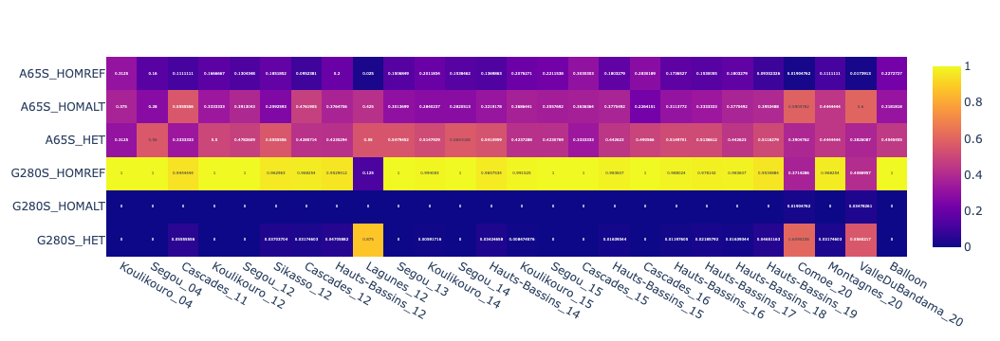

In [63]:
px.imshow(test_df, text_auto=True, aspect = 2)

Load SNP genotypes:   0%|          | 0/312 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/38 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/42906 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.



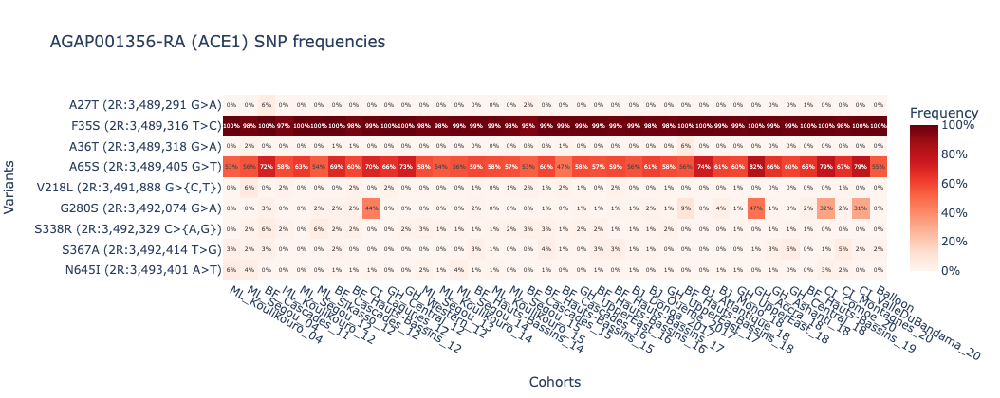

In [59]:
ace_aa_allele_freqs_df = ag3.aa_allele_frequencies(
     transcript=transcript_ace, 
     cohorts=ref_dict, 
     sample_sets=sample_sets, 
     drop_invariant=False,
)
ace_ns_aas_df = ace_aa_allele_freqs_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(ace_ns_aas_df, width=1100)

Load SNP genotypes:   0%|          | 0/312 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/38 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/42906 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f9da852e050> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.



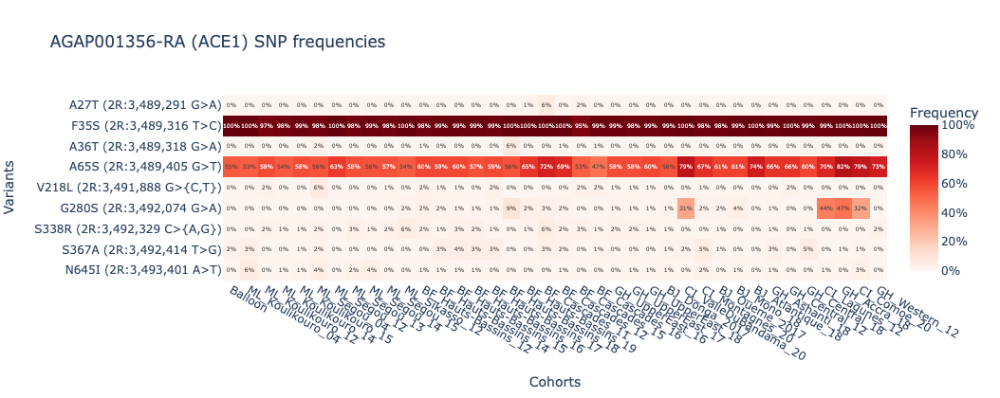

In [60]:
ace_aa_allele_freqs_lat_df = ag3.aa_allele_frequencies(
     transcript=transcript_ace, 
     cohorts=ref_dict_lat, 
     sample_sets=sample_sets, 
     drop_invariant=False,
)
ace_ns_aas_lat_df = ace_aa_allele_freqs_lat_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(ace_ns_aas_lat_df, width=1100)

### TEP

Load SNP genotypes:   0%|          | 0/152 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/26 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/14775 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f41305c6170> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f41305c6170> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.



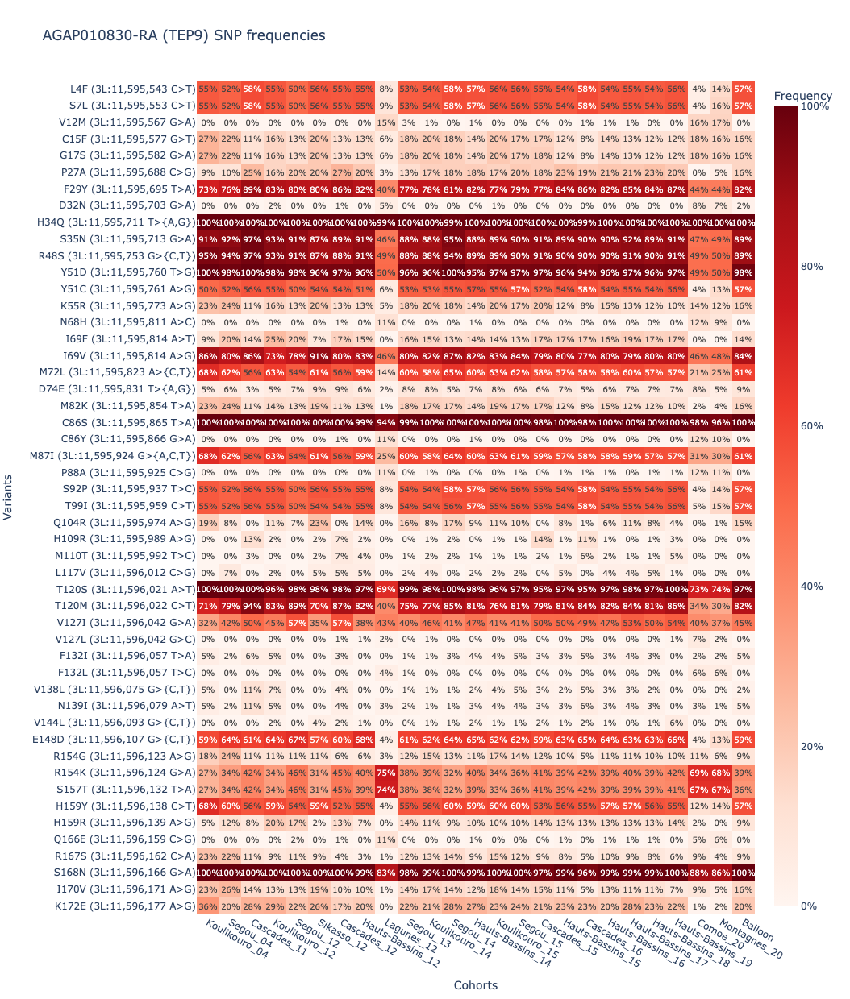

In [15]:
tep9_aa_allele_freqs_df = ag3.aa_allele_frequencies(
     transcript=transcript_tep9, 
     cohorts=ref_dict, 
     sample_sets=sample_sets, 
     drop_invariant=False,
)
tep9_ns_aas_df = tep9_aa_allele_freqs_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(tep9_ns_aas_df[:50])

### UKN

Load SNP genotypes:   0%|          | 0/152 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/26 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/7284 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f41305c6170> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f41305c6170> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.



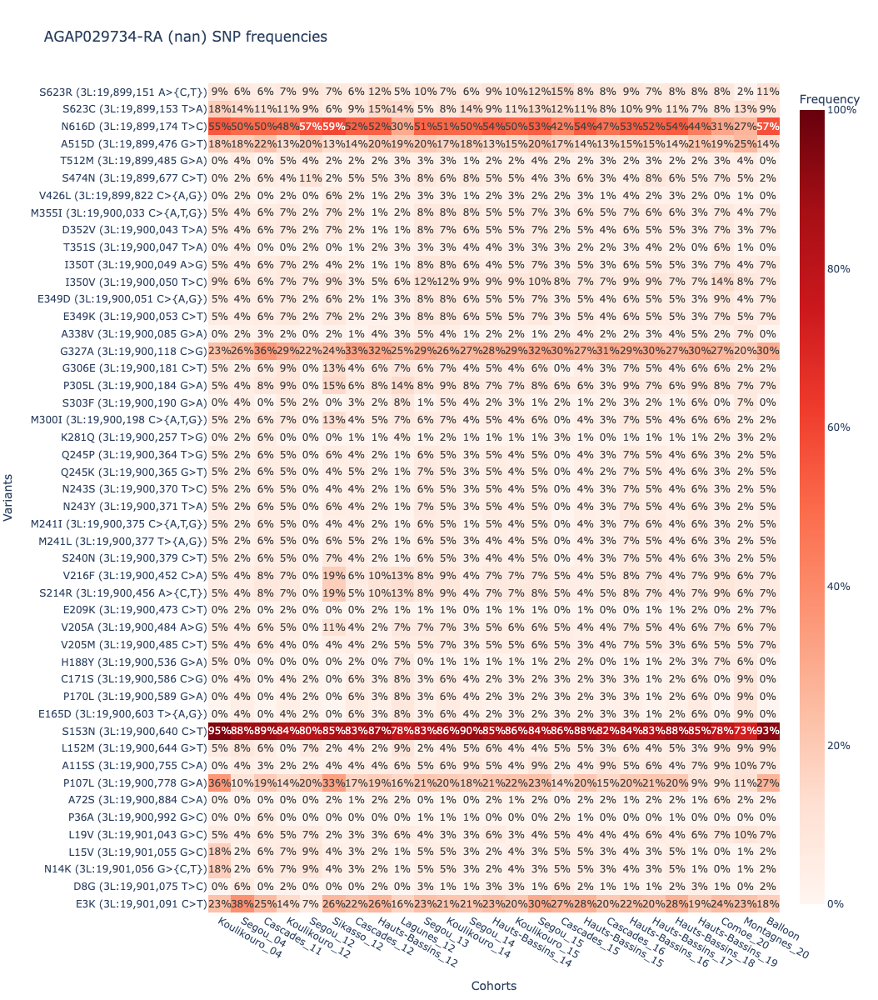

In [16]:
ukn1_aa_allele_freqs_df = ag3.aa_allele_frequencies(
     transcript=transcript_ukn1, 
     cohorts=ref_dict, 
     sample_sets=sample_sets, 
     drop_invariant=False,
)
ukn1_ns_aas_df = ukn1_aa_allele_freqs_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(ukn1_ns_aas_df)

### KEAP1

Load SNP genotypes:   0%|          | 0/312 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/38 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/56925 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f945c6cc160> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f945c6cc160> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.



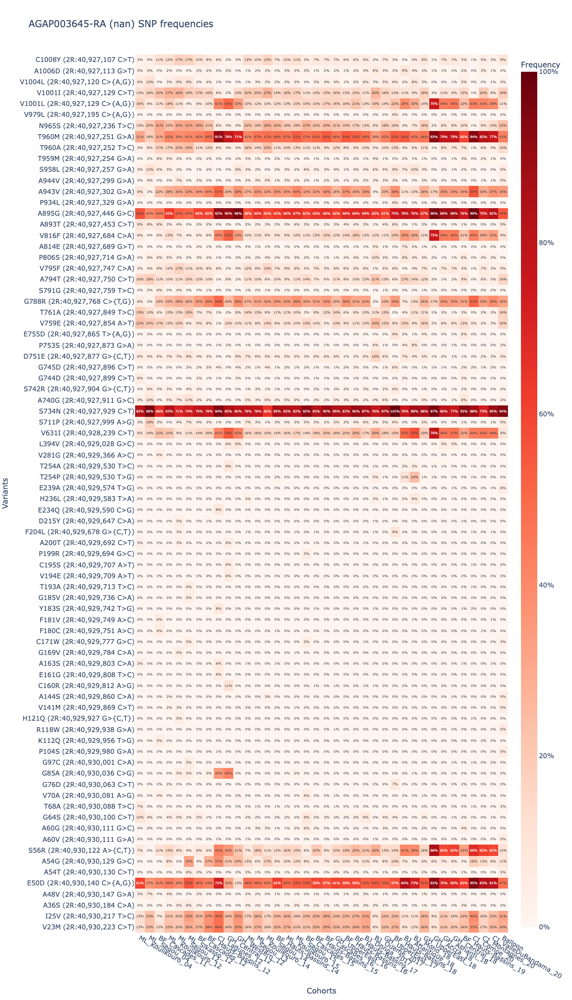

In [44]:
keap1_aa_allele_freqs_df = ag3.aa_allele_frequencies(
     transcript=transcript_keap1, 
     cohorts=ref_dict, 
     sample_sets=sample_sets, 
     drop_invariant=False,
)
keap1_ns_aas_df = keap1_aa_allele_freqs_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(keap1_ns_aas_df, width=1100)

Load SNP genotypes:   0%|          | 0/312 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/38 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/56925 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f945c6cc160> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:1881: FutureWarning:

The provided callable <function nansum at 0x7f945c6cc160> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.



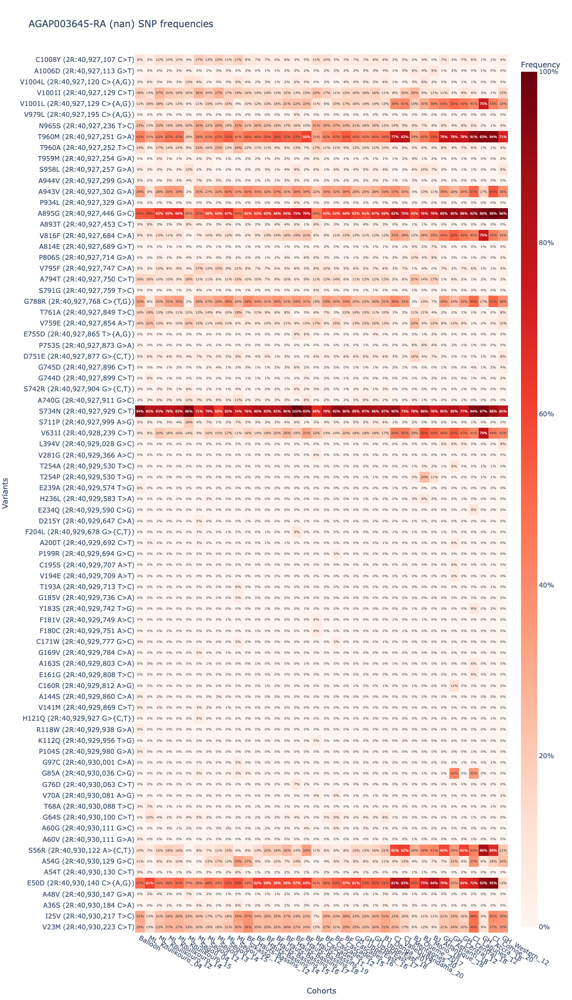

In [46]:
keap1_aa_allele_freqs_lat_df = ag3.aa_allele_frequencies(
     transcript=transcript_keap1, 
     cohorts=ref_dict_lat, 
     sample_sets=sample_sets, 
     drop_invariant=False,
)
keap1_ns_aas_lat_df = keap1_aa_allele_freqs_lat_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >= 0.05")
ag3.plot_frequencies_heatmap(keap1_ns_aas_lat_df, width=1100)

## CNVs

In [4]:
cyp6aap_region = "2R:28,480,000-28,510,000"
cyp325_region = "2R:17,550,000-17,600,000"
cyp9k1_region = "X:14,500,000-15,500,000"
gste_region = "3R:28,590,000-28,610,000"
cyp6mz_region = "3R:6,924,000-6,980,000"
ace_region = "2R:3,430,000-3,500,000"
ukn_region = "3L:19,850,000-19,900,000"
tep_region = "3L:11,000,000-11,700,000"
clip_region = "3L:33,250,000-33,300,000"

In [ ]:
cyp6aap_cnv_freqs_df = ag3.gene_cnv_frequencies(
    region=cyp6aap_region,
    cohorts=ref_dict,
    sample_sets=sample_sets,
    drop_invariant=False,
)
ag3.plot_frequencies_heatmap(
    cyp6aap_cnv_freqs_df.query("max_af > 0.05"), 
    title="Gene CNV frequencies, Cyp6aa/p locus",
    width = 1100
)

Load CNV HMM data:   0%|          | 0/984 [00:00<?, ?it/s]

Load CNV HMM data:   0%|          | 0/984 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/11 [00:00<?, ?it/s]

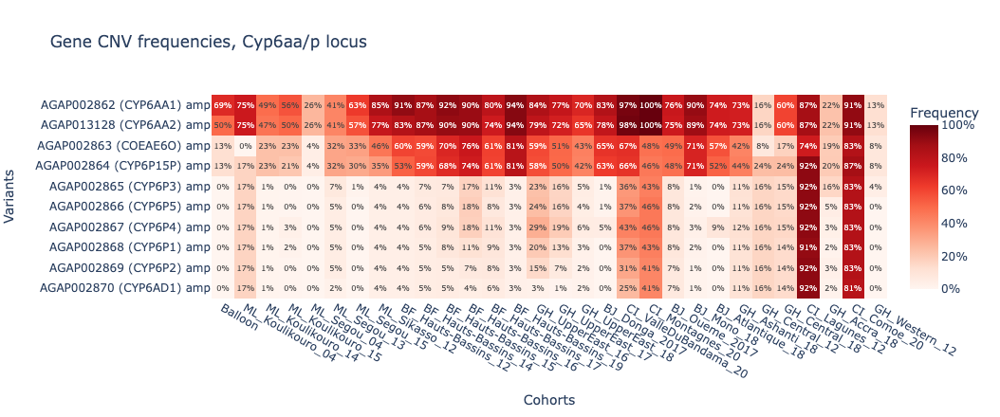

In [13]:
cyp6aap_cnv_freqs_lat_df = ag3.gene_cnv_frequencies(
    region=cyp6aap_region,
    cohorts=ref_dict_lat,
    sample_sets=sample_sets,
    drop_invariant=False,
)
ag3.plot_frequencies_heatmap(
    cyp6aap_cnv_freqs_lat_df.query("max_af > 0.05"), 
    title="Gene CNV frequencies, Cyp6aa/p locus",
    width = 1100
)

In [ ]:
cyp325_cnv_freqs_df = ag3.gene_cnv_frequencies(
    region=cyp325_region,
    cohorts=ref_dict,
    sample_sets=sample_sets,
    drop_invariant=False,
)
ag3.plot_frequencies_heatmap(
    cyp325_cnv_freqs_df.query("max_af > 0.05"), 
    title="Gene CNV frequencies, Cyp325 locus",
    width = 1100
)

Load CNV HMM data:   0%|          | 0/480 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/10 [00:00<?, ?it/s]

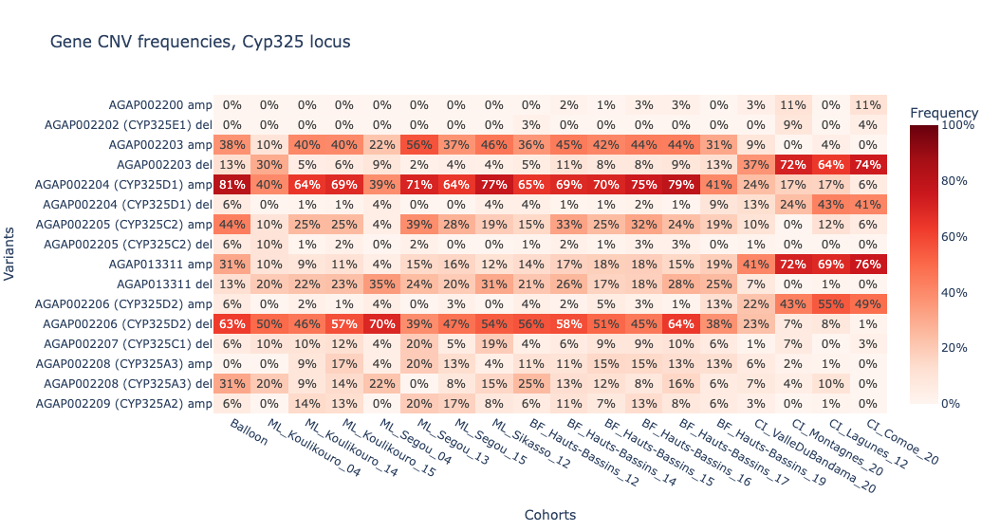

In [53]:
cyp325_cnv_freqs_lat_df = ag3.gene_cnv_frequencies(
    region=cyp325_region,
    cohorts=ref_dict_lat,
    sample_sets=sample_sets_no_3_9,
    drop_invariant=False,
)
ag3.plot_frequencies_heatmap(
    cyp325_cnv_freqs_lat_df.query("max_af > 0.05"), 
    title="Gene CNV frequencies, Cyp325 locus",
    width = 1100
)

Load CNV HMM data:   0%|          | 0/240 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/41 [00:00<?, ?it/s]

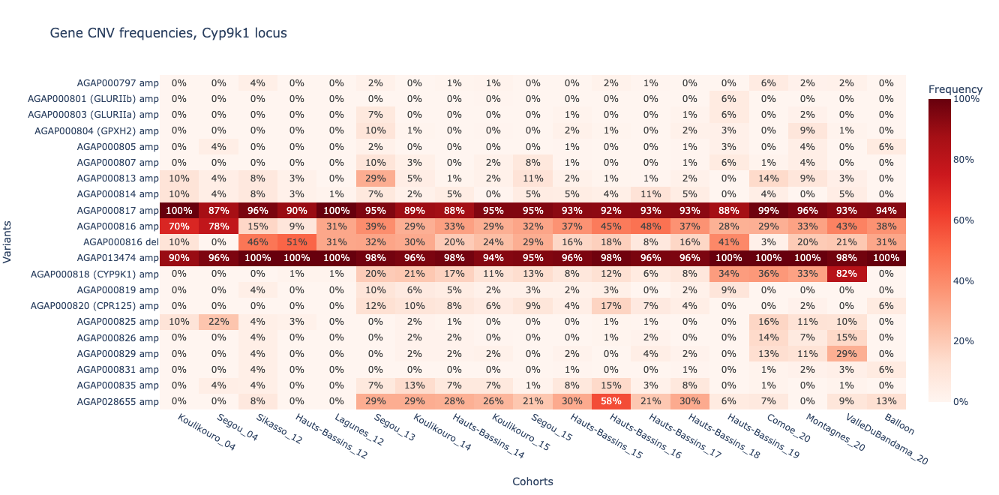

In [23]:
cyp9k1_cnv_freqs_df = ag3.gene_cnv_frequencies(
    region=cyp9k1_region,
    cohorts=ref_dict,
    sample_sets=sample_sets_no_3_9,
    drop_invariant=False,
)
ag3.plot_frequencies_heatmap(
    cyp9k1_cnv_freqs_df.query("max_af > 0.05"), 
    title="Gene CNV frequencies, Cyp9k1 locus"
)

Load CNV HMM data:   0%|          | 0/360 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/10 [00:00<?, ?it/s]

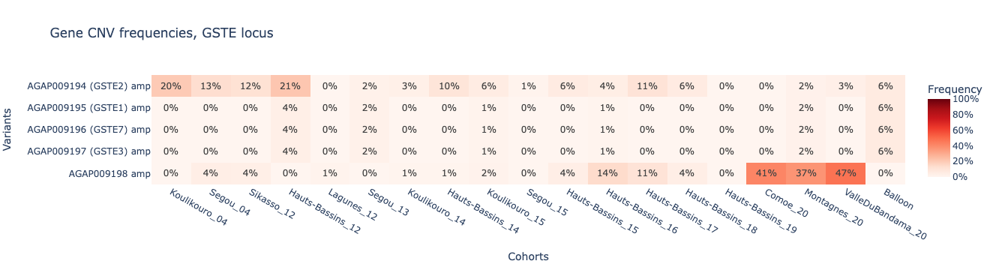

In [24]:
gste_cnv_freqs_df = ag3.gene_cnv_frequencies(
    region=gste_region,
    cohorts=ref_dict,
    sample_sets=sample_sets_no_3_9,
    drop_invariant=False,
)
ag3.plot_frequencies_heatmap(
    gste_cnv_freqs_df.query("max_af > 0.05"), 
    title="Gene CNV frequencies, GSTE locus"
)

Load CNV HMM data:   0%|          | 0/360 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/9 [00:00<?, ?it/s]

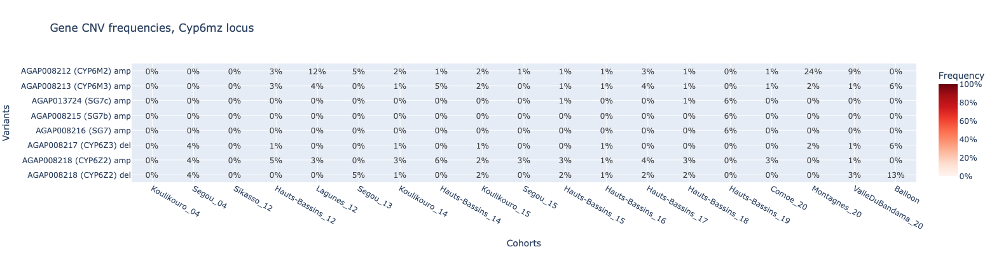

In [25]:
cyp6mz_cnv_freqs_df = ag3.gene_cnv_frequencies(
    region=cyp6mz_region,
    cohorts=ref_dict,
    sample_sets=sample_sets_no_3_9,
    drop_invariant=False,
)
ag3.plot_frequencies_heatmap(
    cyp6mz_cnv_freqs_df.query("max_af > 0.05"), 
    title="Gene CNV frequencies, Cyp6mz locus"
)

Load CNV HMM data:   0%|          | 0/480 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/5 [00:00<?, ?it/s]

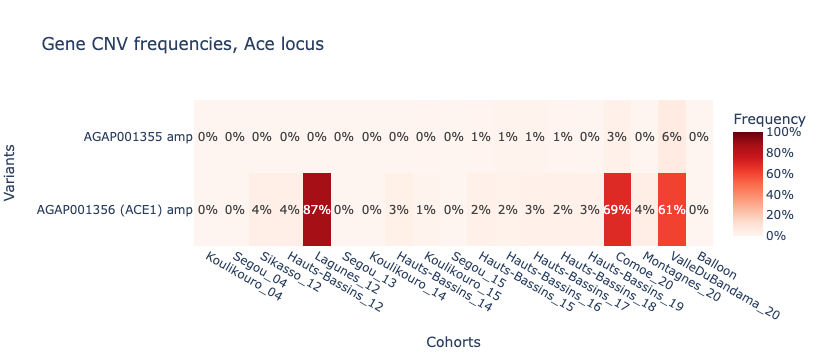

In [26]:
ace_cnv_freqs_df = ag3.gene_cnv_frequencies(
    region=ace_region,
    cohorts=ref_dict,
    sample_sets=sample_sets_no_3_9,
    drop_invariant=False,
)
ag3.plot_frequencies_heatmap(
    ace_cnv_freqs_df.query("max_af > 0.05"), 
    title="Gene CNV frequencies, Ace locus"
)

Load CNV HMM data:   0%|          | 0/360 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/9 [00:00<?, ?it/s]

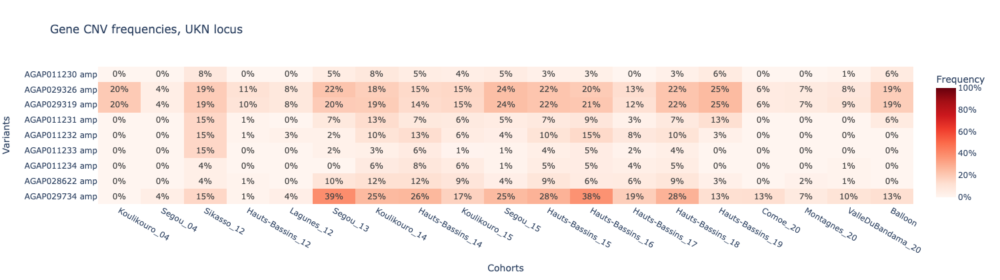

In [27]:
ukn_cnv_freqs_df = ag3.gene_cnv_frequencies(
    region=ukn_region,
    cohorts=ref_dict,
    sample_sets=sample_sets_no_3_9,
    drop_invariant=False,
)
ag3.plot_frequencies_heatmap(
    ukn_cnv_freqs_df.query("max_af > 0.05"), 
    title="Gene CNV frequencies, UKN locus"
)

Load CNV HMM data:   0%|          | 0/360 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/22 [00:00<?, ?it/s]

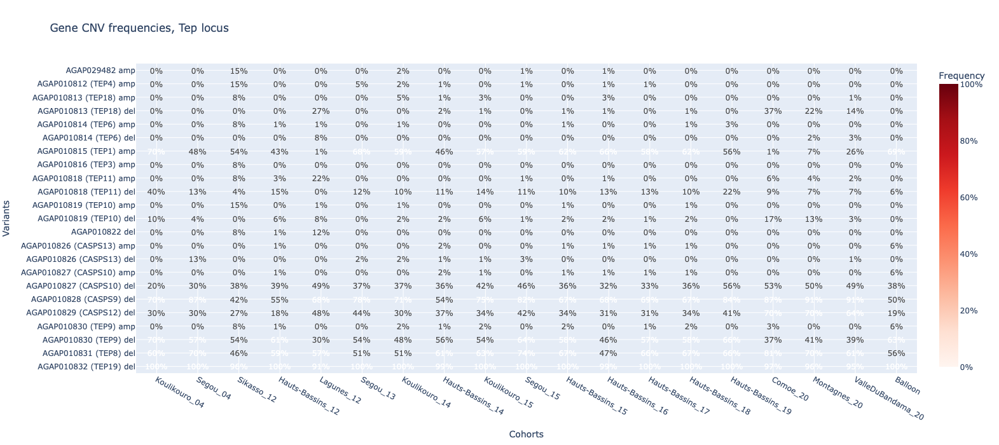

In [28]:
tep_cnv_freqs_df = ag3.gene_cnv_frequencies(
    region=tep_region,
    cohorts=ref_dict,
    sample_sets=sample_sets_no_3_9,
    drop_invariant=False,
)
ag3.plot_frequencies_heatmap(
    tep_cnv_freqs_df.query("max_af > 0.05"), 
    title="Gene CNV frequencies, Tep locus"
)

Load CNV HMM data:   0%|          | 0/360 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/16 [00:00<?, ?it/s]

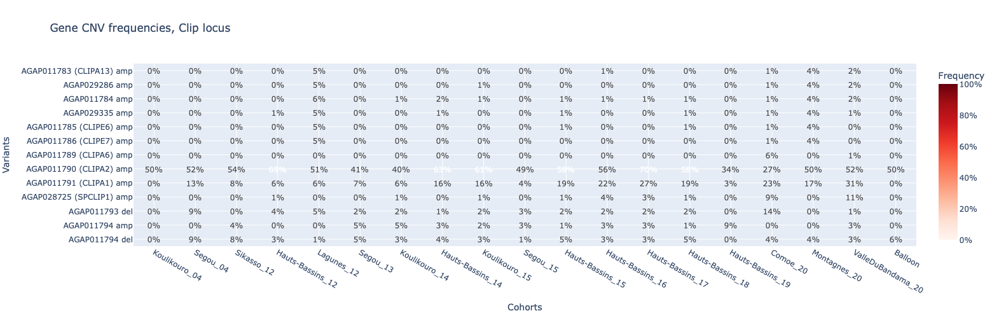

In [29]:
clip_cnv_freqs_df = ag3.gene_cnv_frequencies(
    region=clip_region,
    cohorts=ref_dict,
    sample_sets=sample_sets_no_3_9,
    drop_invariant=False,
)
ag3.plot_frequencies_heatmap(
    clip_cnv_freqs_df.query("max_af > 0.05"), 
    title="Gene CNV frequencies, Clip locus"
)

## Heterozygosity and RoH

In [30]:
for s in meta.query("sample_set == '1177-VO-ML-LEHMANN-VMF00015' and taxon == 'coluzzii'").sample_id:
#for c in ["2R", "2L", "3R", "3L", "X"]:
    fig = ag3.plot_heterozygosity(
        sample=s, 
        region='X', 
        site_mask="gamb_colu", 
        window_size=10_000,
    );

## H12

In [31]:
ag3.plot_h12_gwss(
    contig="2R", 
    analysis="gamb_colu", 
    window_size=1000, 
    sample_sets="1177-VO-ML-LEHMANN-VMF00015",
    sample_query="taxon == 'coluzzii'"
)

Load haplotypes:   0%|          | 0/138 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anoph/genome_features.py:333: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:3827: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:3827: UserWarning:

found multiple competing values for 'toolbar.active_inspect' property; using the latest value

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:3827: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



In [36]:
ag3.plot_h12_gwss(
    contig="2R", 
    analysis="gamb_colu", 
    window_size=1000, 
    min_cohort_size=10,
    sample_sets=sample_sets_no_3_9,
    sample_query=ref_dict["Koulikouro_04"]
)

Load haplotypes:   0%|          | 0/138 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anoph/genome_features.py:333: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:3827: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:3827: UserWarning:

found multiple competing values for 'toolbar.active_inspect' property; using the latest value

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:3827: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



In [ ]:
ag3.plot_h12_gwss(
    contig="2L", 
    analysis="gamb_colu", 
    window_size=1000, 
    sample_sets="1177-VO-ML-LEHMANN-VMF00015",
    sample_query="taxon == 'coluzzii'"
)

In [ ]:
ag3.plot_h12_gwss(
    contig="3R", 
    analysis="gamb_colu", 
    window_size=1000, 
    sample_sets="1177-VO-ML-LEHMANN-VMF00015",
    sample_query="taxon == 'coluzzii'"
)

In [ ]:
ag3.plot_h12_gwss(
    contig="3L", 
    analysis="gamb_colu", 
    window_size=1000, 
    sample_sets="1177-VO-ML-LEHMANN-VMF00015",
    sample_query="taxon == 'coluzzii'"
)

In [ ]:
ag3.plot_h12_gwss(
    contig="X", 
    analysis="gamb_colu", 
    window_size=1000, 
    sample_sets="1177-VO-ML-LEHMANN-VMF00015",
    sample_query="taxon == 'coluzzii'"
)

## H1X

In [13]:
ag3.plot_h1x_gwss(
    contig = "3R",
    window_size=1000,
    cohort1_query=ref_dict["Balloon"],
    cohort2_query=ref_dict['Koulikouro_14'],
    sample_sets=sample_sets
)

Load haplotypes for cohort 1:   0%|          | 0/104 [00:00<?, ?it/s]

Load haplotypes for cohort 2:   0%|          | 0/624 [00:00<?, ?it/s]

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anoph/genome_features.py:333: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:4121: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:4121: UserWarning:

found multiple competing values for 'toolbar.active_inspect' property; using the latest value

/home/jonbrenas/.local/lib/python3.10/site-packages/malariagen_data/anopheles.py:4121: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



## Haplotype networks

In [ ]:
df_taxon.loc[west_gambcolu_pca["sample_id"], "taxon"] = west_gambcolu_pca["taxon"].values

In [ ]:
ag3.plot_haplotype_clustering(
    region=cyp325_region,
    analysis='gamb_colu',
    sample_query= 'country in ["Mali", "Burkina Faso", "Cote d\'Ivoire"] and taxon == "coluzzii"',
    color="sample_set"
)

Load haplotypes:   0%|          | 0/38 [00:00<?, ?it/s]

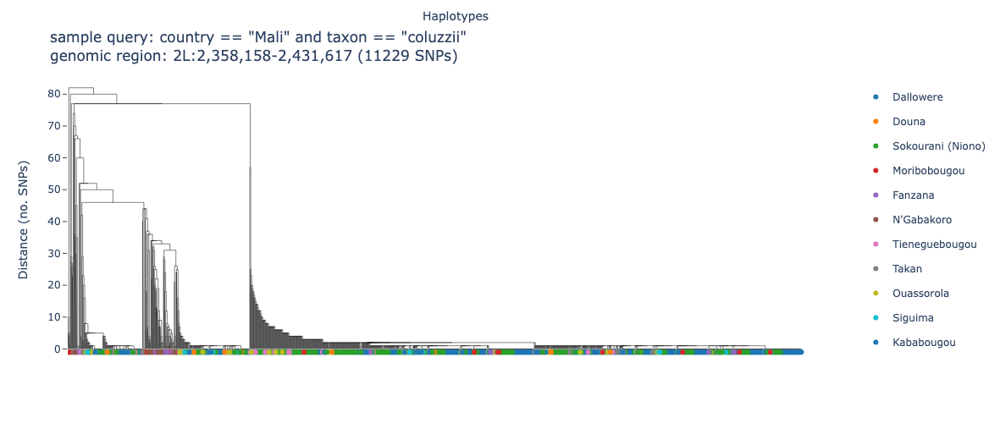

In [15]:
ag3.plot_haplotype_clustering(
    region='2L:2,358,158-2,431,617', #para
    analysis='gamb_colu',
    sample_query= 'country == "Mali" and taxon == "coluzzii"',
    color="location"
)

In [ ]:
ag3.plot_haplotype_clustering(
    region=gste_region,
    analysis='gamb_colu',
    sample_query= 'country == "Mali" and taxon == "coluzzii"',
    color="sample_set"
)

In [ ]:
ag3.plot_haplotype_clustering(
    region="2L:25,363,652-25,434,556", #Rdl
    analysis='gamb_colu',
    sample_query= 'country == "Mali" and taxon == "coluzzii"',
    color="sample_set"
)

In [ ]:
ag3.plot_haplotype_clustering(
    region=tep_region,
    analysis='gamb_colu',
    sample_query= 'country == "Mali" and taxon == "coluzzii"',
    color="sample_set"
)

In [25]:
sample_sets = meta_pre.sample_set.unique()
sample_sets_no_balloon = [sample_set for sample_set in sample_sets if sample_set != '1177-VO-ML-LEHMANN-VMF00015']